In [1]:
import sys # standard imports
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore", message=".*not compatible with tight_layout.*")
warnings.filterwarnings("ignore", message=".*DataFrame.applymap has been deprecated.*")
warnings.filterwarnings("ignore", message=".*Precision is ill-defined and being set to*")
warnings.filterwarnings("ignore", message=".*Recall is ill-defined and being set to*")

# ============================== VSCode Jupyter imports
print('cwd:', os.getcwd())
print('top sys.path entries:')
for p in sys.path[:6]:
    print('  ', p)

nb_dir = r"C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation"
if nb_dir not in sys.path:
    sys.path.insert(0, nb_dir)
print('util file exists:', os.path.exists(f'{nb_dir}/mrs_analysis_utils.py'))
# ==============================

from sklearn.mixture import GaussianMixture # custom and specialised imports
from scipy.stats import gaussian_kde, zscore
from sklearn.neighbors import KernelDensity
from matplotlib.colors import to_rgb, rgb_to_hsv, hsv_to_rgb
from matplotlib.collections import LineCollection
from matplotlib import lines as mlines, colors as mcolors
from numpy.linalg import eigh
from mrs_analysis_utils import read_xml, load_sources, load_weights


s_tree_path = r'data\1TE-ShortMRS(corregido).xml'
l_tree_path = r'data\1TE-LongMRS(corregido).xml'
case_folder = 'data/split_cases/'
results_folder = 'results/cNMF/'
experiments = [['a2', 'no'], ['mm', 'me'], ['mm', 'me', 'a2'], ['mm', 'me', 'no'], ['mm', 'gl', 'a2'], ['mm', 'gl', 'no']]
colours_dict_label = {'no' : 'green', 'a2' : 'blue', 'mm' : 'darkgray', 'gl' : 'red', 'me' : 'orange'}
best_sources = {
    'MMvME@LTE'   : '10', 'MMvME@STE'   : '10', # select the opitimal cNMF runs for
    'A2vNO@LTE'   : '10',  'A2vNO@STE'   : '2', # each experiment
    'MMvMEvA2@LTE': '3',  'MMvMEvA2@STE': '3',
    'MMvMEvNO@LTE': '3',  'MMvMEvNO@STE': '3',
    'MMvGLvA2@LTE': '1',  'MMvGLvA2@STE': '1',
    'MMvGLvNO@LTE': '1',  'MMvGLvNO@STE': '2',
               }
source_shift_config = {
    'A2vNO@STE' :   1,
    'MMvME@STE' :   1,
    'MMvMEvA2@STE': 1,
    'MMvMEvNO@LTE': 2,
    'MMvMEvNO@STE': 2
}

debug = True

cwd: c:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation
top sys.path entries:
   C:\Users\matth\AppData\Local\Python\pythoncore-3.14-64\python314.zip
   C:\Users\matth\AppData\Local\Python\pythoncore-3.14-64\DLLs
   C:\Users\matth\AppData\Local\Python\pythoncore-3.14-64\Lib
   C:\Users\matth\AppData\Local\Python\pythoncore-3.14-64
   c:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\venv
   
util file exists: True


### Function definitions

Plotting functions

In [2]:
def plot_gaussian_ellipsoid(ax, mean, cov, n_std=1.0, color="C0", alpha=0.15, n_points=20, fill=True):
    dim = mean.size

    if dim == 2:

        # Compute eigendecomposition of covariance
        vals, vecs = eigh(cov)

        # Sort eigenvalues & vectors descending
        order = vals.argsort()[::-1]
        vals = vals[order]
        vecs = vecs[:,order]

        # Radii of principal axes
        radii = n_std * np.sqrt(vals)

        # Parameterize perfect circle
        theta = np.linspace(0, 2*np.pi, n_points)
        circle = np.vstack((np.cos(theta), np.sin(theta)))  # (2,n)

        # Transform circle → ellipse
        ellipse = vecs @ np.diag(radii) @ circle  # (2,n)
        ellipse = ellipse.T + mean                # (n,2)

        # Filled region
        ax.fill(ellipse[:,0], ellipse[:,1],
                facecolor=color, alpha=alpha*0.8, edgecolor='none')

        # Boundary outline
        ax.plot(ellipse[:,0], ellipse[:,1],
                color=color, linewidth=1.5, alpha=1.0)

        return

    # ==================================
    # 3D VERSION (unchanged)
    # ==================================
    elif dim == 3:
        vals, vecs = eigh(cov)
        radii = n_std * np.sqrt(np.maximum(vals, 0))

        # Sphere param
        u = np.linspace(0, 2*np.pi, n_points)
        v = np.linspace(0, np.pi, n_points)

        x = np.outer(np.cos(u), np.sin(v))
        y = np.outer(np.sin(u), np.sin(v))
        z = np.outer(np.ones_like(u), np.cos(v))

        xyz = np.stack((x, y, z), axis=-1)
        xyz *= radii
        xyz = xyz @ vecs.T
        xyz += mean

        X, Y, Z = xyz[...,0], xyz[...,1], xyz[...,2]

        ax.plot_surface(
            X, Y, Z,
            rstride=1, cstride=1,
            color=color, alpha=alpha,
            linewidth=0, shade=True
        )
        return

    else:
        raise ValueError(f"dim = {dim} not supported")

def update_limits(cur_min, cur_max, values):
    if values is None:
        return cur_min, cur_max
    arr = np.asarray(values).astype(float).ravel()
    arr = arr[np.isfinite(arr)]
    if arr.size == 0:
        return cur_min, cur_max
    mn, mx = arr.min(), arr.max()
    cur_min = mn if cur_min is None else min(cur_min, mn)
    cur_max = mx if cur_max is None else max(cur_max, mx)
    return cur_min, cur_max

def finalize(cur_min, cur_max, pad=0.05, default=(0.0, 1.0)):
    if cur_min is None or cur_max is None:
        return default
    if not (np.isfinite(cur_min) and np.isfinite(cur_max)):
        return default
    span = cur_max - cur_min
    cur_min -= pad * span
    cur_max += pad * span
    return cur_min, cur_max

def compute_global_limits_for_model(
    model,
    raw_weights,
    raw_data_frames,
    gmm_weight_relabelled,
    kde_weight_relabelled,
    reconstructed_df,
    optimal_config_map,
):
    
    w1_min = w1_max = None
    w2_min = w2_max = None
    w3_min = w3_max = None
    raw_y_min = raw_y_max = None
    syn_y_min = syn_y_max = None

    for key in raw_weights.keys():
        rw = raw_weights[key]
        raw_df = raw_data_frames[key]
        spec_cols = [c for c in raw_df.columns if c not in ["labels", "case_ids"]]

        if "w1" in rw: w1_min, w1_max = update_limits(w1_min, w1_max, rw["w1"])
        if "w2" in rw: w2_min, w2_max = update_limits(w2_min, w2_max, rw["w2"])
        if "w3" in rw: w3_min, w3_max = update_limits(w3_min, w3_max, rw["w3"])
        raw_y_min, raw_y_max = update_limits(raw_y_min, raw_y_max, raw_df[spec_cols].values)

        optimal_param = optimal_config_map[model].get(key)
        if optimal_param is None:
            continue

        if model == "GMM":
            weights_dict = gmm_weight_relabelled
            model_key = "GMM"
        else:
            weights_dict = kde_weight_relabelled
            model_key = "KDE"

        try:
            syn_w = weights_dict[key][optimal_param]
            entry = reconstructed_df[model_key][key][optimal_param][0]
        except KeyError as e:
            print(f"Could not find key {e}")
            continue

        if "w1" in syn_w: w1_min, w1_max = update_limits(w1_min, w1_max, syn_w["w1"])
        if "w2" in syn_w: w2_min, w2_max = update_limits(w2_min, w2_max, syn_w["w2"])
        if "w3" in syn_w: w3_min, w3_max = update_limits(w3_min, w3_max, syn_w["w3"])
        syn_y_min, syn_y_max = update_limits(syn_y_min, syn_y_max, entry["data"])

    if syn_y_min is None or syn_y_max is None:
        syn_y_min, syn_y_max = raw_y_min, raw_y_max
    if raw_y_min is None or raw_y_max is None:
        raw_y_min, raw_y_max = 0.0, 1.0
    if syn_y_min is None or syn_y_max is None:
        syn_y_min, syn_y_max = 0.0, 1.0

    return {
        "w1": finalize(w1_min, w1_max),
        "w2": finalize(w2_min, w2_max),
        "w3": finalize(w3_min, w3_max),
        "raw_y": finalize(raw_y_min, raw_y_max, pad=0.0, default=(0.0, 1.0)),
        "syn_y": finalize(syn_y_min, syn_y_max, pad=0.0, default=(0.0, 1.0)),
    }

def compute_shading(weights_df, colours_dict_label):
    w_cols = [c for c in weights_df.columns if c.startswith("w")]
    d = np.linalg.norm(weights_df[w_cols].values, axis=1)
    dmin, dmax = d.min(), d.max()

    shades = []
    for lbl, dist in zip(weights_df["true_label"], d):
        
        base_color = colours_dict_label.get(lbl, "black")

        t = (dist - dmin) / (dmax - dmin + 1e-12)  # avoid division by zero

        r, g, b = to_rgb(base_color)
        h, s, v = rgb_to_hsv([r, g, b])

        v_new = 0.10 + (0.95 - 0.10) * (1 - t)
        s_min = max(0, s - 0.15)
        s_max = min(1, s + 0.10)
        s_new = s_max - (s_max - s_min) * (1 - t)

        r2, g2, b2 = hsv_to_rgb([h, s_new, v_new])
        shades.append((r2, g2, b2))

    weights_df["shade"] = shades
    return weights_df

def plot_simple_scatter(ax, df, colours_dict_label, global_limits):
    is_3d = ("w3" in df.columns)

    if not is_3d:
        # 2D case
        groups = {lab: sub for lab, sub in df.groupby("true_label")}
        for lab, sub in groups.items():
            ax.scatter(
                sub["w1"], sub["w2"],
                c=list(sub["shade"]),
                s=45, edgecolor="k", linewidth=0.3,
                label=lab
            )
        ax.set_xlabel("w1")
        ax.set_ylabel("w2")
        ax.set_xlim(*global_limits["w1"])
        ax.set_ylim(*global_limits["w2"])
        ax.grid(True)  # FIX 1: Add grid
        ax.legend(title="Label")
    else:
        # 3D case
        groups = {lab: sub for lab, sub in df.groupby("true_label")}
        for lab, sub in groups.items():
            ax.scatter(
                sub["w1"], sub["w2"], sub["w3"],
                c=list(sub["shade"]),
                s=45, edgecolor="k", linewidth=0.3,
                label=lab
            )
        ax.set_xlabel("w1")
        ax.set_ylabel("w2")
        ax.set_zlabel("w3")
        ax.set_xlim(*global_limits["w1"])
        ax.set_ylim(*global_limits["w2"])
        if global_limits["w3"][0] is not None:
            ax.set_zlim(*global_limits["w3"])
        ax.legend(title="Label")

def plot_advanced_scatter(ax, df, colours_dict_label, global_limits, outlier_sd=3.0):
    is_3d = ("w3" in df.columns)
    all_out = []

    groups = df.groupby("true_label")
    unique_labels = sorted(df["true_label"].unique())

    groups = {lab: sub for lab, sub in df.groupby("true_label")}
    for lab, sub in groups.items():
        if sub.empty or len(sub) < 5:  
            continue

        base_color = colours_dict_label.get(lab, "C0")
        
        cols = ["w1", "w2", "w3"] if is_3d else ["w1", "w2"]

        data = sub[cols].astype(float)
        
        zs = (data - data.mean()) / data.std().replace(0, 1)
        out_mask = (zs.abs() > outlier_sd).any(axis=1)
        inliers = sub.loc[~out_mask]
        
        if len(inliers) >= 5:
            inlier_data = inliers[cols].to_numpy()
            mean = inlier_data.mean(axis=0)
            cov = np.cov(inlier_data, rowvar=False) + np.eye(len(cols)) * 1e-6

            if not is_3d:
                for n_std, alpha in zip([1, 2, 3], [0.45, 0.25, 0.12]):
                    plot_gaussian_ellipsoid(ax, mean, cov, n_std=n_std,
                                            color=base_color, alpha=alpha)
            else:
                for n_std, alpha in zip([1, 2, 3], [0.30, 0.18, 0.10]):
                    plot_gaussian_ellipsoid(ax, mean, cov, n_std=n_std,
                                            color=base_color, alpha=alpha)

        # --- Plot Inlier Points (Scatter) ---
        if not is_3d:
            ax.scatter(
                inliers["w1"], inliers["w2"],
                c=list(inliers["shade"]),
                s=45, edgecolor="k", linewidth=0.3
            )
        else:
            # 3D Inliers are plotted here
            ax.scatter(
                inliers["w1"], inliers["w2"], inliers["w3"],
                c=list(inliers["shade"]),
                s=40, label=lab, zorder=5
            )

    # --- 2. Plot Outliers (Drawn last for visibility) ---
    groups = {lab: sub for lab, sub in df.groupby("true_label")}
    for lab, sub in groups.items():
        if sub.empty:
            continue
            
        # Re-calculate Z-score/mask using class-specific stats (same as above)
        if is_3d:
            cols = ["w1", "w2", "w3"]
        else:
            cols = ["w1", "w2"]
            
        data = sub[cols].astype(float)
        zs = (data - data.mean()) / data.std().replace(0, 1)
        out_mask = (zs.abs() > outlier_sd).any(axis=1)
        outliers = sub.loc[out_mask]

        for _, row in outliers.iterrows():
            if not is_3d:
                # 2D Outlier
                all_out.append((lab, row["w1"], row["w2"]))
                ax.scatter(row["w1"], row["w2"], s=40, c=colours_dict_label.get(lab, "k"),
                           edgecolors="k", linewidths=0.5, zorder=9)
                ax.scatter(row["w1"], row["w2"], s=200, facecolors="none",
                           edgecolors="red", linewidths=2.5, zorder=10)
            else:
                # 3D Outlier
                all_out.append((lab, row["w1"], row["w2"], row["w3"]))
                ax.scatter(row["w1"], row["w2"], row["w3"], s=40, c=colours_dict_label.get(lab, "k"),
                           edgecolors="k", linewidths=0.5, zorder=9)
                ax.scatter(row["w1"], row["w2"], row["w3"], s=300, facecolors="none",
                           edgecolors="red", linewidths=2.5, zorder=10)

    # --- 3. Set Limits and Legend (Unchanged) ---
    xlims = global_limits["w1"]
    ylims = global_limits["w2"]

    ax.set_xlim(*xlims)
    ax.set_ylim(*ylims)
    ax.set_xlabel("w1")
    ax.set_ylabel("w2")
    
    if is_3d:
        zlims = global_limits["w3"]
        if zlims[0] is not None:
            ax.set_zlim(*zlims)
        ax.set_zlabel("w3")

    # Add grid only for 2D, as 3D plots rarely use them effectively
    if not is_3d:
        ax.grid(True)
    
    legend_handles = []
    legend_labels = []

    # Class handles
    for lab in unique_labels:
        legend_handles.append(
            mlines.Line2D([], [], marker="o",
                          color=colours_dict_label.get(lab, "C0"),
                          markersize=8, linestyle="None")
        )
        legend_labels.append(lab)

    # Outlier entry
    out_h = mlines.Line2D([], [], marker="o", color="none",
                          markerfacecolor="none", markeredgecolor="red",
                          markersize=10 if not is_3d else 15, linewidth=2.5)
    
    legend_handles.append(out_h)
    legend_labels.append(f"Outliers (n={len(all_out)})")

    ax.legend(legend_handles, legend_labels, title="Label", loc="upper left")

Data synthesis functions

In [3]:
def force_non_negative(arr):
    """Clip negative values to zero."""
    eps = 1e-10
    out = np.clip(arr, a_min=0, a_max=None)
    out[out == 0] = eps
    return out

def build_weight_df_from_synthetic(model_name, exp_key, reconstructed_df, gmm_synthetic_weights, kde_synthetic_weights, best_param_key):
    """
    Convert reconstructed_df[model][exp_key][param_key]
    into a DataFrame identical to `real_weights[key]`.
    """
    entry_list = reconstructed_df[model_name][exp_key][best_param_key]

    # Usually the first entry is correct (your list only holds 1)
    entry = entry_list[0]

    syn_data = entry["data"]      # ndarray, shape (N, n_points)
    labels  = entry["labels"]     # ndarray, shape (N,)

    # But we need weights, not reconstructed spectra → so use synthetic WEIGHTS, not reconstructed spectra
    # This is VERY important: reconstruct_df stores spectra, not weights
    # So we use the *relabelled synthetic WEIGHT dictionary*
    if model_name == "GMM":
        syn_df = gmm_synthetic_weights[exp_key][best_param_key]
    else:
        syn_df = kde_synthetic_weights[exp_key][best_param_key]

    # select only w1,w2,(w3) and true_label
    cols = [c for c in syn_df.columns if c.startswith("w")] + ["true_label"]
    return syn_df[cols].copy()

def l2_normalise_raw_frames(raw_data_frames):
    """
    Takes the existing dict of raw_data_frames (run_key → DataFrame)
    and returns a new dict where each spectrum (row) is L2-normalised.
    
    Compatibility:
      - Keeps 'labels' column unchanged
      - Normalises only spectral intensity columns
      - Output DataFrames match the structure expected by your plotting functions
    """
    normalised_frames = {}

    for run_key, df in raw_data_frames.items():

        # Separate spectra and labels
        spectra_only = df.drop(columns=['labels', 'case_id']).values.astype(float)
        labels = df['labels'].copy()
        case_ids = df['case_id'].copy()

        # Compute L2 norm per row
        norms = np.linalg.norm(spectra_only, axis=1, keepdims=True)

        # Avoid division by zero (flat spectra)
        norms[norms == 0] = 1.0

        # Normalise each spectrum
        spectra_norm = spectra_only / norms

        # Rebuild DataFrame
        norm_df = pd.DataFrame(spectra_norm, columns=df.columns[:-2])
        norm_df['labels'] = labels.values
        norm_df['case_ids'] = case_ids.values

        normalised_frames[run_key] = norm_df

    return normalised_frames

def l2_normalise_synthetic(data_array):
    """
    data_array: ndarray of shape (N_samples, N_points)
    Returns L2-normalised spectra (each row independently).
    """
    data = data_array.astype(float)
    norms = np.linalg.norm(data, axis=1, keepdims=True)
    norms[norms == 0] = 1.0   # avoid division by zero
    return data / norms

def generate_synthetic_weights(real_data, model):
    m_factor = 2
    synthetic_weights = {}
    eval_metrics = {}

    for key, weights in real_data.items():
        is2d = weights.shape[1] == 4
        temp_synthetic_weights = []

        weights_data = weights[['w1', 'w2', 'true_label']] if is2d else weights[['w1', 'w2', 'w3', 'true_label']]
        log_l_list = []

        for label in weights_data['true_label'].unique():
            group = weights_data[weights_data['true_label'] == label][['w1', 'w2']] if is2d else \
                    weights_data[weights_data['true_label'] == label][['w1', 'w2', 'w3']]

            group = group.values
            try:
                if group.shape[0] < model.n_components:
                    continue
            except:
                pass

            num_cases = group.shape[0]
            model.fit(group)

            # Sample until we have enough strictly positive samples
            accepted = []
            while len(accepted) < num_cases * m_factor:
                needed = num_cases * m_factor - len(accepted)
                sampled = model.sample(needed * 2)[0] if isinstance(model, GaussianMixture) else model.sample(needed * 2)

                strictly_positive = sampled[(sampled > 0).all(axis=1)]
                accepted.extend(strictly_positive[:needed])

            synth_weight = np.array(accepted[:num_cases * m_factor])
            temp_data_pt = pd.DataFrame(synth_weight, columns=['w1', 'w2'] if is2d else ['w1', 'w2', 'w3'])
            temp_data_pt['true_label'] = label
            temp_synthetic_weights.append(temp_data_pt)

            if not isinstance(model, GaussianMixture):
                log_l = model.score_samples(group)
                log_l_list.extend(log_l)

        synthetic_weights[key] = pd.concat(temp_synthetic_weights, ignore_index=True)

        if isinstance(model, GaussianMixture):
            eval_metrics[key] = f'{model.bic(group):.4f}'
        else:
            n = len(group)
            k = group.shape[1]
            ll = np.sum(log_l_list)
            aic = 2 * k - 2 * ll
            bic = np.log(n) * k - 2 * ll
            eval_metrics[key] = f'{bic:.4f}'

    return synthetic_weights, eval_metrics

Error and class. functions

In [4]:
def mean_squared_error(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    return np.mean((y_true - y_pred)**2)

In [5]:
from __future__ import division
 
def cmdscale(D):
    """                                                                                       
    Classical multidimensional scaling (MDS)                                                  
                                                                                               
    Parameters                                                                                
    ----------                                                                                
    D : (n, n) array                                                                          
        Symmetric distance matrix.                                                            
                                                                                               
    Returns                                                                                   
    -------                                                                                   
    Y : (n, p) array                                                                          
        Configuration matrix. Each column represents a dimension. Only the                    
        p dimensions corresponding to positive eigenvalues of B are returned.                 
        Note that each dimension is only determined up to an overall sign,                    
        corresponding to a reflection.                                                        
                                                                                               
    e : (n,) array                                                                            
        Eigenvalues of B.                                                                     
                                                                                               
    """
    # Number of points                                                                        
    n = len(D)
 
    # Centering matrix                                                                        
    H = np.eye(n) - np.ones((n, n))/n
 
    # YY^T                                                                                    
    B = -H.dot(D**2).dot(H)/2
 
    # Diagonalize                                                                             
    evals, evecs = np.linalg.eigh(B)
 
    # Sort by eigenvalue in descending order                                                  
    idx   = np.argsort(evals)[::-1]
    evals = evals[idx]
    evecs = evecs[:,idx]
 
    # Compute the coordinates using positive-eigenvalued components only                      
    w, = np.where(evals > 0)
    L  = np.diag(np.sqrt(evals[w]))
    V  = evecs[:,w]
    Y  = V.dot(L)
 
    return Y, evals[evals > 0]

def sammon(x, n, display = 2, inputdist = 'raw', maxhalves = 20, maxiter = 500, tolfun = 1e-9, init = 'default'):

    import numpy as np 
    from scipy.spatial.distance import cdist
    """Perform Sammon mapping on dataset x

    y = sammon(x) applies the Sammon nonlinear mapping procedure on
    multivariate data x, where each row represents a pattern and each column
    represents a feature.  On completion, y contains the corresponding
    co-ordinates of each point on the map.  By default, a two-dimensional
    map is created.  Note if x contains any duplicated rows, SAMMON will
    fail (ungracefully). 

    [y,E] = sammon(x) also returns the value of the cost function in E (i.e.
    the stress of the mapping).

    An N-dimensional output map is generated by y = sammon(x,n) .

    A set of optimisation options can be specified using optional
    arguments, y = sammon(x,n,[OPTS]):

       maxiter        - maximum number of iterations
       tolfun         - relative tolerance on objective function
       maxhalves      - maximum number of step halvings
       input          - {'raw','distance'} if set to 'distance', X is 
                        interpreted as a matrix of pairwise distances.
       display        - 0 to 2. 0 least verbose, 2 max verbose.
       init           - {'pca', 'cmdscale', random', 'default'}
                        default is 'pca' if input is 'raw', 
                        'msdcale' if input is 'distance'

    The default options are retrieved by calling sammon(x) with no
    parameters.

    File        : sammon.py
    Date        : 18 April 2014
    Authors     : Tom J. Pollard (tom.pollard.11@ucl.ac.uk)
                : Ported from MATLAB implementation by 
                  Gavin C. Cawley and Nicola L. C. Talbot

    Description : Simple python implementation of Sammon's non-linear
                  mapping algorithm [1].

    References  : [1] Sammon, John W. Jr., "A Nonlinear Mapping for Data
                  Structure Analysis", IEEE Transactions on Computers,
                  vol. C-18, no. 5, pp 401-409, May 1969.

    Copyright   : (c) Dr Gavin C. Cawley, November 2007.

    This program is free software; you can redistribute it and/or modify
    it under the terms of the GNU General Public License as published by
    the Free Software Foundation; either version 2 of the License, or
    (at your option) any later version.

    This program is distributed in the hope that it will be useful,
    but WITHOUT ANY WARRANTY; without even the implied warranty of
    MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
    GNU General Public License for more details.

    You should have received a copy of the GNU General Public License
    along with this program; if not, write to the Free Software
    Foundation, Inc., 59 Temple Place, Suite 330, Boston, MA 02111-1307 USA

    """

    # Create distance matrix unless given by parameters
    if inputdist == 'distance':
        D = x
        if init == 'default':
            init = 'cmdscale'
    else:
        D = cdist(x, x)
        if init == 'default':
            init = 'pca'

    if inputdist == 'distance' and init == 'pca':
        raise ValueError("Cannot use init == 'pca' when inputdist == 'distance'")

    if np.count_nonzero(np.diagonal(D)) > 0:
        raise ValueError("The diagonal of the dissimilarity matrix must be zero")

    # Remaining initialisation
    N = x.shape[0]
    scale = 0.5 / D.sum()
    D = D + np.eye(N)     

    if np.count_nonzero(D<=0) > 0:
        raise ValueError("Off-diagonal dissimilarities must be strictly positive")   

    Dinv = 1 / D
    if init == 'pca':
        [UU,DD,_] = np.linalg.svd(x)
        y = UU[:,:n]*DD[:n] 
    elif init == 'cmdscale':
        y,e = cmdscale(D)
        y = y[:,:n]
    else:
        y = np.random.normal(0.0,1.0,[N,n])
    one = np.ones([N,n])
    d = cdist(y,y) + np.eye(N)
    dinv = 1. / d
    delta = D-d 
    E = ((delta**2)*Dinv).sum() 

    # Get on with it
    for i in range(maxiter):

        # Compute gradient, Hessian and search direction (note it is actually
        # 1/4 of the gradient and Hessian, but the step size is just the ratio
        # of the gradient and the diagonal of the Hessian so it doesn't
        # matter).
        delta = dinv - Dinv
        deltaone = np.dot(delta,one)
        g = np.dot(delta,y) - (y * deltaone)
        dinv3 = dinv ** 3
        y2 = y ** 2
        H = np.dot(dinv3,y2) - deltaone - np.dot(2,y) * np.dot(dinv3,y) + y2 * np.dot(dinv3,one)
        s = -g.flatten(order='F') / np.abs(H.flatten(order='F'))
        y_old    = y

        # Use step-halving procedure to ensure progress is made
        for j in range(maxhalves):
            s_reshape = np.reshape(s, (-1,n),order='F')
            y = y_old + s_reshape
            d = cdist(y, y) + np.eye(N)
            dinv = 1 / d
            delta = D - d
            E_new = ((delta**2)*Dinv).sum()
            if E_new < E:
                break
            else:
                s = 0.5*s

        # Bomb out if too many halving steps are required
        if j == maxhalves-1:
            print('Warning: maxhalves exceeded. Sammon mapping may not converge...')

        # Evaluate termination criterion
        if abs((E - E_new) / E) < tolfun:
            if display:
                print('TolFun exceeded: Optimisation terminated')
            break

        # Report progress
        E = E_new
        if display > 1:
            print('epoch = %d : E = %12.10f'% (i+1, E * scale))

    if i == maxiter-1:
        print('Warning: maxiter exceeded. Sammon mapping may not have converged...')

    # Fiddle stress to match the original Sammon paper
    E = E * scale
    
    return [y,E]

--------------------------------------------------------

In [8]:
# This cell reads the original 1TE-[Long,Short]MRS(corregido).xml, splits into individual
# cases within specific experiment subfolders within case_folder
for experiment in experiments:
    experiment_name = 'v'.join([e.upper() for e in experiment]) # 'a2', 'no' -> 'A2vNO'

    for te_type in ['L', 'S']:
        out_dir = os.path.join(case_folder, experiment_name, f'{te_type}TE')
        os.makedirs(out_dir, exist_ok=True)

        inp = s_tree_path if te_type=='S' else l_tree_path
        if debug: print(f"Saving to {out_dir}")
        read_xml(input_dir=os.path.join(nb_dir,inp), output_dir=out_dir, exp=experiment)

Saving to data/split_cases/A2vNO\LTE
XML processing complete.
Saving to data/split_cases/A2vNO\STE
XML processing complete.
Saving to data/split_cases/MMvME\LTE
XML processing complete.
Saving to data/split_cases/MMvME\STE
XML processing complete.
Saving to data/split_cases/MMvMEvA2\LTE
XML processing complete.
Saving to data/split_cases/MMvMEvA2\STE
XML processing complete.
Saving to data/split_cases/MMvMEvNO\LTE
XML processing complete.
Saving to data/split_cases/MMvMEvNO\STE
XML processing complete.
Saving to data/split_cases/MMvGLvA2\LTE
XML processing complete.
Saving to data/split_cases/MMvGLvA2\STE
XML processing complete.
Saving to data/split_cases/MMvGLvNO\LTE
XML processing complete.
Saving to data/split_cases/MMvGLvNO\STE
XML processing complete.


### Extract weights and sources, organise DFs

In [9]:
experiments

[['a2', 'no'],
 ['mm', 'me'],
 ['mm', 'me', 'a2'],
 ['mm', 'me', 'no'],
 ['mm', 'gl', 'a2'],
 ['mm', 'gl', 'no']]

In [10]:
run_metadata       = {}
source_matrices    = {}
reconstructed_data = {}
raw_data_frames    = {}

for experiment in experiments:
    experiment_name = 'v'.join([e.upper() for e in experiment]) 
    
    for te_type in ['L', 'S']:
        run_key    = f'{experiment_name}@{te_type}TE'
        input_dir  = os.path.join(nb_dir, case_folder, experiment_name, f'{te_type}TE')
        output_dir = os.path.join(nb_dir, results_folder, experiment_name, f'{te_type}TE')

        os.makedirs(input_dir, exist_ok=True)
        os.makedirs(output_dir, exist_ok=True)

        print(input_dir, output_dir)
        # load sources + metadata
        sources, mean_data, labels, case_ids, ppm_axis, raw_signals = load_sources(
            input_dir, output_dir, [0, 4.5],
            best_sources[run_key], experiment
        )

        weights = load_weights(output_dir, best_sources[run_key])

        reconstructed_matrix = np.dot(weights, sources)

        reconstructed_df = pd.DataFrame(reconstructed_matrix)
        raw_df           = pd.DataFrame(raw_signals)

        # Attach metadata columns
        reconstructed_df["labels"]  = labels
        reconstructed_df["case_id"] = case_ids

        raw_df["labels"]  = labels
        raw_df["case_id"] = case_ids

        run_metadata[run_key] = {
            'sources'     : sources,
            'mean_signal' : mean_data,
            'labels'      : labels,
            'case_ids'    : case_ids,
            'ppm_axis'    : ppm_axis,
            'weights'     : weights
        }

        source_matrices[run_key]    = sources
        reconstructed_data[run_key] = reconstructed_df
        raw_data_frames[run_key]    = raw_df
        
run_summary_df = pd.DataFrame(run_metadata)

assert reconstructed_data['A2vNO@LTE'].shape == raw_data_frames['A2vNO@LTE'].shape
run_summary_df

C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\data/split_cases/A2vNO\LTE C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\results/cNMF/A2vNO\LTE
C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\data/split_cases/A2vNO\STE C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\results/cNMF/A2vNO\STE
C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\data/split_cases/MMvME\LTE C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\results/cNMF/MMvME\LTE
C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\data/split_cases/MMvME\STE C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\results/cNMF/MMvME\STE
C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\data/split_cases/MMvMEvA2\LTE C:\Users\matth\Documents\PhD\code\notebooks\masters_results_recreation\results/cNMF/MMvMEvA2\LTE
C:\Users\matth\Documents\PhD\code\

,A2vNO@LTE,A2vNO@STE,MMvME@LTE,MMvME@STE,MMvMEvA2@LTE,MMvMEvA2@STE,MMvMEvNO@LTE,MMvMEvNO@STE,MMvGLvA2@LTE,MMvGLvA2@STE,MMvGLvNO@LTE,MMvGLvNO@STE
sources,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.156830954336...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.008581442036...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.516780272200...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8241507...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.419272326338...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0024983...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.403676190063..."
mean_signal,"{'a2': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'a2': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'me': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'me': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'a2': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'a2': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'me': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'me': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'a2': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'a2': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'gl': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...","{'gl': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.4..."
labels,"[a2, a2, a2, a2, a2, a2, a2, a2, a2, a2, a2, a...","[a2, a2, a2, a2, a2, a2, a2, a2, a2, a2, a2, a...","[mm, mm, mm, mm, me, me, mm, mm, mm, mm, me, m...","[mm, mm, mm, mm, me, me, mm, mm, mm, mm, me, m...","[mm, mm, mm, mm, me, a2, me, mm, mm, mm, mm, m...","[mm, mm, mm, mm, me, a2, me, mm, mm, mm, mm, m...","[mm, mm, mm, mm, me, me, mm, mm, mm, mm, me, m...","[mm, mm, mm, mm, me, me, mm, mm, mm, mm, me, m...","[mm, mm, mm, mm, gl, gl, a2, gl, gl, mm, mm, g...","[mm, mm, mm, mm, gl, gl, a2, gl, gl, mm, mm, g...","[mm, mm, mm, mm, gl, gl, gl, gl, mm, mm, gl, g...","[mm, mm, mm, mm, gl, gl, gl, gl, mm, mm, gl, g..."
case_ids,"[I0037, I0104, I0150, I0155, I0177, I0216, I02...","[I0037, I0104, I0150, I0155, I0177, I0216, I02...","[I0001, I0002, I0009, I0011, I0027, I0055, I00...","[I0001, I0002, I0009, I0011, I0027, I0055, I00...","[I0001, I0002, I0009, I0011, I0027, I0037, I00...","[I0001, I0002, I0009, I0011, I0027, I0037, I00...","[I0001, I0002, I0009, I0011, I0027, I0055, I00...","[I0001, I0002, I0009, I0011, I0027, I0055, I00...","[I0001, I0002, I0009, I0011, I0016, I0021, I00...","[I0001, I0002, I0009, I0011, I0016, I0021, I00...","[I0001, I0002, I0009, I0011, I0016, I0021, I00...","[I0001, I0002, I0009, I0011, I0016, I0021, I00..."
ppm_axis,"[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4....","[4.5, 4.480769230769231, 4.461538461538462, 4...."
weights,"[[0.00172530293723327, 0.048170781846123896], ...","[[0.02412629535043626, 0.005045449418883444], ...","[[0.012466880078412262, 6.877228942081152e-05]...","[[0.025782675861521328, 7.129918171914378e-05]...","[[0.00035573005182389615, 0.022385167303941744...","[[0.014097576348810282, 0.004267370098130548, ...","[[0.004267886655486172, 1.7135750738168007e-05...","[[2.456009154002642e-05, 0.022996907829176662,...","[[0.012120594872023438, 2.246159326925954e-06,...","[[0.0015726266327985461, 6.275218885573068e-06...","[[9.309247829582621e-06, 0.0015287051961945348...","[[1.1448728173421604e-05, 0.017584985499364734..."


In [11]:
real_weights = {}

for experiment in experiments:
    experiment_name = "v".join(e.upper() for e in experiment)

    for te_type in ['L', 'S']:
        run_key = f"{experiment_name}@{te_type}TE"
        run_data = run_summary_df[run_key]

        weights_matrix = run_data['weights']
        labels = run_data['labels']
        case_ids = run_data['case_ids']

        # Build a DataFrame where each column is a weight (w1, w2, ...) and a true_label
        weight_rows = []
        for weight_vector, label, case_id in zip(weights_matrix, labels, case_ids):
            row = {'true_label': label, 'case_id': case_id}
            # Assign weights dynamically: w1, w2, w3, ...
            for i, w in enumerate(weight_vector, start=1):
                row[f'w{i}'] = w
            weight_rows.append(row)

        # Store as DataFrame
        real_weights[run_key] = pd.DataFrame(weight_rows)

if debug: print(real_weights)

{'A2vNO@LTE':    true_label case_id        w1        w2
0          a2   I0037  0.001725  0.048171
1          a2   I0104  0.001446  0.046699
2          a2   I0150  0.002237  0.037839
3          a2   I0155  0.001915  0.040894
4          a2   I0177  0.003136  0.031380
5          a2   I0216  0.002652  0.033094
6          a2   I0262  0.002067  0.039287
7          a2   I0335  0.002533  0.036649
8          a2   I0372  0.000987  0.052945
9          a2   I0451  0.001918  0.043180
10         a2   I1042  0.001046  0.061335
11         a2   I1047  0.002645  0.034942
12         a2   I1052  0.002511  0.036002
13         a2   I1055  0.001618  0.044899
14         a2   I1061  0.001225  0.049781
15         a2   I1087  0.002911  0.031917
16         a2   I1108  0.000864  0.059386
17         a2   I1109  0.001014  0.057168
18         no   I1193  0.066742  0.001039
19         no   I1236  0.060357  0.001290
20         no   I1237  0.059220  0.001256
21         no   I1238  0.060381  0.001261
22         no   I123

In [12]:
raw_weights = {}

for key, meta in run_metadata.items():
    W = meta['weights']       # NOW correct
    labels = meta['labels']
    case_ids = meta['case_ids']

    df = pd.DataFrame(W, columns=[f"w{i+1}" for i in range(W.shape[1])])
    df['true_label'] = labels
    df['case_id'] = case_ids

    raw_weights[key] = df

### Plotting real weights and spectra using `run_summary_df` in order to generate synthetic data

outlier removal (WIP)

In [13]:
real_weights_no_outliers = {}

outlier_sd = 3.0

for key, df in real_weights.items():
    df = df.copy()

    # --- weight columns (robust) ---
    cols = [c for c in ["w1", "w2", "w3"] if c in df.columns]
    if len(cols) < 2:
        continue

    # --- class column (robust) ---
    if "true_label" in df.columns:
        class_col = "true_label"
    elif "label" in df.columns:
        class_col = "label"
    else:
        raise KeyError(f"{key}: no class column ('true_label' or 'label') found")

    df[class_col] = df[class_col].astype(str)

    # --- compute classwise z-scores and mark outliers ---
    is_outlier = pd.Series(False, index=df.index)

    for lab, sub in df.groupby(class_col):
        x = sub[cols].astype(float)

        mu = x.mean()
        sd = x.std(ddof=0).replace(0, 1)  # ddof=0 for population std; change to 1 if you prefer

        z = (x - mu) / sd
        is_outlier.loc[sub.index] = (z.abs() > outlier_sd).any(axis=1)

    # --- remove outliers (rows) ---
    df_clean = df.loc[~is_outlier].copy()
    real_weights_no_outliers[key] = df_clean

# ============================================================
# REPORT REMOVED ROWS
# ============================================================
for key in real_weights_no_outliers:
    original_n = real_weights[key].shape[0]
    cleaned_n  = real_weights_no_outliers[key].shape[0]
    print(f"{key}: {original_n - cleaned_n} rows removed")

A2vNO@LTE: 0 rows removed
A2vNO@STE: 0 rows removed
MMvME@LTE: 2 rows removed
MMvME@STE: 4 rows removed
MMvMEvA2@LTE: 8 rows removed
MMvMEvA2@STE: 9 rows removed
MMvMEvNO@LTE: 5 rows removed
MMvMEvNO@STE: 9 rows removed
MMvGLvA2@LTE: 12 rows removed
MMvGLvA2@STE: 14 rows removed
MMvGLvNO@LTE: 8 rows removed
MMvGLvNO@STE: 11 rows removed


### Synthetic data generation

In [14]:
os.environ["OMP_NUM_THREADS"] = '1'

gmm_evals = {}
gmm_synthetic_weights = {}

for n_comps in range(1, 11):
    synthetic_weights, evals = generate_synthetic_weights(
        real_weights_no_outliers, 
        GaussianMixture(n_components=n_comps, covariance_type='full')
    )

    for key in synthetic_weights:
        if key not in gmm_synthetic_weights:
            gmm_synthetic_weights[key] = {}
    
    for key in evals:
        if key not in gmm_evals:
            gmm_evals[key] = {}

        gmm_synthetic_weights[key][n_comps] = synthetic_weights[key]
        gmm_evals[key][n_comps] = evals[key]

# Create and display the evaluation results DataFrame
gmm_evals_df = pd.DataFrame(gmm_evals).reindex(range(1, 11))
gmm_evals_df = gmm_evals_df.applymap(lambda x: np.nan if isinstance(x, str) and x.replace('.', '', 1).isdigit() and float(x) > 0 else x)
gmm_evals_df


,A2vNO@LTE,A2vNO@STE,MMvME@LTE,MMvME@STE,MMvMEvA2@LTE,MMvMEvA2@STE,MMvMEvNO@LTE,MMvMEvNO@STE,MMvGLvA2@LTE,MMvGLvA2@STE,MMvGLvNO@LTE,MMvGLvNO@STE
1,-273.0529,-426.4916,-360.7412,-592.0993,-501.7154,-538.1476,-438.1262,-627.0102,-507.2552,-543.7992,-421.6966,-597.2774
2,-264.5687,-414.3805,-458.1678,-628.6949,-488.6989,-542.6374,-418.7681,-598.5422,-482.2265,-528.3439,-403.6123,-574.3643
3,-254.6184,-401.7872,-446.5833,-614.8506,-486.3522,-514.1131,-399.0598,-569.3518,-461.9375,-500.8731,-376.8478,-549.1559
4,-245.0352,-383.1090,-434.1968,-596.7560,-459.5289,-490.1009,-372.2992,-541.5485,-433.7122,-471.7313,-353.5296,-519.2862
5,-228.7748,-366.4348,-416.9410,-577.9909,-434.8748,-465.0521,-345.3006,-514.4559,-409.6163,-442.7658,-330.1925,-489.4104
6,-212.5390,-347.8840,-397.9760,-556.7187,-408.2867,-439.5239,-318.3990,-485.9737,-386.2653,-418.2140,-308.4756,-460.2892
7,-196.2828,-329.3322,-379.6031,-535.9146,-382.5051,-419.4320,-291.3186,-455.5137,-357.4341,-395.3763,-281.3972,-430.3320
8,-180.0345,-310.7831,-371.0167,-514.5724,-353.0547,-391.0248,-264.2383,-425.0583,-330.6571,-368.1270,-254.3216,-400.6520
9,-163.7857,-292.2336,-351.3811,-493.3685,-325.1939,-365.8716,-237.1418,-394.6220,-301.7491,-341.0663,-227.2398,-370.7032
10,-147.5374,-273.6869,-336.1168,-471.7420,-295.6874,-337.8782,-210.0608,-364.1913,-272.8599,-313.3632,-200.1566,-340.5930


In [15]:
bandwidths = np.logspace(0, -4, 15)
kernels    = ['gaussian', 'tophat']
kde_evals = {}
kde_synthetic_weights = {}

for bw in bandwidths:
    for krnl in kernels:
        synthetic_weights, evals = generate_synthetic_weights(
            real_weights_no_outliers, 
            KernelDensity(kernel=krnl, bandwidth=bw)
        )
        
        for key in synthetic_weights:
            if key not in kde_synthetic_weights:
                kde_synthetic_weights[key] = {}
                
        for key in evals:
            if key not in kde_evals:
                kde_evals[key] = {}

            kde_synthetic_weights[key][(bw, krnl)] = synthetic_weights[key]
            kde_evals[key][(bw, krnl)] = evals[key]

# Create MultiIndex for (Kernel, Bandwidth) combinations
rows = pd.MultiIndex.from_tuples(
    [(krnl, f'bw={bw:.4f}') for bw in bandwidths for krnl in kernels],
    names=['Kernel', 'Bandwidth']
)

# Build and sort DataFrame
kde_eval_df = pd.DataFrame(kde_evals)
kde_eval_df.index = rows
kde_eval_df = kde_eval_df.sort_index()

# Display the result
kde_eval_df


A2vNO@LTE   A2vNO@STE   MMvME@LTE   MMvME@STE  \
Kernel   Bandwidth                                                   
gaussian bw=0.0001   -960.9671  -1194.4237  -2202.0546  -2386.3138   
         bw=0.0002   -872.6547  -1090.4239  -2017.6889  -2180.9793   
         bw=0.0004   -789.8814   -996.8026  -1849.4419  -1997.1877   
         bw=0.0007   -717.1622   -911.1248  -1690.3404  -1830.4002   
         bw=0.0014   -654.4494   -833.3859  -1548.2534  -1679.4499   
         bw=0.0027   -596.2982   -757.0171  -1415.6528  -1538.6700   
         bw=0.0052   -540.1184   -678.6688  -1279.6515  -1400.3944   
         bw=0.0100   -479.9677   -591.4105  -1124.4394  -1255.1799   
         bw=0.0193   -407.7753   -494.0096   -947.6486  -1072.5091   
         bw=0.0373   -323.3049   -395.7826   -759.6743   -854.6308   
         bw=0.0720   -233.4827   -290.3346   -558.1303   -620.0984   
         bw=0.1389   -142.0096   -178.0652   -344.4633   -380.1211   
         bw=0.2683    -50.0767    -63.2836   -125.6264   -138.5974   
         bw=0.5179     41.9809     52.2292     94.8097    103.3478   
         bw=1.0000    134.0720    167.9424    315.6922    345.4065   
tophat   bw=0.0001  -1005.6023  -1250.4076  -2306.4619  -2498.9026   
         bw=0.0002   -921.8166  -1146.7573  -2117.6158  -2295.8563   
         bw=0.0004   -829.7132  -1045.3043  -1938.3726  -2091.8864   
         bw=0.0007   -759.1109   -957.9413  -1784.5449  -1930.3951   
         bw=0.0014   -690.3412   -876.4350  -1623.2639  -1768.3214   
         bw=0.0027   -631.3666   -801.6160  -1501.5720  -1632.1258   
         bw=0.0052   -576.8000   -731.7361  -1370.9480  -1491.6775   
         bw=0.0100   -519.5252   -646.6253  -1231.9734  -1356.8604   
         bw=0.0193   -459.5635   -555.6437  -1060.9017  -1203.4179   
         bw=0.0373   -374.9698   -446.2355   -867.7852   -991.4005   
         bw=0.0720   -282.8664   -355.6579   -678.1892   -750.5494   
         bw=0.1389   -190.7630   -240.4431   -463.9619   -508.4490   
         bw=0.2683    -98.6596   -124.6560   -242.9137   -266.3486   
         bw=0.5179     -6.5562     -8.8688    -21.8656    -24.2482   
         bw=1.0000     85.5472    106.9183    199.1826    217.8521   

                   MMvMEvA2@LTE MMvMEvA2@STE MMvMEvNO@LTE MMvMEvNO@STE  \
Kernel   Bandwidth                                                       
gaussian bw=0.0001   -4176.5655   -4624.0710   -4096.7578   -4622.9846   
         bw=0.0002   -3807.9336   -4210.5514   -3750.6571   -4214.9841   
         bw=0.0004   -3459.6495   -3822.4175   -3433.7112   -3838.1912   
         bw=0.0007   -3140.7427   -3483.9836   -3135.6301   -3498.9396   
         bw=0.0014   -2845.4341   -3190.1947   -2848.1293   -3185.6588   
         bw=0.0027   -2565.2725   -2895.4144   -2568.1288   -2876.1976   
         bw=0.0052   -2289.9226   -2588.2496   -2290.4850   -2565.0868   
         bw=0.0100   -2001.3887   -2261.1315   -1994.2146   -2246.2157   
         bw=0.0193   -1687.0070   -1907.8714   -1669.6372   -1906.8007   
         bw=0.0373   -1345.6749   -1518.7751   -1326.2538   -1520.7705   
         bw=0.0720    -984.0066   -1104.2514    -967.5275   -1105.1617   
         bw=0.1389    -607.1452    -678.8058    -596.2431    -679.0846   
         bw=0.2683    -223.3443    -249.8923    -219.5841    -249.9697   
         bw=0.5179     162.6471     179.9986     158.7259     179.9776   
         bw=1.0000     549.2531     610.1553     537.4953     610.1496   
tophat   bw=0.0001   -4430.4725   -4905.3506   -4335.6492   -4904.5680   
         bw=0.0002   -4055.7751   -4488.9590   -3985.1173   -4484.8285   
         bw=0.0004   -3691.3571   -4082.5071   -3646.1565   -4091.6642   
         bw=0.0007   -3354.7084   -3713.3832   -3351.6846   -3744.8865   
         bw=0.0014   -3067.1375   -3398.4400   -3063.2659   -3426.4274   
         bw=0.0027   -2777.1893   -3135.9874   -2782.1707   -3124.3840   
         bw=0.0052   -2509.1437   -2840.2734   -2510.0579   -2814.7942   
    

Scale and remap synthetic weights before reconstructing synthetic data for plotting

In [16]:
reconstructed_df = {
    "GMM": {},
    "KDE": {}
}

synthetic_sources = {
    "GMM": gmm_synthetic_weights,
    "KDE": kde_synthetic_weights
}
for model_name, model_dict in synthetic_sources.items():
    for key in model_dict.keys():
        if key not in source_matrices:
            continue
            
        real_sources_original = source_matrices[key]       # shape: (2 or 3, N_points)
        n_dim = real_sources_original.shape[0]

        shift_offset = source_shift_config.get(key, 0) # Default to 0 (no shift)
        
        if shift_offset != 0:
            source_indices = np.roll(np.arange(n_dim), -shift_offset) 
            real_sources = real_sources_original[source_indices, :]
            print(f"[{model_name}] Circularly shifting sources for {key} by {shift_offset}: New index order {source_indices.tolist()}")
        else:
            real_sources = real_sources_original
            
        echo_type = "LTE" if "LTE" in key else "STE"

        if key not in reconstructed_df[model_name]:
            reconstructed_df[model_name][key] = {}

        for param_key, df_syn in model_dict[key].items():
            print(f"\n--- Processing: {key} / {param_key} ({n_dim} Sources) ---") 

            if param_key not in reconstructed_df[model_name][key]:
                reconstructed_df[model_name][key][param_key] = []

            df = df_syn.copy()
            labels = df["true_label"].to_numpy()
            
            unique_labels = np.unique(labels)

            # Select correct dimensions
            if n_dim == 2:
                W_all = df[["w1", "w2"]].to_numpy()
                weight_cols = ["w1", "w2"]
            else:
                W_all = df[["w1", "w2", "w3"]].to_numpy()
                weight_cols = ["w1", "w2", "w3"]

            W_all = force_non_negative(W_all)
            recon = np.zeros((len(df), real_sources.shape[1]))


            for lab in unique_labels:
                class_mask = (labels == lab)
                Wc = W_all[class_mask]

                if Wc.size == 0:
                    continue

                Rc = Wc @ real_sources
                recon[class_mask] = Rc
                print(f"  Reconstructed {Rc.shape[0]} spectra for class '{lab}'.")

            scaled_recon = recon.copy()
            print("\n  Applying Class-Wise Scaling:")

            for lab in unique_labels:
                class_mask = (labels == lab)
                class_specs = scaled_recon[class_mask, :]

                if class_specs.size == 0:
                    continue

                peak_vals = np.max(np.abs(class_specs), axis=1)
                idx_max = np.argmax(peak_vals)
                s_max = class_specs[idx_max] # The reference spectrum
                norm = np.linalg.norm(s_max)

                if norm == 0:
                    scale_factor = 1.0
                else:
                    scale_factor = 1.0 / norm 
                print(f"    Class '{lab}': Spectra={class_specs.shape[0]}, Max Peak Norm={norm:.4f}, Scale Factor={scale_factor:.4f}")
                
                scaled_recon[class_mask, :] = class_specs * scale_factor

            reconstructed_df[model_name][key][param_key].append({
                "data": scaled_recon,
                "labels": labels
            })
            
print("\nSynthetic reconstructed spectra ready.\n")
for model in reconstructed_df:
    print(f"MODEL {model}:")
    for key in reconstructed_df[model]:
        print(f"  {key}: params = {list(reconstructed_df[model][key].keys())}")



--- Processing: A2vNO@LTE / 1 (2 Sources) ---
  Reconstructed 40 spectra for class 'a2'.
  Reconstructed 30 spectra for class 'no'.

  Applying Class-Wise Scaling:
    Class 'a2': Spectra=40, Max Peak Norm=0.0501, Scale Factor=19.9739
    Class 'no': Spectra=30, Max Peak Norm=0.0660, Scale Factor=15.1499

--- Processing: A2vNO@LTE / 2 (2 Sources) ---
  Reconstructed 40 spectra for class 'a2'.
  Reconstructed 30 spectra for class 'no'.

  Applying Class-Wise Scaling:
    Class 'a2': Spectra=40, Max Peak Norm=0.0551, Scale Factor=18.1393
    Class 'no': Spectra=30, Max Peak Norm=0.0630, Scale Factor=15.8750

--- Processing: A2vNO@LTE / 3 (2 Sources) ---
  Reconstructed 40 spectra for class 'a2'.
  Reconstructed 30 spectra for class 'no'.

  Applying Class-Wise Scaling:
    Class 'a2': Spectra=40, Max Peak Norm=0.0501, Scale Factor=19.9750
    Class 'no': Spectra=30, Max Peak Norm=0.0611, Scale Factor=16.3562

--- Processing: A2vNO@LTE / 4 (2 Sources) ---
  Reconstructed 40 spectra for c

L2 Normalise the raw data

In [17]:
normalised_raw_data_frames = l2_normalise_raw_frames(raw_data_frames)

In [18]:
print(normalised_raw_data_frames)

{'A2vNO@LTE':       0    1    2    3    4    5    6    7    8         9  ...       227  \
0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...  0.031489   
1   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...  0.005573   
2   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ... -0.004370   
3   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ... -0.009713   
4   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ... -0.014843   
5   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ... -0.010360   
6   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...  0.005613   
7   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...  0.015065   
8   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...  0.027113   
9   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ... -0.015381   
10  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ... -0.009646   
11  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...  0.004635  

### MSE Calculations

Calculate real MSE (baseline)

In [19]:
raw_vs_reconstructed_mse = {}  #

for key in normalised_raw_data_frames.keys():
    raw = normalised_raw_data_frames[key]

    if key in reconstructed_df.get('GMM', {}) and reconstructed_df['GMM'][key]:
        model_name = 'GMM'
        param_key = sorted(reconstructed_df['GMM'][key].keys())[-1]
        reconstructed_data = reconstructed_df[model_name][key][param_key][0]
    elif key in reconstructed_df.get('KDE', {}) and reconstructed_df['KDE'][key]:
        model_name = 'KDE'
        param_key = next(iter(reconstructed_df['KDE'][key].keys())) # Use first KDE result
        reconstructed_data = reconstructed_df[model_name][key][param_key][0]
    else:
        print(f"Skipping {key}: No reconstructed data found.")
        continue

    raw_spectra = raw.iloc[:, :-2].values
    raw_labels = raw['labels'].values
    
    recon_spectra = reconstructed_data['data']
    recon_labels = reconstructed_data['labels']

    experiment_mse = {}
    
    for label in sorted(np.unique(raw_labels)):
        raw_mean = np.mean(raw_spectra[raw_labels == label], axis=0)
        recon_subset = recon_spectra[recon_labels == label]
        
        if recon_subset.shape[0] == 0:
            continue

        mses = [mean_squared_error(recon_spectrum, raw_mean) for recon_spectrum in recon_subset]
        experiment_mse[label] = np.mean(mses)

    raw_vs_reconstructed_mse[key] = experiment_mse

if debug:
    rows = []
    for key, label_mses in raw_vs_reconstructed_mse.items():
        for label, mse in label_mses.items():
            rows.append((key, label, mse))

    df_recon_table = pd.DataFrame(rows, columns=["Experiment", "Label", "MSE"])
    df_recon_table

Calculate synthetic MSE

In [20]:
global_raw_data = pd.concat(normalised_raw_data_frames.values())
global_raw_spectra = global_raw_data.iloc[:, :-2]
global_raw_labels = global_raw_data['labels']

global_mean_per_label = {
    label: global_raw_spectra[global_raw_labels == label].mean(axis=0).values
    for label in global_raw_labels.unique()
}

global_class_mse = {}

for model, model_data in reconstructed_df.items():
    model_mse = {}

    for exp_key, param_dict in model_data.items():
        exp_mse = {}

        for param, data_list in param_dict.items():
            synth_spectra = data_list[0]['data']
            synth_labels = pd.Series(data_list[0]['labels'])
            param_mse = {}

            for label in synth_labels.unique():
                label_indices = synth_labels[synth_labels == label].index
                synth_subset = synth_spectra[label_indices] 
                mean_ref = global_mean_per_label[label]
                mses = [mean_squared_error(synth_subset[i], mean_ref) for i in range(len(synth_subset))]
                param_mse[label] = np.mean(mses)

            exp_mse[param] = param_mse

        model_mse[exp_key] = exp_mse

    global_class_mse[model] = model_mse
    
if debug:
    rows = []
    for model, experiments in global_class_mse.items():
        for key, params in experiments.items():
            for param, label_mses in params.items():
                for label, mse in label_mses.items():
                    rows.append((model, key, param, label, mse))

    df_mse_table = pd.DataFrame(rows, columns=["Model", "Experiment", "Param", "Label", "MSE"])
    df_mse_table

Search through MSE data for best param.

In [21]:
for model, model_data in global_class_mse.items():
    if debug: print(f"\n=== Model: {model} ===\n")

    for exp_key, param_dict in model_data.items():
        if model == 'GMM':
            params = sorted(param_dict.keys(), key=lambda x: int(x))
            labels = sorted(next(iter(param_dict.values())).keys())

            fig, ax = plt.subplots(figsize=(10, 6))

            best_param = None
            min_avg_mse = float('inf')
            
            for p in params:
                mses_at_p = [param_dict[p][label] for label in labels if label in param_dict[p]]
                if mses_at_p:
                    avg_mse = np.mean(mses_at_p)
                    if avg_mse < min_avg_mse:
                        min_avg_mse = avg_mse
                        best_param = p
            
            for label in labels:
                valid_params = [p for p in params if label in param_dict[p]]
                mse_vals = [param_dict[p][label] for p in valid_params]
                color = colours_dict_label.get(label, 'black')
                ax.plot(valid_params, mse_vals, label=label, marker='o', color=color)
            
                ref_val = raw_vs_reconstructed_mse.get(exp_key, {}).get(label, None)
                if ref_val is not None:
                    ax.axhline(
                        y=ref_val,
                        linestyle='--',
                        color=color,
                        label=f'{label} Ref MSE = {ref_val:.6f}',
                        alpha=0.6
                    )
            
            if best_param is not None:
                best_param_num = float(best_param) 
                if debug: print(f"[{exp_key} - GMM] Joint Best Component Count (Average MSE): {best_param} (Avg MSE: {min_avg_mse:.6f})")
                
                ax.axvline(
                    x=best_param_num, 
                    color='r', 
                    linestyle='--', 
                    linewidth=2, 
                    label=f'Joint Min ({best_param})'
                )
            
            ax.set_title(f'MSE vs Component Count – GMM – {exp_key}')
            ax.set_xlabel('Number of Components')
            ax.set_ylabel('MSE to Global Mean')
            ax.set_ylim(bottom=-0.0005, top=0.01)
            ax.grid(True)
            ax.legend(title='Class & Reference')
            plt.tight_layout()
            #plt.show()
            plt.close(fig)

        elif model == 'KDE':
            gaussian = {}
            tophat = {}

            for param, label_mses in param_dict.items():
                bw, kernel = param
                if kernel == 'gaussian':
                    gaussian[bw] = label_mses
                elif kernel == 'tophat':
                    tophat[bw] = label_mses

            all_labels = sorted(set(l for b in gaussian.values() for l in b.keys()))
            if not all_labels:
                continue

            fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12), sharex=True)
            fig.subplots_adjust(hspace=0.3)
            
            best_bw_g, min_avg_mse_g = None, float('inf')
            for bw, label_mses in gaussian.items():
                mses_at_bw = [label_mses[label] for label in all_labels if label in label_mses]
                if mses_at_bw:
                    avg_mse = np.mean(mses_at_bw)
                    if avg_mse < min_avg_mse_g:
                        min_avg_mse_g = avg_mse
                        best_bw_g = bw

            best_bw_t, min_avg_mse_t = None, float('inf')
            for bw, label_mses in tophat.items():
                mses_at_bw = [label_mses[label] for label in all_labels if label in label_mses]
                if mses_at_bw:
                    avg_mse = np.mean(mses_at_bw)
                    if avg_mse < min_avg_mse_t:
                        min_avg_mse_t = avg_mse
                        best_bw_t = bw
            
            def plot_kde_kernel(ax, data_dict, title, best_bw, min_avg_mse):
                bws = sorted(data_dict.keys())
                for label in all_labels:
                    color = colours_dict_label.get(label, 'black')
                    valid_bws = [bw for bw in bws if label in data_dict[bw]]
                    mse_vals = [data_dict[bw][label] for bw in valid_bws]
                    ax.plot(valid_bws, mse_vals, label=label, marker='o', color=color)
                    ref_val = raw_vs_reconstructed_mse.get(exp_key, {}).get(label, None)

                    if ref_val is not None:
                        ax.axhline(
                            y=ref_val,
                            linestyle='--',
                            color=color,
                            linewidth=1.2,
                            label=f'{label} Ref MSE = {ref_val:.6f}',
                            alpha=0.6
                        )
                
                if best_bw is not None:
                    if debug: print(f"[{exp_key} - {title}] Joint Best Bandwidth (Average MSE): {best_bw:.6f} (Avg MSE: {min_avg_mse:.6f})")
                    ax.axvline(
                        x=best_bw, 
                        color='r', 
                        linestyle='--', 
                        linewidth=2, 
                        label=f'Joint Min ({best_bw:.6f})'
                    )

                ax.set_title(f'{title} – {exp_key}')
                ax.set_ylabel('MSE to Global Mean')
                ax.set_xscale('log')
                ax.set_ylim(bottom=-0.0005, top=0.01)
                ax.grid(True)
                ax.legend(title='Class & Reference')
            
            plot_kde_kernel(ax1, gaussian, 'Gaussian Kernel', best_bw_g, min_avg_mse_g)
            plot_kde_kernel(ax2, tophat, 'TopHat Kernel', best_bw_t, min_avg_mse_t)
            
            ax2.set_xlabel('Bandwidth')
            plt.tight_layout()
            #plt.show()
            plt.close(fig)


=== Model: GMM ===

[A2vNO@LTE - GMM] Joint Best Component Count (Average MSE): 6 (Avg MSE: 0.000591)
[A2vNO@STE - GMM] Joint Best Component Count (Average MSE): 2 (Avg MSE: 0.000409)
[MMvME@LTE - GMM] Joint Best Component Count (Average MSE): 1 (Avg MSE: 0.001109)
[MMvME@STE - GMM] Joint Best Component Count (Average MSE): 4 (Avg MSE: 0.000731)
[MMvMEvA2@LTE - GMM] Joint Best Component Count (Average MSE): 1 (Avg MSE: 0.001168)
[MMvMEvA2@STE - GMM] Joint Best Component Count (Average MSE): 1 (Avg MSE: 0.000811)
[MMvMEvNO@LTE - GMM] Joint Best Component Count (Average MSE): 1 (Avg MSE: 0.000944)
[MMvMEvNO@STE - GMM] Joint Best Component Count (Average MSE): 1 (Avg MSE: 0.000789)
[MMvGLvA2@LTE - GMM] Joint Best Component Count (Average MSE): 1 (Avg MSE: 0.000993)
[MMvGLvA2@STE - GMM] Joint Best Component Count (Average MSE): 1 (Avg MSE: 0.000897)
[MMvGLvNO@LTE - GMM] Joint Best Component Count (Average MSE): 1 (Avg MSE: 0.001053)
[MMvGLvNO@STE - GMM] Joint Best Component Count (Average

Print and save optimal params.

In [22]:
gmm_optimality_results = {}
kde_optimality_results = {}

# Tally structures for the final summary
gmm_tally = {}      # {P: count}
kde_tally = {}      # {(BW, Kernel): count}


for model, model_data in global_class_mse.items():
    
    for exp_key, param_dict in model_data.items():
        
        # --- GMM Optimality ---
        if model == 'GMM':
            best_p = None
            min_avg_mse = float('inf')
            
            # Param keys are strings like '1', '2', '3'
            params = sorted(param_dict.keys(), key=lambda x: int(x))
            labels = sorted(next(iter(param_dict.values())).keys())
            
            for p in params:
                mses_at_p = [param_dict[p][label] for label in labels if label in param_dict[p]]
                
                if mses_at_p:
                    avg_mse = np.mean(mses_at_p)
                    if avg_mse < min_avg_mse:
                        min_avg_mse = avg_mse
                        best_p = p

            if best_p is not None:
                gmm_optimality_results[exp_key] = {'Optimal_P': int(best_p), 'Min_Avg_MSE': min_avg_mse}
                
                # Tally the result
                gmm_tally[int(best_p)] = gmm_tally.get(int(best_p), 0) + 1


        # --- KDE Optimality ---
        elif model == 'KDE':
            best_bw_kernel = None
            min_avg_mse = float('inf')
            
            # Determine all labels present across all KDE parameters
            all_labels = sorted(set(l for param, label_mses in param_dict.items() for l in label_mses.keys()))

            # Param keys are tuples: (bandwidth_float, kernel_str)
            for (bw, kernel), label_mses in param_dict.items():
                
                mses_at_param = [label_mses[label] for label in all_labels if label in label_mses]
                
                if mses_at_param:
                    avg_mse = np.mean(mses_at_param)
                    if avg_mse < min_avg_mse:
                        min_avg_mse = avg_mse
                        best_bw_kernel = (bw, kernel)

            if best_bw_kernel is not None:
                kde_optimality_results[exp_key] = {'Optimal_BW': best_bw_kernel, 'Min_Avg_MSE': min_avg_mse}
                
                # Tally the result (using the full (BW, Kernel) tuple as the key)
                kde_tally[best_bw_kernel] = kde_tally.get(best_bw_kernel, 0) + 1

print("Optimal parameters calculated and tallied.")

print("=====================================================")
print("             GMM OPTIMAL COMPONENT TALLY             ")
print("=====================================================")
print("Component Count | Optimal for X Experiments")
print("----------------|--------------------------")
for p in sorted(gmm_tally.keys()):
    print(f"{p:<15} | {gmm_tally[p]}")
print("=====================================================\n")

print("========================================================================")
print("                  KDE OPTIMAL KERNEL / BANDWIDTH TALLY                  ")
print("========================================================================")
print("Kernel | Bandwidth | Optimal for X Experiments")
print("-------|-----------|--------------------------")
# Sort by kernel, then by bandwidth (ascending)
sorted_kde_tally = sorted(kde_tally.items(), key=lambda item: (item[0][1], item[0][0]))
for (bw, kernel), count in sorted_kde_tally:
    print(f"{kernel:<6} | {bw:.6f} | {count}")
print("========================================================================\n")

print("=====================================================")
print("        GMM OPTIMAL PARAMETER PER EXPERIMENT         ")
print("=====================================================")
print("Experiment Key | Optimal P | Min Avg MSE")
print("---------------|-----------|-------------")
for key in sorted(gmm_optimality_results.keys()):
    res = gmm_optimality_results[key]
    print(f"{key:<14} | {res['Optimal_P']:<9} | {res['Min_Avg_MSE']:.6f}")
print("=====================================================\n")

print("========================================================================================")
print("                  KDE OPTIMAL PARAMETER PER EXPERIMENT                                  ")
print("========================================================================================")
print("Experiment Key | Optimal Kernel | Optimal Bandwidth | Min Avg MSE")
print("---------------|----------------|-------------------|--------------")
for key in sorted(kde_optimality_results.keys()):
    res = kde_optimality_results[key]
    bw, kernel = res['Optimal_BW']
    print(f"{key:<14} | {kernel:<14} | {bw:<17.6f} | {res['Min_Avg_MSE']:.6f}")
print("========================================================================================")

Optimal parameters calculated and tallied.
             GMM OPTIMAL COMPONENT TALLY             
Component Count | Optimal for X Experiments
----------------|--------------------------
1               | 9
2               | 1
4               | 1
6               | 1

                  KDE OPTIMAL KERNEL / BANDWIDTH TALLY                  
Kernel | Bandwidth | Optimal for X Experiments
-------|-----------|--------------------------
gaussian | 0.000100 | 1
gaussian | 0.005179 | 1
gaussian | 0.010000 | 1
tophat | 0.000373 | 1
tophat | 0.000720 | 2
tophat | 0.005179 | 1
tophat | 0.019307 | 2
tophat | 0.037276 | 1
tophat | 0.071969 | 1
tophat | 0.138950 | 1

        GMM OPTIMAL PARAMETER PER EXPERIMENT         
Experiment Key | Optimal P | Min Avg MSE
---------------|-----------|-------------
A2vNO@LTE      | 6         | 0.000591
A2vNO@STE      | 2         | 0.000409
MMvGLvA2@LTE   | 1         | 0.000993
MMvGLvA2@STE   | 1         | 0.000897
MMvGLvNO@LTE   | 1         | 0.001053
MMvGLvNO@STE 

Store optimal params.

In [23]:
optimal_params_simplified = {
    'GMM': {
        exp_key: result_dict['Optimal_P']
        for exp_key, result_dict in gmm_optimality_results.items()
    },
    'KDE': {
        exp_key: result_dict['Optimal_BW']
        for exp_key, result_dict in kde_optimality_results.items()
    }
}

optimal_config_map = optimal_params_simplified

print("Simplified optimal configuration map created in 'optimal_config_map'.")
print("Structure: {Model: {ExperimentKey: OptimalParameter}}")

# Print samples of the new structure for verification
print("\n--- Sample GMM Results ---")
for i, (key, value) in enumerate(optimal_config_map['GMM'].items()):
    if i < 2:
        print(f"'{key}': {value}")
print("...")

print("\n--- Sample KDE Results ---")
for i, (key, value) in enumerate(optimal_config_map['KDE'].items()):
    if i < 2:
        # Format the tuple (BW, Kernel) nicely
        bw, kernel = value
        print(f"'{key}': ({bw:.6f}, '{kernel}')")
print("...")

Simplified optimal configuration map created in 'optimal_config_map'.
Structure: {Model: {ExperimentKey: OptimalParameter}}

--- Sample GMM Results ---
'A2vNO@LTE': 6
'A2vNO@STE': 2
...

--- Sample KDE Results ---
'A2vNO@LTE': (0.000720, 'tophat')
'A2vNO@STE': (0.000720, 'tophat')
...


### Plotting all real and synthetic data

In [45]:
def plot_full_page(
    real_weights_df,
    raw_df,
    syn_weights_df,
    syn_spectra_data,
    syn_labels,
    colours_dict_label,
    global_limits,
    ppm_axis=None,
    outlier_sd=3.0,
    experiment_name='Test'
):
    """
    Optimized Plotting Function.
    - Uses LineCollection for vectorized, fast plotting of spectra.
    - Pre-merges shading information for efficient color mapping.
    """
    
    # 1. INITIAL SETUP and DATA PREPARATION (Optimized & Consolidated)
    
    # Work on copies and ensure 'true_label' is present and standardized
    real_weights_df = real_weights_df.copy()
    syn_weights_df = syn_weights_df.copy()
    raw_df = raw_df.copy() # Copy raw_df to add 'shade' column

    # Standardize label columns
    for df in [real_weights_df, syn_weights_df]:
        if "true_label" not in df.columns and "label" in df.columns:
            df["true_label"] = df["label"]
        df["true_label"] = df["true_label"].astype(str)

    # Compute shading once
    real_weights_df = compute_shading(real_weights_df, colours_dict_label)
    syn_weights_df = compute_shading(syn_weights_df, colours_dict_label)

    unique_labels = sorted(real_weights_df["true_label"].unique())
    n_classes = len(unique_labels)
    spec_cols = [c for c in raw_df.columns if c not in ["labels", "case_ids"]]
    n_points = len(spec_cols)

    # PPM axis setup
    if ppm_axis is None:
        ppm_axis = np.linspace(4.5, 0, n_points)
    
    # Combine real weights shading with RAW spectra data
    # NOTE: Assumes indices of real_weights_df and raw_df align, 
    # and that the indices of raw_df are a subset or super-set of real_weights_df indices.
    # We join by index and fill missing shades (e.g., if raw_df is larger) with a default color
    raw_df = raw_df.join(real_weights_df["shade"], how="left")
    
    # Build SYNTHETIC spectra DataFrame
    print(syn_spectra_data, spec_cols)
    syn_spectra_df = pd.DataFrame(syn_spectra_data, columns=spec_cols)
    syn_spectra_df["labels"] = syn_labels
    
    # Combine synthetic weights shading with SYNTHETIC spectra data
    syn_spectra_df = syn_spectra_df.join(syn_weights_df["shade"], how="left")
    
    # Y-limit calculation (centralized)
    combined_ymin = min(global_limits["raw_y"][0], global_limits["syn_y"][0])
    combined_ymax = max(global_limits["raw_y"][1], global_limits["syn_y"][1])
    ybuf = 0.01 * (combined_ymax - combined_ymin)
    combined_ymin -= ybuf
    combined_ymax += ybuf
    
    # 2. FIGURE SETUP
    fig = plt.figure(figsize=(10 + 6*n_classes, 6 + 5*n_classes), dpi=1_00)
    gs = fig.add_gridspec(
        nrows=2,
        ncols=1 + n_classes,
        width_ratios=[2.5] + [2]*n_classes,
        height_ratios=[1, 1],
        hspace=0.28,
        wspace=0.25,
    )

    # 3. PLOT WEIGHTS (SCATTER)
    
    # ROW 0, COL 0: ADVANCED REAL SCATTER
    ax0 = fig.add_subplot(gs[0, 0], projection="3d" if "w3" in real_weights_df.columns else None)
    plot_advanced_scatter(
        ax0,
        real_weights_df,
        colours_dict_label,
        global_limits,
        outlier_sd=outlier_sd
    )
    ax0.set_title("REAL weights: SD rings + outliers")

    # ROW 1, COL 0: SIMPLE SYNTHETIC SCATTER
    ax1 = fig.add_subplot(gs[1, 0], projection="3d" if "w3" in syn_weights_df.columns else None)
    plot_simple_scatter(ax1, syn_weights_df, colours_dict_label, global_limits)
    ax1.set_title("SYNTHETIC weights")


    # 4. PLOT SPECTRA (VECTORIZED)

    # RAW Spectra (ROW 0, COL 1..N)
    for i, lab in enumerate(unique_labels):
        ax = fig.add_subplot(gs[0, 1 + i])
        sub_raw = raw_df[raw_df["labels"] == lab].dropna(subset=["shade"]) # Only plot shaded data

        # Vectorized plotting using LineCollection
        if not sub_raw.empty:
            data_values = sub_raw[spec_cols].values
            shades = sub_raw["shade"].tolist()
            
            # Create segments: array of (N_lines, N_points, 2)
            # where N_points is the length of ppm_axis
            segments = [np.column_stack((ppm_axis, line)) for line in data_values]
            
            lc = LineCollection(segments, colors=shades, alpha=0.8)
            ax.add_collection(lc)

        ax.set_title(f"Raw – {lab}")
        ax.set_xlabel("Chemical Shift (ppm)")
        ax.set_ylabel("Intensity")
        ax.set_xlim(4.5, 0)
        ax.set_ylim(combined_ymin, combined_ymax)
        ax.grid(True)

    # SYNTHETIC Spectra (ROW 1, COL 1..N)
    for i, lab in enumerate(unique_labels):
        ax = fig.add_subplot(gs[1, 1 + i])
        sub_other = syn_spectra_df[syn_spectra_df["labels"] == lab].dropna(subset=["shade"]) # Only plot shaded data

        # Vectorized plotting using LineCollection
        if not sub_other.empty:
            data_values = sub_other[spec_cols].values
            shades = sub_other["shade"].tolist()
            
            # Create segments: array of (N_lines, N_points, 2)
            segments = [np.column_stack((ppm_axis, line)) for line in data_values]
            
            lc = LineCollection(segments, colors=shades, alpha=0.8)
            ax.add_collection(lc)

        ax.set_title(f"Synthetic – {lab}")
        ax.set_xlabel("Chemical Shift (ppm)")
        ax.set_ylabel("Intensity")
        ax.set_xlim(4.5, 0)
        ax.set_ylim(combined_ymin, combined_ymax)
        ax.grid(True)

    # 5. FINALIZATION
    fig.suptitle(f"{model} – {experiment_name}: Real vs Synthetic Weights & Spectra", fontsize=20, y=0.925)
    plt.tight_layout()
    plt.plot()
    plt.show()
    #plt.savefig(f'{nb_dir}/img/{model}/{experiment_name}.png', dpi=600, transparent=True)
    #plt.close(fig)

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.lines as mlines


# -----------------------------------------
# Helper: compute per-class outlier flags
# -----------------------------------------
def compute_outlier_flags(df, outlier_sd=3.0):
    """
    Add boolean 'is_outlier' column based on per-class z-scores on weights.
    Uses w1,w2 or w1,w2,w3 depending on presence of 'w3'.
    """
    df = df.copy()
    df["is_outlier"] = False

    is_3d = ("w3" in df.columns)
    cols = ["w1", "w2", "w3"] if is_3d else ["w1", "w2"]

    for lab, sub in df.groupby("true_label"):
        if sub.empty:
            continue

        data = sub[cols].astype(float)
        std = data.std().replace(0, 1)
        zs = (data - data.mean()) / std
        out_mask = (zs.abs() > outlier_sd).any(axis=1)

        df.loc[sub.index, "is_outlier"] = out_mask

    return df


# -----------------------------------------
# Helper: outlier-focused scatter (REAL only in your updated page)
# -----------------------------------------
def plot_outlier_scatter(ax, df, colours_dict_label, global_limits,
                         faint_alpha=0.35, outlier_sd=3.0):
    """
    Scatter where:
      - inliers are plotted faint (using existing df['shade'])
      - outliers are plotted strong + red halo (solid class colour)
    """
    is_3d = ("w3" in df.columns)

    xlims = global_limits["w1"]
    ylims = global_limits["w2"]

    df = compute_outlier_flags(df, outlier_sd=outlier_sd)
    unique_labels = sorted(df["true_label"].unique())

    for lab in unique_labels:
        sub = df[df["true_label"] == lab]
        if sub.empty:
            continue

        base_color = colours_dict_label.get(lab, "C0")

        inliers = sub[~sub["is_outlier"]]
        outliers = sub[sub["is_outlier"]]

        # Inliers: faint (keep your existing shading)
        if not inliers.empty:
            if not is_3d:
                ax.scatter(
                    inliers["w1"], inliers["w2"],
                    c=list(inliers["shade"]),
                    s=50, edgecolor="none",
                    alpha=faint_alpha, zorder=1
                )
            else:
                ax.scatter(
                    inliers["w1"], inliers["w2"], inliers["w3"],
                    c=list(inliers["shade"]),
                    s=50, alpha=faint_alpha, zorder=1
                )

        # Outliers: solid class colour + red halo
        for _, row in outliers.iterrows():
            if not is_3d:
                ax.scatter(row["w1"], row["w2"], s=75,
                           c=base_color, edgecolors="k",
                           linewidths=0.6, zorder=9)
                ax.scatter(row["w1"], row["w2"], s=240,
                           facecolors="none", edgecolors="red",
                           linewidths=2.0, zorder=10)
            else:
                ax.scatter(row["w1"], row["w2"], row["w3"], s=55,
                           c=base_color, edgecolors="k",
                           linewidths=0.6, zorder=9)
                ax.scatter(row["w1"], row["w2"], row["w3"], s=300,
                           facecolors="none", edgecolors="red",
                           linewidths=2.0, zorder=10)

    ax.set_xlim(*xlims)
    ax.set_ylim(*ylims)
    ax.set_xlabel("w1")
    ax.set_ylabel("w2")

    if is_3d:
        zlims = global_limits["w3"]
        if zlims[0] is not None:
            ax.set_zlim(*zlims)
        ax.set_zlabel("w3")
    else:
        ax.grid(True)

    # Legend
    legend_handles, legend_labels = [], []
    for lab in unique_labels:
        legend_handles.append(
            mlines.Line2D([], [], marker="o",
                          color=colours_dict_label.get(lab, "C0"),
                          markersize=8, linestyle="None")
        )
        legend_labels.append(lab)

    out_h = mlines.Line2D([], [], marker="o", color="none",
                          markerfacecolor="none", markeredgecolor="red",
                          markersize=10 if not is_3d else 15, linewidth=2.0)
    legend_handles.append(out_h)
    legend_labels.append(f"Outliers (n={int(df['is_outlier'].sum())})")

    ax.legend(legend_handles, legend_labels, title="Label", loc="upper left")
    return df


from math import ceil, sqrt
from matplotlib.gridspec import GridSpecFromSubplotSpec

def plot_outlier_gallery_figure(
    real_weights_df_with_flags,
    raw_df_with_flags,
    colours_dict_label,
    global_limits,
    ppm_axis,
    spec_cols,
    ylims,
    experiment_name="Test",
    model="Model",
    max_outliers=None,
    point_alpha=0.20,
    point_size=15,
    highlight_size=50,
    halo_size=120,
    max_cols=None,             # optionally cap columns for PPT (e.g., 4)
):
    outlier_idxs = real_weights_df_with_flags.index[
        real_weights_df_with_flags["is_outlier"] == True
    ].tolist()

    if max_outliers is not None:
        outlier_idxs = outlier_idxs[:int(max_outliers)]

    n_out = len(outlier_idxs)
    if n_out == 0:
        return None

    is_3d = ("w3" in real_weights_df_with_flags.columns)

    # --- choose a near-square grid of "cards" ---
    ncols_cards = ceil(sqrt(n_out))
    if max_cols is not None:
        ncols_cards = min(ncols_cards, int(max_cols))
    nrows_cards = ceil(n_out / ncols_cards)

    # --- figure sizing for PPT ---
    # Each card is roughly ~4.4" wide x ~2.4" tall; adjust as needed.
    fig_w = 12.0 + 4.4 * ncols_cards
    fig_h = 6.5 + 2 * nrows_cards

    fig = plt.figure(figsize=(fig_w, fig_h), dpi=200)
    outer = fig.add_gridspec(
        nrows=nrows_cards,
        ncols=ncols_cards,
        wspace=0.18,
        hspace=0.28,
    )

    # cache background arrays + labels
    bg = {}
    for c in ("w1", "w2", "w3"):
        if c in real_weights_df_with_flags.columns:
            bg[c] = real_weights_df_with_flags[c].astype(float).values

    bg_labels = real_weights_df_with_flags["true_label"].astype(str).values
    bg_unique_labels = sorted(pd.unique(bg_labels))

    def _lims_for(colname):
        return global_limits.get(colname, (None, None))

    # small styling helpers
    def _style_2d(ax):
        ax.grid(True, linewidth=0.35, alpha=0.35)
        ax.tick_params(labelsize=7, width=0.6, length=2.5)

    def _style_3d(ax):
        ax.tick_params(labelsize=7, width=0.6, length=2.5)
        ax.view_init(elev=18, azim=-55)
        ax.set_box_aspect((1, 1, 0.9))

    for k, out_idx in enumerate(outlier_idxs):
        r = k // ncols_cards
        c = k % ncols_cards

        row = real_weights_df_with_flags.loc[out_idx]
        lab = str(row["true_label"])
        case_id = str(row.get("case_id", out_idx))
        base_color = colours_dict_label.get(lab, "C0")

        # Each card is a 1x2 inner grid: [scatter | spectrum]
        card = GridSpecFromSubplotSpec(
            1, 2,
            subplot_spec=outer[r, c],
            width_ratios=[1.1, 1.0],
            wspace=0.2
        )

        # -------- scatter (left) --------
        if is_3d:
            ax_sc = fig.add_subplot(card[0, 0], projection="3d")

            for lab_bg in bg_unique_labels:
                m = (bg_labels == lab_bg)
                if not np.any(m):
                    continue
                ax_sc.scatter(
                    bg["w1"][m], bg["w2"][m], bg["w3"][m],
                    c=colours_dict_label.get(lab_bg, "C0"),
                    s=point_size, alpha=point_alpha,
                    edgecolor="none", depthshade=True
                )

            ax_sc.scatter(
                float(row["w1"]), float(row["w2"]), float(row["w3"]),
                s=highlight_size, c=base_color,
                edgecolors="k", linewidths=0.5
            )
            ax_sc.scatter(
                float(row["w1"]), float(row["w2"]), float(row["w3"]),
                s=halo_size, facecolors="none",
                edgecolors="red", linewidths=1.2
            )

            xlim = _lims_for("w1"); ylim = _lims_for("w2"); zlim = _lims_for("w3")
            if xlim[0] is not None: ax_sc.set_xlim(*xlim)
            if ylim[0] is not None: ax_sc.set_ylim(*ylim)
            if zlim[0] is not None: ax_sc.set_zlim(*zlim)

            ax_sc.set_xlabel("w1", fontsize=8, labelpad=2)
            ax_sc.set_ylabel("w2", fontsize=8, labelpad=2)
            ax_sc.set_zlabel("w3", fontsize=8, labelpad=2)
            _style_3d(ax_sc)

        else:
            ax_sc = fig.add_subplot(card[0, 0])

            for lab_bg in bg_unique_labels:
                m = (bg_labels == lab_bg)
                if not np.any(m):
                    continue
                ax_sc.scatter(
                    bg["w1"][m], bg["w2"][m],
                    c=colours_dict_label.get(lab_bg, "C0"),
                    s=point_size, alpha=point_alpha,
                    edgecolor="none"
                )

            ax_sc.scatter(
                float(row["w1"]), float(row["w2"]),
                s=highlight_size, c=base_color,
                edgecolors="k", linewidths=0.5
            )
            ax_sc.scatter(
                float(row["w1"]), float(row["w2"]),
                s=halo_size, facecolors="none",
                edgecolors="red", linewidths=1.2
            )

            xlim = _lims_for("w1"); ylim = _lims_for("w2")
            if xlim[0] is not None: ax_sc.set_xlim(*xlim)
            if ylim[0] is not None: ax_sc.set_ylim(*ylim)

            ax_sc.set_xlabel("w1", fontsize=8)
            ax_sc.set_ylabel("w2", fontsize=8)
            _style_2d(ax_sc)

        ax_sc.set_title(f"{case_id} | {lab}", fontsize=8, pad=3)

        # -------- spectrum (right) --------
        ax_sp = fig.add_subplot(card[0, 1])
        if out_idx in raw_df_with_flags.index:
            y = raw_df_with_flags.loc[out_idx, spec_cols].astype(float).values
            ax_sp.plot(ppm_axis, y, color=base_color, linewidth=1.0)
        else:
            ax_sp.text(
                0.5, 0.5, "No spectrum",
                ha="center", va="center",
                transform=ax_sp.transAxes, fontsize=8
            )

        ax_sp.set_xlim(4.5, 0)
        ax_sp.set_ylim(*ylims)
        ax_sp.grid(True, linewidth=0.35, alpha=0.35)
        ax_sp.tick_params(labelsize=7, width=0.6, length=2.5)
        ax_sp.set_xlabel("ppm", fontsize=8)
        ax_sp.set_ylabel("I", fontsize=8)
        ax_sp.set_title("Spectrum", fontsize=8, pad=3)

    fig.suptitle(
        f"{model} – {experiment_name}: Outlier gallery (n={n_out})",
        fontsize=14, y=0.995
    )
    plt.savefig(f'../../../images/masters_results_recreation/{experiment_name}_outlier_gallery.png', dpi=300)
    plt.close()
    return fig

# -----------------------------------------
# Outlier-focused page (UPDATED: REAL ONLY) + per-outlier individual plots
# -----------------------------------------
def plot_outlier_focus_page(
    real_weights_df,
    raw_df,
    colours_dict_label,
    global_limits,
    ppm_axis=None,
    outlier_sd=3.0,
    experiment_name="Test",
    model="Model",
    faint_alpha=0.35,
    make_individual_outlier_plots=True,
    max_individual_outliers=None,   # None = all
):
    """
    Updated:
      1) Only prints the TOP plots (REAL weights scatter + RAW spectra row).
      2) If any outliers exist, also show each outlier individually (one figure per case),
         coloured by its class.
    """

    # -------- 1) Normalise labels --------
    real_weights_df = real_weights_df.copy()
    raw_df = raw_df.copy()

    if "true_label" not in real_weights_df.columns and "label" in real_weights_df.columns:
        real_weights_df["true_label"] = real_weights_df["label"]
    real_weights_df["true_label"] = real_weights_df["true_label"].astype(str)

    # shading (expects your existing compute_shading)
    real_weights_df = compute_shading(real_weights_df, colours_dict_label)

    unique_labels = sorted(real_weights_df["true_label"].unique())
    n_classes = len(unique_labels)

    spec_cols = [c for c in raw_df.columns if c not in ["labels", "case_ids"]]
    n_points = len(spec_cols)

    if ppm_axis is None:
        ppm_axis = np.linspace(4.5, 0, n_points)

    # -------- 2) Outlier flags + join to raw --------
    real_weights_df = compute_outlier_flags(real_weights_df, outlier_sd=outlier_sd)

    # join shade + outlier flag onto raw by index
    raw_df = raw_df.join(real_weights_df[["shade", "is_outlier"]], how="left")

    # y-lims
    combined_ymin, combined_ymax = global_limits["raw_y"]
    ybuf = 0.01 * (combined_ymax - combined_ymin)
    ylims = (combined_ymin - ybuf, combined_ymax + ybuf)

    # -------- 3) Figure (REAL ONLY) --------
    fig = plt.figure(figsize=(12 + 5 * n_classes, 10), dpi=200)
    gs = fig.add_gridspec(
        nrows=1,
        ncols=1 + n_classes,
        width_ratios=[2.5] + [2] * n_classes,
        hspace=0.28,
        wspace=0.25,
    )

    # REAL weights scatter
    ax0 = fig.add_subplot(
        gs[0, 0],
        projection="3d" if "w3" in real_weights_df.columns else None
    )
    real_weights_df = plot_outlier_scatter(
        ax0, real_weights_df, colours_dict_label, global_limits,
        faint_alpha=faint_alpha, outlier_sd=outlier_sd
    )
    ax0.set_title("REAL weights – outlier-focused")

    # RAW spectra (one column per class)
    for i, lab in enumerate(unique_labels):
        ax = fig.add_subplot(gs[0, 1 + i])
        
        # Get the pure saturated color for this specific label
        pure_class_color = colours_dict_label.get(lab, "C0")

        sub = raw_df[raw_df["labels"].astype(str) == str(lab)].dropna(subset=["shade"])
        if sub.empty:
            ax.set_title(f"Raw – {lab} (no data)")
            continue

        inliers = sub[(sub["is_outlier"] == False) | (sub["is_outlier"].isna())]
        outliers = sub[sub["is_outlier"] == True]
        
        # inliers: very faint (keep your existing shading logic)
        if not inliers.empty:
            data_values = inliers[spec_cols].values
            segments = [np.column_stack((ppm_axis, line)) for line in data_values]
            lc_in = LineCollection(segments, colors=inliers["shade"].tolist(),
                                alpha=0.35, linewidths=0.4)
            ax.add_collection(lc_in)

        # outliers: strong & pure saturated color
        if not outliers.empty:
            data_values = outliers[spec_cols].values
            segments = [np.column_stack((ppm_axis, line)) for line in data_values]
            
            # CHANGE: Use pure_class_color instead of outliers["shade"]
            lc_out = LineCollection(segments, colors=pure_class_color,
                                    alpha=1.0, linewidths=1.3)
            ax.add_collection(lc_out)

        ax.set_title(f"Raw – {lab}")
        ax.set_xlabel("Chemical Shift (ppm)")
        ax.set_ylabel("Intensity")
        ax.set_xlim(4.5, 0)
        ax.set_ylim(*ylims)
        ax.grid(True)

    fig.suptitle(
        f"{model} – {experiment_name}: Outlier-focused REAL weights & RAW spectra",
        fontsize=18, y=0.98
    )
    plt.tight_layout()
    plt.savefig(f'../../../images/masters_results_recreation/{experiment_name}_outlier_focus.png', dpi=300)
    plt.close()
    #plt.show()


    # -------- 4) Individual outlier plots --------
    if make_individual_outlier_plots:
        plot_outlier_gallery_figure(
            real_weights_df_with_flags=real_weights_df,
            raw_df_with_flags=raw_df,
            colours_dict_label=colours_dict_label,
            global_limits=global_limits,
            ppm_axis=ppm_axis,
            spec_cols=spec_cols,
            ylims=ylims,
            experiment_name=experiment_name,
            model=model,
            max_outliers=max_individual_outliers,
        )

    return real_weights_df, raw_df


In [39]:
def plot_outlier_scatter(ax, df, colours_dict_label, global_limits,
                         faint_alpha=0.35, outlier_sd=3.0):
    """
    Scatter where:
      - inliers are plotted faint (using existing df['shade'])
      - outliers are plotted strong + red halo (solid class colour)
    """
    is_3d = ("w3" in df.columns)
    xlims = global_limits["w1"]
    ylims = global_limits["w2"]

    df = compute_outlier_flags(df, outlier_sd=outlier_sd)
    unique_labels = sorted(df["true_label"].unique())

    for lab in unique_labels:
        sub = df[df["true_label"] == lab]
        if sub.empty:
            continue

        base_color = colours_dict_label.get(lab, "C0")
        inliers = sub[~sub["is_outlier"]]
        outliers = sub[sub["is_outlier"]]

        # Inliers (faint shading)
        if not inliers.empty:
            if not is_3d:
                ax.scatter(
                    inliers["w1"], inliers["w2"],
                    c=list(inliers["shade"]),
                    s=50, edgecolor="none",
                    alpha=faint_alpha, zorder=1
                )
            else:
                ax.scatter(
                    inliers["w1"], inliers["w2"], inliers["w3"],
                    c=list(inliers["shade"]),
                    s=50, alpha=0.2, zorder=1
                )

        # Outliers (solid + halo)
        for _, row in outliers.iterrows():
            if not is_3d:
                ax.scatter(row["w1"], row["w2"], s=75,
                           c=base_color, edgecolors="k",
                           linewidths=0.6, zorder=20)
                ax.scatter(row["w1"], row["w2"], s=240,
                           facecolors="none", edgecolors="red",
                           linewidths=2.0, zorder=21)
            else:
                ax.scatter(row["w1"], row["w2"], row["w3"], s=55,
                           c=base_color, edgecolors="k",
                           linewidths=0.6, zorder=20, depthshade=False)
                ax.scatter(row["w1"], row["w2"], row["w3"], s=300,
                           facecolors="none", edgecolors="red",
                           linewidths=2.0, zorder=21)

    ax.set_xlim(*xlims)
    ax.set_ylim(*ylims)
    ax.set_xlabel("w1")
    ax.set_ylabel("w2")

    if is_3d:
        zlims = global_limits["w3"]
        if zlims[0] is not None:
            ax.set_zlim(*zlims)
        ax.set_zlabel("w3")
    else:
        ax.grid(True)

    # Legend
    legend_handles, legend_labels = [], []
    for lab in unique_labels:
        legend_handles.append(
            mlines.Line2D([], [], marker="o",
                          color=colours_dict_label.get(lab, "C0"),
                          markersize=8, linestyle="None")
        )
        legend_labels.append(lab)

    out_h = mlines.Line2D([], [], marker="o", color="none",
                          markerfacecolor="none", markeredgecolor="red",
                          markersize=10 if not is_3d else 15, linewidth=2.0)
    legend_handles.append(out_h)
    legend_labels.append(f"Outliers (n={int(df['is_outlier'].sum())})")

    ax.legend(legend_handles, legend_labels, title="Label", loc="upper left")
    return df


# -----------------------------------------
# Helper: save utility
# -----------------------------------------
def _ensure_dir(path):
    os.makedirs(path, exist_ok=True)
    return path

def _safe_tag(s):
    return str(s).replace("/", "_").replace("\\", "_").replace(" ", "_")

def _save_fig(fig, out_path, dpi=300):
    fig.savefig(out_path, dpi=dpi, bbox_inches="tight")
    plt.close(fig)

def save_outlier_cards_individually(
    real_weights_df_with_flags,
    raw_df_with_flags,
    colours_dict_label,
    global_limits,
    ppm_axis,
    spec_cols,
    ylims,
    out_dir,                      # directory to save into
    experiment_name="Test",
    model="Model",
    max_outliers=None,
    point_alpha=0.20,
    point_size=15,
    highlight_size=50,
    halo_size=120,
    save_dpi=600,
):
    """
    Saves one figure per outlier:
      left: scatter (2D or 3D)
      right: that case's spectrum
    Returns list of filepaths.
    """
    _ensure_dir(out_dir)

    outlier_idxs = real_weights_df_with_flags.index[
        real_weights_df_with_flags["is_outlier"] == True
    ].tolist()

    if max_outliers is not None:
        outlier_idxs = outlier_idxs[:int(max_outliers)]

    if len(outlier_idxs) == 0:
        return []

    is_3d = ("w3" in real_weights_df_with_flags.columns)

    # background arrays + labels (same as gallery)
    bg = {}
    for c in ("w1", "w2", "w3"):
        if c in real_weights_df_with_flags.columns:
            bg[c] = real_weights_df_with_flags[c].astype(float).values

    bg_labels = real_weights_df_with_flags["true_label"].astype(str).values
    bg_unique_labels = sorted(pd.unique(bg_labels))

    def _lims_for(colname):
        return global_limits.get(colname, (None, None))

    saved_paths = []

    for k, out_idx in enumerate(outlier_idxs, start=1):
        row = real_weights_df_with_flags.loc[out_idx]
        lab = str(row["true_label"])
        case_id = str(row.get("case_id", out_idx))
        base_color = colours_dict_label.get(lab, "C0")

        fig = plt.figure(figsize=(10.5, 4.6), dpi=200, constrained_layout=True)
        gs = fig.add_gridspec(1, 2, width_ratios=[1.05, 1.0], wspace=0.15)

        # ---- scatter ----
        ax_sc = fig.add_subplot(gs[0, 0], projection="3d" if is_3d else None)

        if is_3d:
            for lab_bg in bg_unique_labels:
                m = (bg_labels == lab_bg)
                if not np.any(m):
                    continue
                ax_sc.scatter(
                    bg["w1"][m], bg["w2"][m], bg["w3"][m],
                    c=colours_dict_label.get(lab_bg, "C0"),
                    s=point_size, alpha=point_alpha,
                    edgecolor="none", depthshade=True
                )

            pt = ax_sc.scatter(
                float(row["w1"]), float(row["w2"]), float(row["w3"]),
                s=highlight_size, c=base_color,
                edgecolors="k", linewidths=0.5, depthshade=False
            )
            halo = ax_sc.scatter(
                float(row["w1"]), float(row["w2"]), float(row["w3"]),
                s=halo_size, facecolors="none",
                edgecolors="red", linewidths=1.2, depthshade=False
            )

            # Force on-top rendering in 3D
            try:
                pt.set_sort_zpos(1e9)
                halo.set_sort_zpos(1e9)
            except Exception:
                pass

            xlim = _lims_for("w1"); ylim = _lims_for("w2"); zlim = _lims_for("w3")
            if xlim[0] is not None: ax_sc.set_xlim(*xlim)
            if ylim[0] is not None: ax_sc.set_ylim(*ylim)
            if zlim[0] is not None: ax_sc.set_zlim(*zlim)

            ax_sc.set_xlabel("w1", fontsize=9, labelpad=2)
            ax_sc.set_ylabel("w2", fontsize=9, labelpad=2)
            ax_sc.set_zlabel("w3", fontsize=9, labelpad=2)
            ax_sc.view_init(elev=18, azim=-55)

        else:
            for lab_bg in bg_unique_labels:
                m = (bg_labels == lab_bg)
                if not np.any(m):
                    continue
                ax_sc.scatter(
                    bg["w1"][m], bg["w2"][m],
                    c=colours_dict_label.get(lab_bg, "C0"),
                    s=point_size, alpha=point_alpha,
                    edgecolor="none"
                )

            ax_sc.scatter(
                float(row["w1"]), float(row["w2"]),
                s=highlight_size, c=base_color,
                edgecolors="k", linewidths=0.5, zorder=20
            )
            ax_sc.scatter(
                float(row["w1"]), float(row["w2"]),
                s=halo_size, facecolors="none",
                edgecolors="red", linewidths=1.2, zorder=21
            )

            xlim = _lims_for("w1"); ylim = _lims_for("w2")
            if xlim[0] is not None: ax_sc.set_xlim(*xlim)
            if ylim[0] is not None: ax_sc.set_ylim(*ylim)

            ax_sc.grid(True, linewidth=0.35, alpha=0.35)
            ax_sc.set_xlabel("w1", fontsize=9)
            ax_sc.set_ylabel("w2", fontsize=9)

        ax_sc.set_title(f"{model} – {experiment_name}\n{case_id} | {lab}", fontsize=10, pad=3)

        # ---- spectrum ----
        ax_sp = fig.add_subplot(gs[0, 1])
        if out_idx in raw_df_with_flags.index:
            y = raw_df_with_flags.loc[out_idx, spec_cols].astype(float).values
            ax_sp.plot(ppm_axis, y, color=base_color, linewidth=1.0)
        else:
            ax_sp.text(0.5, 0.5, "No spectrum",
                       ha="center", va="center", transform=ax_sp.transAxes, fontsize=9)

        ax_sp.set_xlim(4.5, 0)
        ax_sp.set_ylim(*ylims)
        ax_sp.grid(True, linewidth=0.35, alpha=0.35)
        ax_sp.tick_params(labelsize=8, width=0.6, length=2.5)
        ax_sp.set_xlabel("ppm", fontsize=9)
        ax_sp.set_ylabel("I", fontsize=9)
        ax_sp.set_title("Spectrum", fontsize=10, pad=3)

        fn = f"{_safe_tag(experiment_name)}_outlier_{k:03d}_{_safe_tag(case_id)}_{_safe_tag(lab)}.png"
        out_path = os.path.join(out_dir, fn)
        fig.savefig(out_path, dpi=save_dpi, bbox_inches="tight", pad_inches=0.2)
        plt.close(fig)

        saved_paths.append(out_path)

    return saved_paths


# -----------------------------------------
# Gallery (SAVES each gallery figure)
# -----------------------------------------
def plot_outlier_gallery_figure(
    real_weights_df_with_flags,
    raw_df_with_flags,
    colours_dict_label,
    global_limits,
    ppm_axis,
    spec_cols,
    ylims,
    experiment_name="Test",
    model="Model",
    max_outliers=None,
    point_alpha=0.20,
    point_size=15,
    highlight_size=50,
    halo_size=120,
    max_cols=None,
    save_path=None,          # <-- if provided, saves the gallery
    save_dpi=600,
):
    outlier_idxs = real_weights_df_with_flags.index[
        real_weights_df_with_flags["is_outlier"] == True
    ].tolist()

    if max_outliers is not None:
        outlier_idxs = outlier_idxs[:int(max_outliers)]

    n_out = len(outlier_idxs)
    if n_out == 0:
        return None

    is_3d = ("w3" in real_weights_df_with_flags.columns)

    # Near-square grid of cards
    ncols_cards = ceil(sqrt(n_out))
    if max_cols is not None:
        ncols_cards = min(ncols_cards, int(max_cols))
    nrows_cards = ceil(n_out / ncols_cards)

    # Figure sizing
    fig_w = 12.0 + 4.4 * ncols_cards
    fig_h = 6.5 + 2.0 * nrows_cards

    fig = plt.figure(figsize=(fig_w, fig_h), dpi=200)
    outer = fig.add_gridspec(
        nrows=nrows_cards,
        ncols=ncols_cards,
        wspace=0.18,
        hspace=0.28,
    )

    # cache background arrays + labels
    bg = {}
    for c in ("w1", "w2", "w3"):
        if c in real_weights_df_with_flags.columns:
            bg[c] = real_weights_df_with_flags[c].astype(float).values

    bg_labels = real_weights_df_with_flags["true_label"].astype(str).values
    bg_unique_labels = sorted(pd.unique(bg_labels))

    def _lims_for(colname):
        return global_limits.get(colname, (None, None))

    def _style_2d(ax):
        ax.grid(True, linewidth=0.35, alpha=0.35)
        ax.tick_params(labelsize=7, width=0.6, length=2.5)

    def _style_3d(ax):
        ax.tick_params(labelsize=7, width=0.6, length=2.5)
        ax.view_init(elev=18, azim=-55)
        ax.set_box_aspect((1, 1, 0.9))

    for k, out_idx in enumerate(outlier_idxs):
        r = k // ncols_cards
        c = k % ncols_cards

        row = real_weights_df_with_flags.loc[out_idx]
        lab = str(row["true_label"])
        case_id = str(row.get("case_id", out_idx))
        base_color = colours_dict_label.get(lab, "C0")

        card = GridSpecFromSubplotSpec(
            1, 2,
            subplot_spec=outer[r, c],
            width_ratios=[1.1, 1.0],
            wspace=0.2
        )

        # scatter
        if is_3d:
            ax_sc = fig.add_subplot(card[0, 0], projection="3d")
            for lab_bg in bg_unique_labels:
                m = (bg_labels == lab_bg)
                if not np.any(m):
                    continue
                ax_sc.scatter(
                    bg["w1"][m], bg["w2"][m], bg["w3"][m],
                    c=colours_dict_label.get(lab_bg, "C0"),
                    s=point_size, alpha=point_alpha,
                    edgecolor="none", depthshade=True
                )

            ax_sc.scatter(float(row["w1"]), float(row["w2"]), float(row["w3"]),
                          s=highlight_size, c=base_color,
                          edgecolors="k", linewidths=0.5)
            ax_sc.scatter(float(row["w1"]), float(row["w2"]), float(row["w3"]),
                          s=halo_size, facecolors="none",
                          edgecolors="red", linewidths=1.2)

            xlim = _lims_for("w1"); ylim = _lims_for("w2"); zlim = _lims_for("w3")
            if xlim[0] is not None: ax_sc.set_xlim(*xlim)
            if ylim[0] is not None: ax_sc.set_ylim(*ylim)
            if zlim[0] is not None: ax_sc.set_zlim(*zlim)

            ax_sc.set_xlabel("w1", fontsize=8, labelpad=2)
            ax_sc.set_ylabel("w2", fontsize=8, labelpad=2)
            ax_sc.set_zlabel("w3", fontsize=8, labelpad=2)
            _style_3d(ax_sc)
        else:
            ax_sc = fig.add_subplot(card[0, 0])
            for lab_bg in bg_unique_labels:
                m = (bg_labels == lab_bg)
                if not np.any(m):
                    continue
                ax_sc.scatter(bg["w1"][m], bg["w2"][m],
                              c=colours_dict_label.get(lab_bg, "C0"),
                              s=point_size, alpha=point_alpha,
                              edgecolor="none")

            ax_sc.scatter(float(row["w1"]), float(row["w2"]),
                          s=highlight_size, c=base_color,
                          edgecolors="k", linewidths=0.5)
            ax_sc.scatter(float(row["w1"]), float(row["w2"]),
                          s=halo_size, facecolors="none",
                          edgecolors="red", linewidths=1.2)

            xlim = _lims_for("w1"); ylim = _lims_for("w2")
            if xlim[0] is not None: ax_sc.set_xlim(*xlim)
            if ylim[0] is not None: ax_sc.set_ylim(*ylim)

            ax_sc.set_xlabel("w1", fontsize=8)
            ax_sc.set_ylabel("w2", fontsize=8)
            _style_2d(ax_sc)

        ax_sc.set_title(f"{case_id} | {lab}", fontsize=8, pad=3)

        # spectrum
        ax_sp = fig.add_subplot(card[0, 1])
        if out_idx in raw_df_with_flags.index:
            y = raw_df_with_flags.loc[out_idx, spec_cols].astype(float).values
            ax_sp.plot(ppm_axis, y, color=base_color, linewidth=1.0)
        else:
            ax_sp.text(0.5, 0.5, "No spectrum",
                       ha="center", va="center",
                       transform=ax_sp.transAxes, fontsize=8)

        ax_sp.set_xlim(4.5, 0)
        ax_sp.set_ylim(*ylims)
        ax_sp.grid(True, linewidth=0.35, alpha=0.35)
        ax_sp.tick_params(labelsize=7, width=0.6, length=2.5)
        ax_sp.set_xlabel("ppm", fontsize=8)
        ax_sp.set_ylabel("I", fontsize=8)
        ax_sp.set_title("Spectrum", fontsize=8, pad=3)

    fig.suptitle(f"{model} – {experiment_name}: Outlier gallery (n={n_out})",
                 fontsize=14, y=0.995)

    if save_path is not None:
        _ensure_dir(os.path.dirname(save_path))
        _save_fig(fig, save_path, dpi=save_dpi)
        return save_path

    plt.show()
    return fig


# -----------------------------------------
# Outlier-focused page (SAVES scatter fig AND classwise spectra fig, and gallery fig)
# -----------------------------------------
def plot_outlier_focus_page(
    real_weights_df,
    raw_df,
    colours_dict_label,
    global_limits,
    ppm_axis=None,
    outlier_sd=3.0,
    experiment_name="Test",
    model="Model",
    faint_alpha=0.35,
    make_individual_outlier_plots=True,
    max_individual_outliers=None,
    save_root="../../../images/masters_results_recreation",
    save_dpi=600,
    gallery_max_cols=4,
):
    """
    Saves (no multi-panel spectra):
      1) Outlier-focused weights scatter (REAL only)          -> 1 file
      2) Outlier-focused RAW spectra per class (individual)   -> 1 file per class
      3) Outlier gallery figure (if outliers exist)           -> 1 file
    Returns paths + dataframes.
    """
    # -------- 0) output dirs --------
    exp_tag = _safe_tag(experiment_name)
    model_tag = _safe_tag(model)
    out_dir = _ensure_dir(os.path.join(save_root, model_tag))
    out_dir_exp = _ensure_dir(os.path.join(out_dir, exp_tag))

    # -------- 1) Normalise labels --------
    real_weights_df = real_weights_df.copy()
    raw_df = raw_df.copy()

    if "true_label" not in real_weights_df.columns and "label" in real_weights_df.columns:
        real_weights_df["true_label"] = real_weights_df["label"]
    real_weights_df["true_label"] = real_weights_df["true_label"].astype(str)

    # shading (expects your existing compute_shading)
    real_weights_df = compute_shading(real_weights_df, colours_dict_label)

    unique_labels = sorted(real_weights_df["true_label"].unique())
    spec_cols = [c for c in raw_df.columns if c not in ["labels", "case_ids", "case_id", "case_num"]]
    n_points = len(spec_cols)

    if ppm_axis is None:
        ppm_axis = np.linspace(4.5, 0, n_points)

    # -------- 2) Outlier flags + join to raw --------
    real_weights_df = compute_outlier_flags(real_weights_df, outlier_sd=outlier_sd)
    raw_df = raw_df.join(real_weights_df[["shade", "is_outlier"]], how="left")

    # y-lims
    combined_ymin, combined_ymax = global_limits["raw_y"]
    ybuf = 0.01 * (combined_ymax - combined_ymin)
    ylims = (combined_ymin - ybuf, combined_ymax + ybuf)

    # -------- 3a) Save weights scatter ONLY --------
    fig_sc = plt.figure(figsize=(7.5, 6.5), dpi=600, constrained_layout=True)
    ax_sc = fig_sc.add_subplot(
        111,
        projection="3d" if "w3" in real_weights_df.columns else None
    )
    _ = plot_outlier_scatter(
        ax_sc, real_weights_df, colours_dict_label, global_limits,
        faint_alpha=faint_alpha, outlier_sd=outlier_sd
    )
    ax_sc.set_title(f"{model} – {experiment_name}\nREAL weights (outlier-focused)", fontsize=12)

    sc_path = os.path.join(out_dir_exp, f"{exp_tag}_weights_outlier_scatter.png")
    _save_fig(fig_sc, sc_path, dpi=save_dpi)

    # -------- 3b) Save spectra: ONE FILE PER CLASS --------
    spectra_paths = {}

    for lab in unique_labels:
        lab_tag = _safe_tag(lab)
        pure_class_color = colours_dict_label.get(lab, "C0")

        sub = raw_df[raw_df["labels"].astype(str) == str(lab)].dropna(subset=["shade"])
        if sub.empty:
            continue

        inliers = sub[(sub["is_outlier"] == False) | (sub["is_outlier"].isna())]
        outliers = sub[sub["is_outlier"] == True]

        fig = plt.figure(figsize=(7.0, 4.8), dpi=200)
        ax = fig.add_subplot(111)

        # inliers faint (keep shading)
        if not inliers.empty:
            data_values = inliers[spec_cols].values
            segments = [np.column_stack((ppm_axis, line)) for line in data_values]
            lc_in = LineCollection(
                segments,
                colors=inliers["shade"].tolist(),
                alpha=0.35,
                linewidths=0.5
            )
            ax.add_collection(lc_in)

        # outliers strong in pure class colour
        if not outliers.empty:
            data_values = outliers[spec_cols].values
            segments = [np.column_stack((ppm_axis, line)) for line in data_values]
            lc_out = LineCollection(
                segments,
                colors=pure_class_color,
                alpha=1.0,
                linewidths=1.4
            )
            ax.add_collection(lc_out)

        ax.set_title(f"{model} – {experiment_name}\nRAW spectra: {lab}", fontsize=12)
        ax.set_xlabel("Chemical Shift (ppm)")
        ax.set_ylabel("Intensity")
        ax.set_xlim(4.5, 0)
        ax.set_ylim(*ylims)
        ax.grid(True, linewidth=0.35, alpha=0.35)

        # save
        out_path = os.path.join(out_dir_exp, f"{exp_tag}_raw_spectra_{lab_tag}.png")
        _save_fig(fig, out_path, dpi=save_dpi)
        spectra_paths[lab] = out_path

    # -------- 4) Save gallery (if requested + any outliers) --------
    outlier_card_paths = []
    if make_individual_outlier_plots:
        outlier_dir = os.path.join(out_dir_exp, "outlier_cards")
        outlier_card_paths = save_outlier_cards_individually(
            real_weights_df_with_flags=real_weights_df,
            raw_df_with_flags=raw_df,
            colours_dict_label=colours_dict_label,
            global_limits=global_limits,
            ppm_axis=ppm_axis,
            spec_cols=spec_cols,
            ylims=ylims,
            out_dir=outlier_dir,
            experiment_name=experiment_name,
            model=model,
            max_outliers=max_individual_outliers,
            save_dpi=save_dpi,
        )

    return {
        "weights_scatter_path": sc_path,
        "spectra_paths_by_label": spectra_paths,
        "outlier_card_paths": outlier_card_paths,
        "real_weights_df": real_weights_df,
        "raw_df": raw_df,
    }


Global Y range: (-0.4918, 0.5672)


KeyboardInterrupt: 

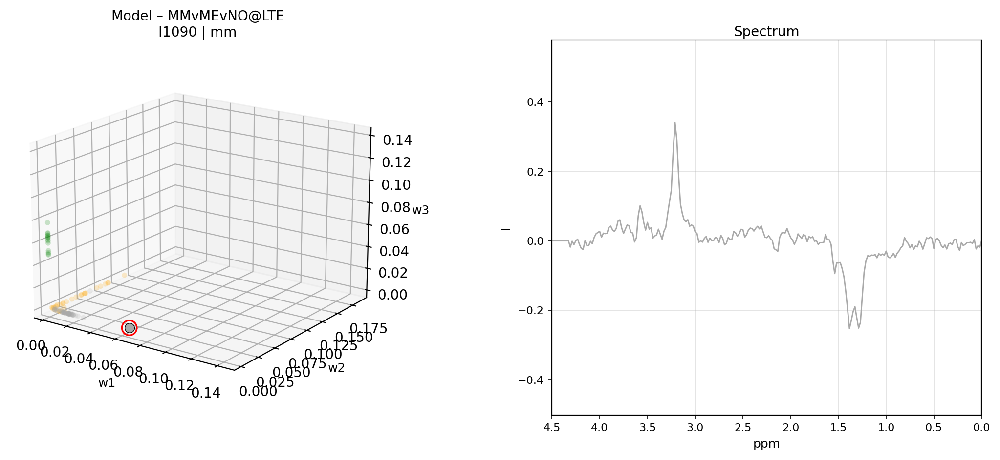

In [40]:
global_limits = compute_global_limits_for_model(
    model=model,
    raw_weights=raw_weights, 
    raw_data_frames=normalised_raw_data_frames, 
    gmm_weight_relabelled=gmm_synthetic_weights, 
    kde_weight_relabelled=kde_synthetic_weights, 
    reconstructed_df=reconstructed_df,
    optimal_config_map=optimal_config_map       
)
print(f"Global Y range: ({global_limits['raw_y'][0]:.4f}, {global_limits['raw_y'][1]:.4f})")

for key in raw_weights.keys():
    plot_outlier_focus_page(
        real_weights_df=raw_weights[key].copy(),
        raw_df=normalised_raw_data_frames[key],
        colours_dict_label=colours_dict_label,
        global_limits=global_limits,
        outlier_sd=3.0,
        experiment_name=key
    )

In [28]:
def plot_case_spectra(
    case_ids,
    raw_df,
    spec_cols=None,
    ppm_axis=None,
    colours_dict_label=None,
    label_col="labels",
    case_col="case_ids",
    xlim=(4.5, 0),
    ylims=None,
    linewidth=1.2,
    dpi=160,
):
    """
    Plot individual spectra for a list of case IDs (no scatter).
    
    case_ids: list/iterable of case identifiers (strings/ints)
    raw_df: dataframe containing spectra + metadata columns
    spec_cols: list of spectral columns; if None, inferred by excluding metadata cols
    ppm_axis: 1D array for x-axis; if None, uses linspace over spec length
    colours_dict_label: dict mapping label -> color; optional
    label_col: column name for class label in raw_df
    case_col: column name for case ID in raw_df
    xlim: tuple for ppm axis direction (default 4.5 -> 0)
    ylims: tuple (ymin, ymax) or None for auto
    """

    if not isinstance(case_ids, (list, tuple, set, np.ndarray, pd.Series)):
        case_ids = [case_ids]

    df = raw_df.copy()

    if case_col not in df.columns:
        raise KeyError(f"raw_df is missing case ID column '{case_col}'")

    # infer spectral columns if not provided
    if spec_cols is None:
        meta_cols = {label_col, case_col, "shade", "is_outlier", "true_label", "case_id"}
        spec_cols = [c for c in df.columns if c not in meta_cols]

    if ppm_axis is None:
        ppm_axis = np.linspace(xlim[0], xlim[1], len(spec_cols))

    # normalize ID typing for matching
    df_case = df.copy()
    df_case[case_col] = df_case[case_col].astype(str)
    case_ids = [str(c) for c in case_ids]

    for cid in case_ids:
        sub = df_case[df_case[case_col] == cid]
        if sub.empty:
            print(f"[WARN] No row found for case_id={cid}")
            continue

        # If duplicates exist, plot them all (often repeats / multiple acquisitions)
        for idx, row in sub.iterrows():
            y = row[spec_cols].astype(float).values

            lab = None
            if label_col in sub.columns:
                lab = str(row[label_col])

            color = None
            if colours_dict_label is not None and lab is not None:
                color = colours_dict_label.get(lab, None)

            fig, ax = plt.subplots(figsize=(7.2, 3.6), dpi=dpi)
            ax.plot(ppm_axis, y, linewidth=linewidth, color=color)

            title = f"Case ID={cid}"
            if lab is not None:
                title += f" | label={lab}"
            if len(sub) > 1:
                title += f" | row={idx}"
            ax.set_title(title, fontsize=10)

            ax.set_xlabel("Chemical Shift (ppm)", fontsize=9)
            ax.set_ylabel("Intensity", fontsize=9)
            ax.set_xlim(*xlim)
            if ylims is not None:
                ax.set_ylim(*ylims)
            ax.grid(True, linewidth=0.4, alpha=0.35)
            ax.tick_params(labelsize=8, width=0.6, length=3)

            plt.savefig(f'../../../images/masters_results_recreation/missed_cases/unmatched_case_{cid}.png', dpi=dpi)
            plt.close(fig)

case_ids = ["I1278", "I0335", "I1108", "I0111", "I0183", "I0200", "I1071", "I1051", "I0001", "I0367", "I0149", "I0068"]  # whatever your IDs look like

raw_df_all = (
    pd.concat(normalised_raw_data_frames.values(), axis=0)
    .reset_index(drop=True)
    .drop_duplicates(subset=["case_ids"])
)

plot_case_spectra(
    case_ids=case_ids,
    raw_df=raw_df_all,                    # your raw spectra dataframe
    colours_dict_label=colours_dict_label,
    label_col="labels",
    case_col="case_ids",
)


--- Computing global limits for GMM ---
Global Y range: (-0.4918, 0.5672)

--- Computing global limits for KDE ---
Global Y range: (-0.4918, 0.5672)

--- Plotting KDE for MMvMEvA2@STE with optimal param: (np.float64(0.005179474679231213), 'gaussian') ---
[[ 0.          0.          0.         ...  0.00198689  0.0015188
   0.00157525]
 [ 0.          0.          0.         ...  0.00201852  0.00159306
   0.00169365]
 [ 0.          0.          0.         ...  0.00128511  0.00121331
   0.00143015]
 ...
 [ 0.          0.          0.         ...  0.00026381  0.00027706
   0.00032971]
 [ 0.          0.          0.         ... -0.00212365 -0.00095431
   0.00031649]
 [ 0.          0.          0.         ... -0.00105065 -0.00046937
   0.00017803]] [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65

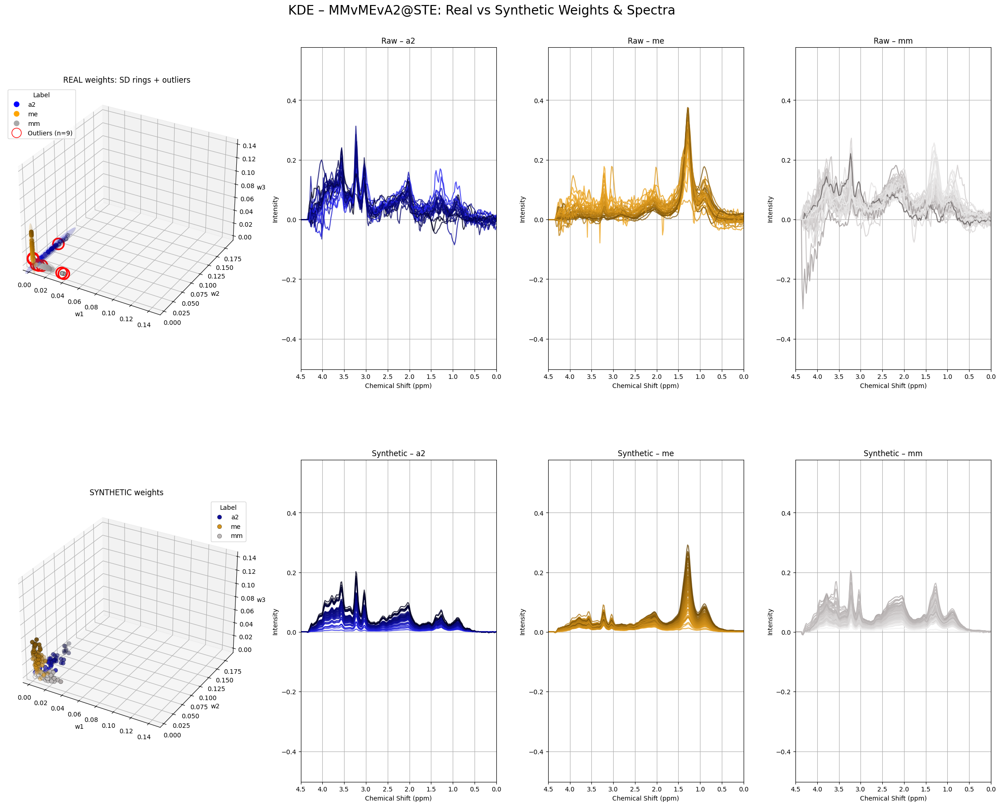

In [47]:
for model in ["GMM", "KDE"]:
    
    print(f"\n--- Computing global limits for {model} ---")
    global_limits = compute_global_limits_for_model(
        model=model,
        raw_weights=raw_weights, 
        raw_data_frames=normalised_raw_data_frames, 
        gmm_weight_relabelled=gmm_synthetic_weights, 
        kde_weight_relabelled=kde_synthetic_weights, 
        reconstructed_df=reconstructed_df,
        optimal_config_map=optimal_config_map       
    )
    print(f"Global Y range: ({global_limits['raw_y'][0]:.4f}, {global_limits['raw_y'][1]:.4f})")

    for key in raw_weights.keys():
        if key not in ["MMvMEvA2@STE"] or model == "GMM": # debug to not run all experiments
            continue
               
        # Dynamically look up optimal parameter
        BEST_PARAM = optimal_config_map[model].get(key)

        source_weights_dict = gmm_synthetic_weights if model == "GMM" else kde_synthetic_weights
        try:
            syn_weights_df = source_weights_dict[key][BEST_PARAM]
            syn_entry = reconstructed_df[model][key][BEST_PARAM][0]
        except KeyError:
            print(f"Skipping {key} for {model}: Data path not found for optimal parameter {BEST_PARAM}.")
            continue

        syn_spectra_data = syn_entry["data"]
        syn_labels = syn_entry["labels"]

        print(f"\n--- Plotting {model} for {key} with optimal param: {BEST_PARAM} ---")

        # 3. Plot the full page
        plot_full_page(
            real_weights_df=raw_weights[key].copy(),
            raw_df=normalised_raw_data_frames[key],
            syn_weights_df=syn_weights_df,
            syn_spectra_data=syn_spectra_data,
            syn_labels=syn_labels,
            colours_dict_label=colours_dict_label,
            global_limits=global_limits,
            outlier_sd=3.0,
            experiment_name=key
        )

### Save and load in XML for classification

In [181]:
import os
import copy
import xml.etree.ElementTree as ET
import numpy as np

# --- Paths ---
RAW_XML_LONG = os.path.join(nb_dir, "data/1TE-LongMRS(corregido).xml")
RAW_XML_SHORT = os.path.join(nb_dir, "data/1TE-ShortMRS(corregido).xml")
TEMPLATE_XML_PATH_LONG = RAW_XML_LONG
TEMPLATE_XML_PATH_SHORT = RAW_XML_SHORT
OUTPUT_XML_DIR = f"{nb_dir}/data/synthetic_data"

def get_PPM(point, NPoint, MaxPPM, MinPPM) -> int:
    """Convert a PPM value to its nearest index in the spectrum."""
    NPoint, MinPPM, MaxPPM = float(NPoint), float(MinPPM), float(MaxPPM)
    delta = abs(MaxPPM - MinPPM) / (NPoint - 1)
    return int(round((MinPPM - point) / delta))

def load_xml_tree(path):
    tree = ET.parse(path)
    return tree, tree.getroot()

def make_case_element(template_case, new_id, points_list, label=None, first_ppm="0", last_ppm="4.5"):
    new_case = copy.deepcopy(template_case)
    new_case.attrib["ID"] = new_id
    tissue_elem = new_case.find("Tissue")
    if tissue_elem is not None and label is not None:
        tissue_elem.attrib["Type"] = str(label).lower()
    points_elem = new_case.find(".//Points")
    if points_elem is not None:
        points_elem.text = " ".join(str(p) for p in points_list)
    params = new_case.find(".//Parameters")
    if params is not None:
        params.set("FirstPPM", str(first_ppm))
        params.set("LastPPM", str(last_ppm))
        params.set("PointsNumber", str(len(points_list)))
    return new_case

def save_xml(tree_or_root, path):
    tree = ET.ElementTree(tree_or_root) if isinstance(tree_or_root, ET.Element) else tree_or_root
    ET.indent(tree, space="  ", level=0)
    tree.write(path, encoding="UTF-8", xml_declaration=True)

# === MAIN ===
os.makedirs(OUTPUT_XML_DIR, exist_ok=True)

model_data_lookup = {"GMM": reconstructed_df.get("GMM", {}), "KDE": reconstructed_df.get("KDE", {})}

for model_name in ["GMM", "KDE"]:
    model_data = model_data_lookup.get(model_name, {})
    if not model_data:
        print(f"Skipping {model_name}: no data")
        continue

    for exp_key in source_matrices.keys():

        if exp_key not in model_data:
            print(f"Skipping {exp_key}: not inside reconstructed_df[{model_name}]")
            continue

        # HERE IS THE KEY CHANGE — iterate over *every parameter*
        for param in model_data[exp_key].keys():
            try:
                entry_list = model_data[exp_key][param]
                entry = entry_list[0]
                synthetic_data = entry["data"]
                synthetic_labels = entry["labels"]
            except KeyError:
                print(f"Skipping {exp_key} for {model_name}: param {param} missing")
                continue

            exp_name, echo = exp_key.split("@")
            echo = echo.strip()
            allowed_labels = [lab.upper() for lab in exp_name.split("v")]

            input_xml_path = RAW_XML_LONG if echo == "LTE" else RAW_XML_SHORT
            template_xml_path = TEMPLATE_XML_PATH_LONG if echo == "LTE" else TEMPLATE_XML_PATH_SHORT

            raw_tree, raw_root = load_xml_tree(input_xml_path)
            base_tree, base_root = load_xml_tree(template_xml_path)
            real_tree, real_root = load_xml_tree(template_xml_path)
            synth_tree, synth_root = load_xml_tree(template_xml_path)
            combined_tree, combined_root = load_xml_tree(template_xml_path)

            for tree_root in [real_root, synth_root, combined_root]:
                for case in list(tree_root.findall(".//Case")):
                    tree_root.remove(case)

            for case in raw_root.findall(".//Case"):
                tissue = case.find("Tissue")
                if tissue is None:
                    continue
                label = tissue.attrib.get("Type", "").upper()
                if label in allowed_labels:
                    real_root.append(copy.deepcopy(case))
                    combined_root.append(copy.deepcopy(case))

            template_case = base_root.find(".//Case")
            full_params = template_case.find(".//Parameters")
            full_N = int(full_params.get("PointsNumber"))
            full_min_ppm = float(full_params.get("FirstPPM"))
            full_max_ppm = float(full_params.get("LastPPM"))
            idx_min = get_PPM(0.0, full_N, full_max_ppm, full_min_ppm)
            idx_max = get_PPM(4.5, full_N, full_max_ppm, full_min_ppm)
            target_start = min(idx_min, idx_max)
            target_stop = max(idx_min, idx_max) + 1
            target_len = target_stop - target_start

            n_points = len(synthetic_data[0])
            start = max(0, min(target_start, n_points))
            stop = max(start, min(target_stop, n_points))
            trunc_slice = slice(start, stop)

            print(f"{model_name} | {exp_key} | param={param} → slice {start}:{stop} (target len {target_len}, orig len {n_points})")

            syn_id = 0
            for spectrum, label in zip(synthetic_data, synthetic_labels):
                if str(label).upper() not in allowed_labels:
                    continue
                spectrum = np.asarray(spectrum)
                if len(spectrum) == target_len:
                    truncated_spectrum = spectrum
                else:
                    truncated_spectrum = spectrum[trunc_slice]
                new_case = make_case_element(
                    template_case,
                    f"SYN{syn_id}",
                    truncated_spectrum,
                    label=label,
                    first_ppm="0",
                    last_ppm="4.5",
                )
                synth_root.append(copy.deepcopy(new_case))
                combined_root.append(copy.deepcopy(new_case))
                syn_id += 1


            # WRITE TO PARAM-SPECIFIC SUBDIRECTORY
            output_subdir = os.path.join(OUTPUT_XML_DIR, model_name, exp_name, echo, f"param_{param}")
            os.makedirs(output_subdir, exist_ok=True)

            save_xml(real_root,     os.path.join(output_subdir, f"{exp_key}_real.xml"))
            save_xml(synth_root,    os.path.join(output_subdir, f"{exp_key}_synthetic.xml"))
            save_xml(combined_root, os.path.join(output_subdir, f"{exp_key}_combined.xml"))
            print(f"Saved {exp_key} | param={param} | {syn_id} synthetic cases → {output_subdir}")


GMM | A2vNO@LTE | param=1 → slice 0:0 (target len 235, orig len 235)
Saved A2vNO@LTE | param=1 | 70 synthetic cases → c:\Users\matth\Desktop\PhD\code\notebooks\masters_result_recreation/data/synthetic_data\GMM\A2vNO\LTE\param_1
GMM | A2vNO@LTE | param=2 → slice 0:0 (target len 235, orig len 235)
Saved A2vNO@LTE | param=2 | 70 synthetic cases → c:\Users\matth\Desktop\PhD\code\notebooks\masters_result_recreation/data/synthetic_data\GMM\A2vNO\LTE\param_2
GMM | A2vNO@LTE | param=3 → slice 0:0 (target len 235, orig len 235)
Saved A2vNO@LTE | param=3 | 70 synthetic cases → c:\Users\matth\Desktop\PhD\code\notebooks\masters_result_recreation/data/synthetic_data\GMM\A2vNO\LTE\param_3
GMM | A2vNO@LTE | param=4 → slice 0:0 (target len 235, orig len 235)
Saved A2vNO@LTE | param=4 | 70 synthetic cases → c:\Users\matth\Desktop\PhD\code\notebooks\masters_result_recreation/data/synthetic_data\GMM\A2vNO\LTE\param_4
GMM | A2vNO@LTE | param=5 → slice 0:0 (target len 235, orig len 235)
Saved A2vNO@LTE | p

In [182]:
def parse_mrs_xml(filepath):
    tree = ET.parse(filepath)
    root = tree.getroot()
    
    records = []
    
    for case in root.findall('Case'):
        case_id = case.get('ID')
        is_synthetic = case_id.startswith('SYN')
        
        tissue_type = case.find('Tissue').get('Type').lower()
        spectrum = list(map(float, case.find('.//Points').text.strip().split()))
        
        records.append({
            'id': case_id,
            'label': tissue_type,
            'synthetic': is_synthetic,
            'spectrum': np.array(spectrum)
        })

    return pd.DataFrame(records)

def crop_real_spectrum_to_synthetic_range(spectrum, 
                                           real_N=512, real_min=-2.7, real_max=7.1,
                                           target_min=0.0, target_max=4.5):
    # Compute indices in real spectrum corresponding to target range
    start_idx = get_PPM(target_max, real_N, real_max, real_min)
    end_idx   = get_PPM(target_min, real_N, real_max, real_min)
    
    # Slice and flip (if needed)
    cropped = spectrum[start_idx:end_idx + 1]  # +1 to include endpoint
    return cropped

In [183]:
data = {}

for model in ["GMM", "KDE"]:
    data[model] = {}
    for experiment in experiments:
        
        experiment_name = 'v'.join([e.upper() for e in experiment])

        for te_type in ["L", "S"]:
            run_key = f"{experiment_name}@{te_type}TE"
            data[model][run_key] = {}   # holds param → df

            base_dir = os.path.join(
                nb_dir, "data", "synthetic_data",
                model, experiment_name, te_type + "TE"
            )

            if not os.path.exists(base_dir):
                print(f"⚠️ No directory: {base_dir}")
                continue

            #———————————————
            # loop over param folders
            #———————————————
            for param_folder in sorted(os.listdir(base_dir)):
                full_param_path = os.path.join(base_dir, param_folder)
                
                if not os.path.isdir(full_param_path):
                    continue

                # param folders are like:  param_3
                param_name = param_folder.replace("param_", "")

                xml_path = os.path.join(
                    full_param_path,
                    f"{run_key}_combined.xml"
                )

                if os.path.exists(xml_path):
                    df = parse_mrs_xml(xml_path)
                    data[model][run_key][param_name] = df
                    print(f"Loaded: {xml_path}  → model={model} | run={run_key} | param={param_name} | cases={len(df)}")

                else:
                    print(f"Missing file: {xml_path}")


Loaded: c:\Users\matth\Desktop\PhD\code\notebooks\masters_result_recreation\data\synthetic_data\GMM\A2vNO\LTE\param_1\A2vNO@LTE_combined.xml  → model=GMM | run=A2vNO@LTE | param=1 | cases=105
Loaded: c:\Users\matth\Desktop\PhD\code\notebooks\masters_result_recreation\data\synthetic_data\GMM\A2vNO\LTE\param_10\A2vNO@LTE_combined.xml  → model=GMM | run=A2vNO@LTE | param=10 | cases=105
Loaded: c:\Users\matth\Desktop\PhD\code\notebooks\masters_result_recreation\data\synthetic_data\GMM\A2vNO\LTE\param_2\A2vNO@LTE_combined.xml  → model=GMM | run=A2vNO@LTE | param=2 | cases=105
Loaded: c:\Users\matth\Desktop\PhD\code\notebooks\masters_result_recreation\data\synthetic_data\GMM\A2vNO\LTE\param_3\A2vNO@LTE_combined.xml  → model=GMM | run=A2vNO@LTE | param=3 | cases=105
Loaded: c:\Users\matth\Desktop\PhD\code\notebooks\masters_result_recreation\data\synthetic_data\GMM\A2vNO\LTE\param_4\A2vNO@LTE_combined.xml  → model=GMM | run=A2vNO@LTE | param=4 | cases=105
Loaded: c:\Users\matth\Desktop\PhD\cod

In [184]:
data_cropped = {}

for model in data:
    data_cropped[model] = {}
    
    for run_key in data[model]:   # MMvME@LTE etc
        data_cropped[model][run_key] = {}   # make param dict
        
        for param, df in data[model][run_key].items():
            print(f"Cropping {run_key} | param={param} | model={model}")
            
            df = df.copy()

            # crop only REAL spectra
            for i, row in df.iterrows():
                if not row['synthetic']:
                    cropped = crop_real_spectrum_to_synthetic_range(row['spectrum'])
                    df.at[i, 'spectrum'] = cropped

            data_cropped[model][run_key][param] = df


Cropping A2vNO@LTE | param=1 | model=GMM
Cropping A2vNO@LTE | param=10 | model=GMM
Cropping A2vNO@LTE | param=2 | model=GMM
Cropping A2vNO@LTE | param=3 | model=GMM
Cropping A2vNO@LTE | param=4 | model=GMM
Cropping A2vNO@LTE | param=5 | model=GMM
Cropping A2vNO@LTE | param=6 | model=GMM
Cropping A2vNO@LTE | param=7 | model=GMM
Cropping A2vNO@LTE | param=8 | model=GMM
Cropping A2vNO@LTE | param=9 | model=GMM
Cropping A2vNO@STE | param=1 | model=GMM
Cropping A2vNO@STE | param=10 | model=GMM
Cropping A2vNO@STE | param=2 | model=GMM
Cropping A2vNO@STE | param=3 | model=GMM
Cropping A2vNO@STE | param=4 | model=GMM
Cropping A2vNO@STE | param=5 | model=GMM
Cropping A2vNO@STE | param=6 | model=GMM
Cropping A2vNO@STE | param=7 | model=GMM
Cropping A2vNO@STE | param=8 | model=GMM
Cropping A2vNO@STE | param=9 | model=GMM
Cropping MMvME@LTE | param=1 | model=GMM
Cropping MMvME@LTE | param=10 | model=GMM
Cropping MMvME@LTE | param=2 | model=GMM
Cropping MMvME@LTE | param=3 | model=GMM
Cropping MMvM

In [185]:
from sklearn.preprocessing import normalize

for model in data_cropped:
    for run_key in data_cropped[model]:                     # MMvME@LTE
        for param, df in data_cropped[model][run_key].items():  # param=3, param=7 ...
            
            print(f"L2-normalizing: {model} | {run_key} | param={param}")

            real_mask = ~df['synthetic']
            real_indices = df[real_mask].index

            if not real_indices.empty:
                spectra_matrix = np.stack(df.loc[real_indices, 'spectrum'].values)
                normed_matrix = normalize(spectra_matrix, axis=1, norm='l2')

                for idx, normed_spec in zip(real_indices, normed_matrix):
                    df.at[idx, 'spectrum'] = normed_spec


L2-normalizing: GMM | A2vNO@LTE | param=1
L2-normalizing: GMM | A2vNO@LTE | param=10
L2-normalizing: GMM | A2vNO@LTE | param=2
L2-normalizing: GMM | A2vNO@LTE | param=3
L2-normalizing: GMM | A2vNO@LTE | param=4
L2-normalizing: GMM | A2vNO@LTE | param=5
L2-normalizing: GMM | A2vNO@LTE | param=6
L2-normalizing: GMM | A2vNO@LTE | param=7
L2-normalizing: GMM | A2vNO@LTE | param=8
L2-normalizing: GMM | A2vNO@LTE | param=9
L2-normalizing: GMM | A2vNO@STE | param=1
L2-normalizing: GMM | A2vNO@STE | param=10
L2-normalizing: GMM | A2vNO@STE | param=2
L2-normalizing: GMM | A2vNO@STE | param=3
L2-normalizing: GMM | A2vNO@STE | param=4
L2-normalizing: GMM | A2vNO@STE | param=5
L2-normalizing: GMM | A2vNO@STE | param=6
L2-normalizing: GMM | A2vNO@STE | param=7
L2-normalizing: GMM | A2vNO@STE | param=8
L2-normalizing: GMM | A2vNO@STE | param=9
L2-normalizing: GMM | MMvME@LTE | param=1
L2-normalizing: GMM | MMvME@LTE | param=10
L2-normalizing: GMM | MMvME@LTE | param=2
L2-normalizing: GMM | MMvME@LTE

In [186]:
for model in data_cropped:
    for run_key in data_cropped[model]:
        for param, df in data_cropped[model][run_key].items():
            
            if df.empty:
                continue

            real_len = df.loc[~df['synthetic'], 'spectrum'].map(len).unique()
            syn_len  = df.loc[df['synthetic'],  'spectrum'].map(len).unique()

            print(f"{model} | {run_key} | param={param}")
            print(f"  Real spectrum len(s):  {real_len}")
            print(f"  Synth spectrum len(s): {syn_len}")
            print()


GMM | A2vNO@LTE | param=1
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@LTE | param=10
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@LTE | param=2
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@LTE | param=3
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@LTE | param=4
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@LTE | param=5
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@LTE | param=6
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@LTE | param=7
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@LTE | param=8
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@LTE | param=9
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@STE | param=1
  Real spectrum len(s):  [235]
  Synth spectrum len(s): [235]

GMM | A2vNO@STE | pa

In [197]:
def plot_experiments(data_dict, model=None, echo=None, experiments=None, param=None):
    """
    Plot real and synthetic spectra for given experiments, models, and echo types.
    
    Current data_dict structure:
        data_dict[model][exp_key][param] = DataFrame(id, label, synthetic, spectrum)
    where exp_key looks like 'A2VNO@LTE' or 'A2VNO@STE', and param is typically
    stored as a string (e.g. "1" or "(1.0, 'tophat')").
    """

    # Models
    if model is None:
        models = list(data_dict.keys())
    elif isinstance(model, str):
        models = [model]
    else:
        models = model

    # Echo types
    if echo is None:
        echos = ["LTE", "STE"]
    elif isinstance(echo, str):
        echos = [echo]
    else:
        echos = echo

    # Experiments (exp_keys)
    all_exps = list(next(iter(data_dict.values())).keys())
    if experiments is None:
        exps = all_exps
    elif isinstance(experiments, str):
        exps = [experiments]
    else:
        exps = experiments

    for m in models:
        for te in echos:
            # only experiments that match this TE
            exps_for_te = [e for e in exps if f"@{te}" in e]

            for exp_key in exps_for_te:
                if exp_key not in data_dict[m]:
                    print(f"Skipping missing: {m} | {exp_key}")
                    continue

                sub = data_dict[m][exp_key]

                # Backwards compatibility: if sub is already a DataFrame (no param nesting)
                if isinstance(sub, pd.DataFrame):
                    df = sub
                    used_param = None
                else:
                    # sub should be a dict: param_key -> DataFrame
                    param_keys = list(sub.keys())

                    if not param_keys:
                        print(f"No parameters found for {m} | {exp_key}")
                        continue

                    if param is None:
                        # fallback: use the first param key
                        used_param = param_keys[0]
                    else:
                        # try direct key
                        if param in sub:
                            used_param = param
                        else:
                            # try stringified version (handles 1 vs "1", tuples, etc.)
                            str_param = str(param)
                            if str_param in sub:
                                used_param = str_param
                            else:
                                print(
                                    f"Skipping {m} | {exp_key} — param {param} not found. "
                                    f"Available: {param_keys}"
                                )
                                continue

                    df = sub[used_param]

                # Guess PPM range from first REAL spectrum
                real_mask = df["synthetic"] == False
                if not real_mask.any():
                    print(f"No real spectra for {m} | {exp_key} | param={used_param}")
                    continue

                first_real = df.loc[real_mask, "spectrum"].iloc[0]
                real_len = len(first_real)
                ppm_scale = np.linspace(0, 4.5, real_len)

                unique_labels = sorted(df['label'].str.upper().unique())
                n = len(unique_labels)

                fig, axes = plt.subplots(2, n, figsize=(4*n, 6), sharey='row')

                title_suffix = f" | param={used_param}" if 'used_param' in locals() and used_param is not None else ""
                fig.suptitle(f"{m} | {exp_key}{title_suffix}", fontsize=14)

                # global y limits
                all_vals = np.concatenate(df['spectrum'].values)
                y_min, y_max = np.min(all_vals), np.max(all_vals)

                for i, label_norm in enumerate(unique_labels):
                    color = colours_dict_label.get(label_norm.lower(), '#000000')

                    # REAL
                    ax_real = axes[0, i] if n > 1 else axes[0]
                    ax_real.set_title(f"Real - {label_norm}")
                    mask_real_label = (df['label'].str.upper() == label_norm) & (~df['synthetic'])
                    for spec in df.loc[mask_real_label, 'spectrum']:
                        ax_real.plot(ppm_scale, spec, alpha=0.4, color=color)
                    ax_real.set_ylim([y_min, y_max])
                    ax_real.set_xlabel("PPM")
                    ax_real.grid(True, linestyle='--', alpha=0.4)

                    # SYNTHETIC
                    ax_syn = axes[1, i] if n > 1 else axes[1]
                    ax_syn.set_title(f"Synthetic - {label_norm}")
                    mask_syn_label = (df['label'].str.upper() == label_norm) & (df['synthetic'])
                    for spec in df.loc[mask_syn_label, 'spectrum']:
                        ax_syn.plot(ppm_scale, spec, alpha=0.4, color=color)
                    ax_syn.set_ylim([y_min, y_max])
                    ax_syn.set_xlabel("PPM")
                    ax_syn.grid(True, linestyle='--', alpha=0.4)


                plt.tight_layout(rect=[0, 0, 1, 0.95])
                plt.show()


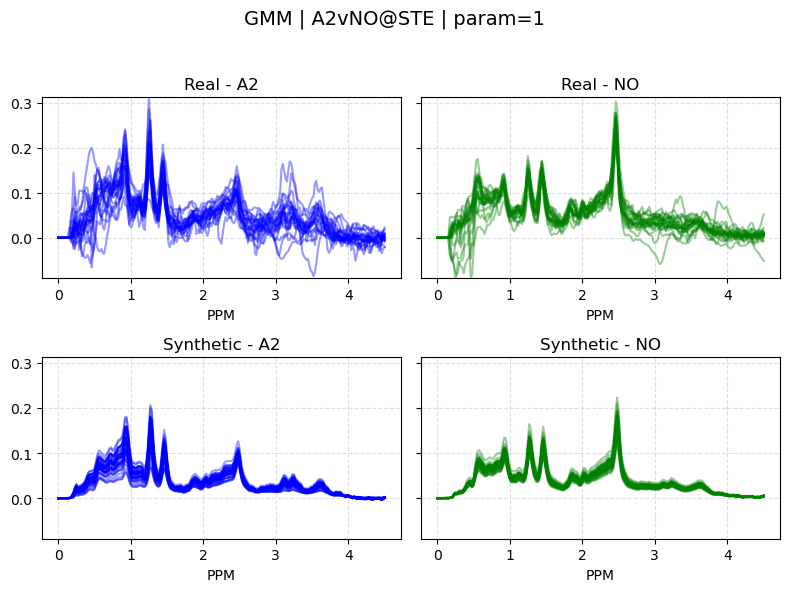

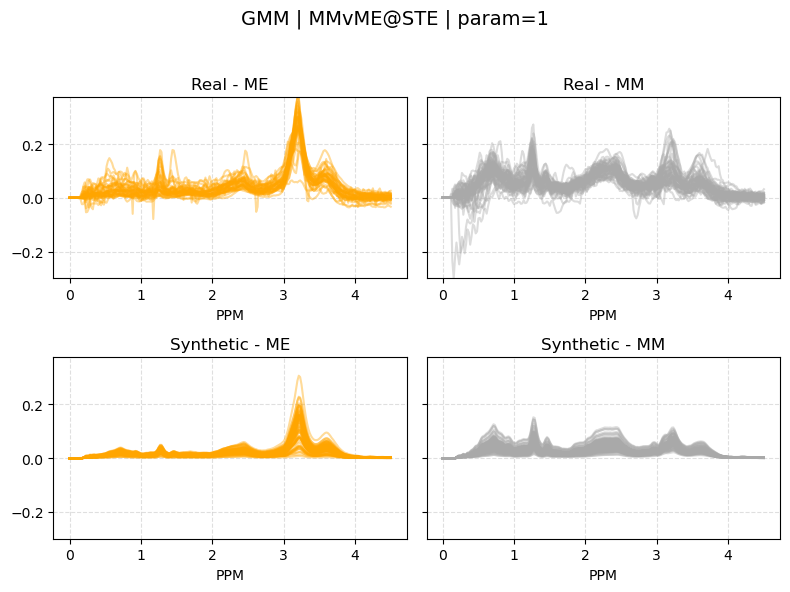

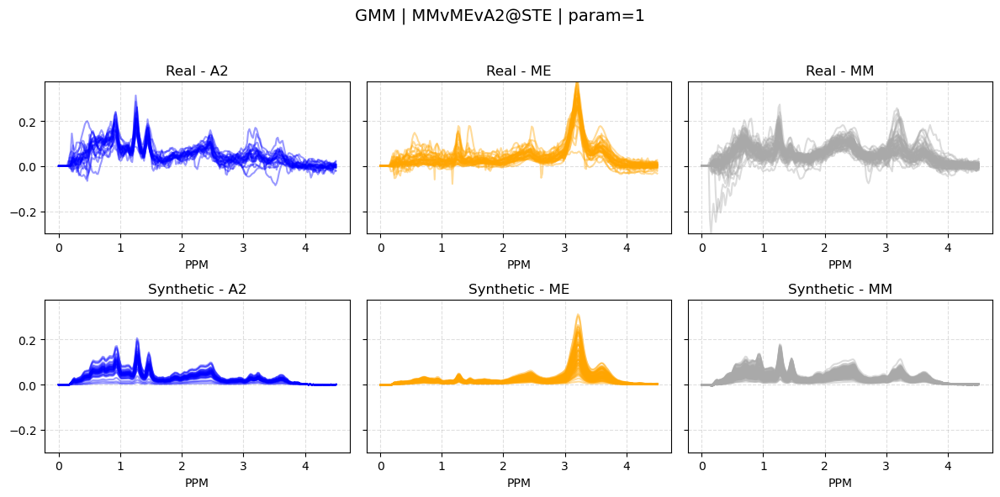

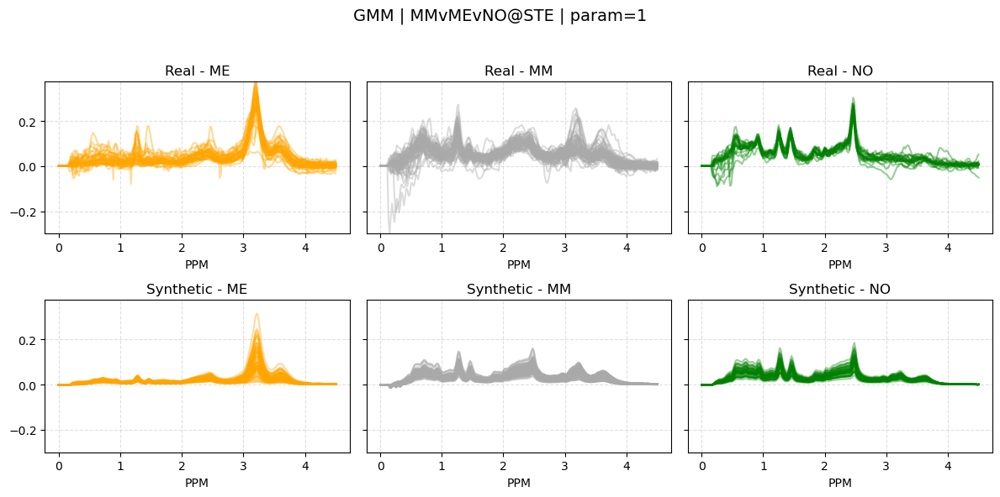

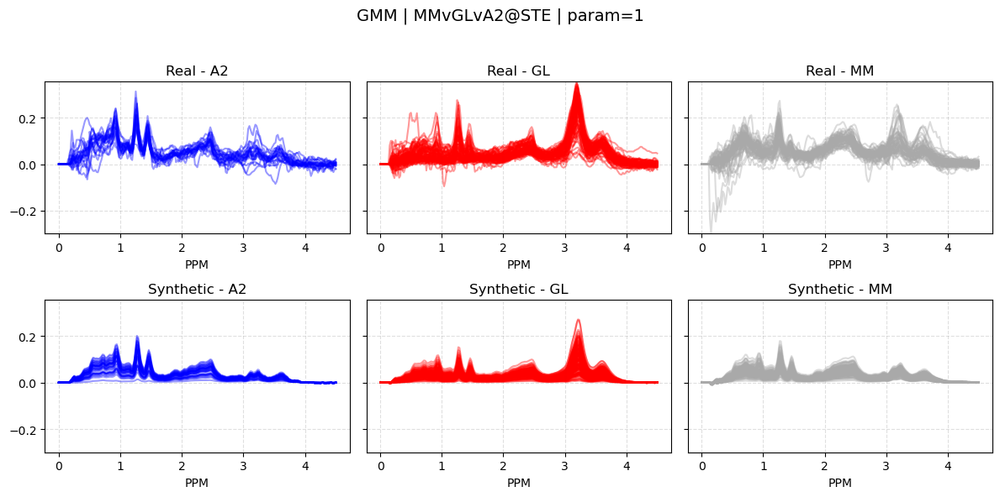

...

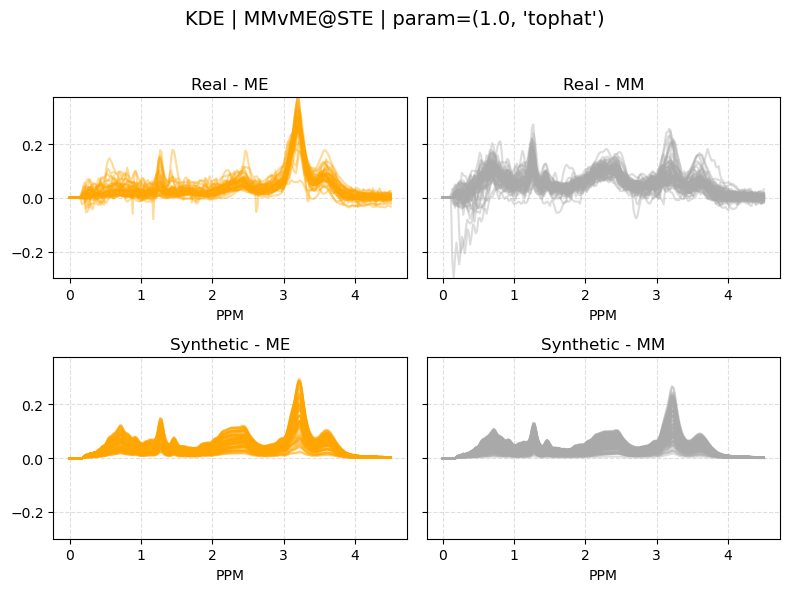

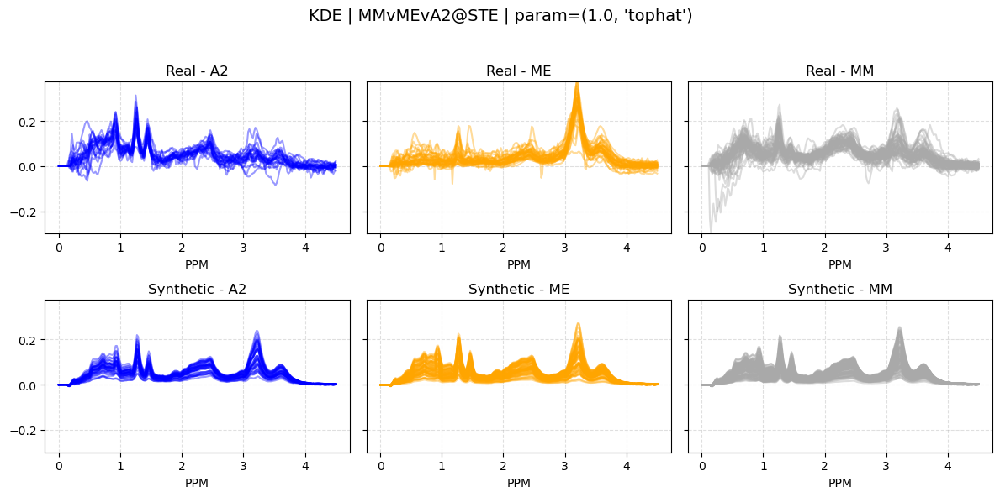

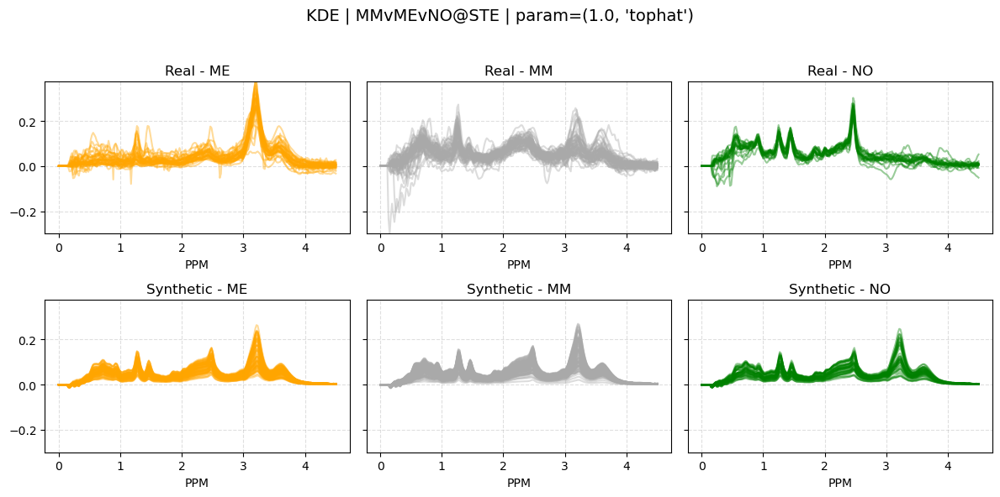

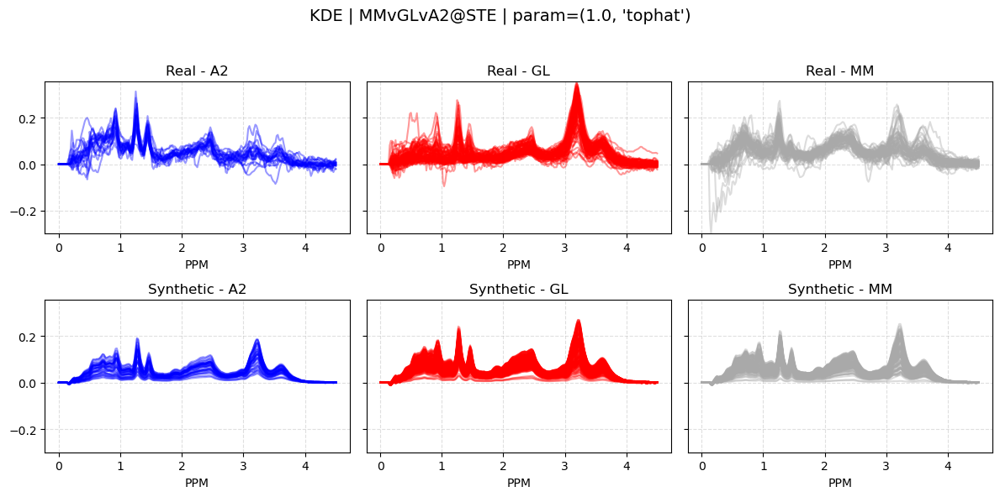

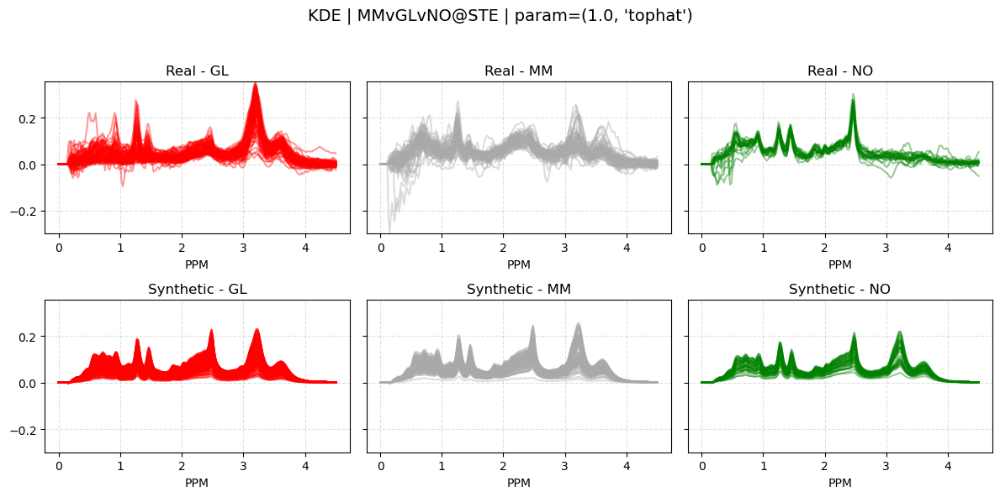

In [198]:
if debug: plot_experiments(data_cropped, model='GMM', echo='STE', param="1")
if debug: plot_experiments(data_cropped, model='KDE', echo='STE', param="(1.0, 'tophat')")

### Classification

In [309]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd

def prepare_pipeline_data(
    data_dict,
    model='GMM',
    experiment='A2vNO',   # base exp name, e.g. 'MMvMEvNO'
    echo='LTE',           # 'LTE' or 'STE'
    strategy='real2syn',
    test_frac=0.3,
    random_state=42,
    param=None            # can be raw key or tuple or string
):
    """
    Prepare data for SFFS + classifier pipeline.

    data_dict structure (new):
        data_dict[model][exp_key][param] = DataFrame
    where exp_key looks like  "A2vNO@LTE".

    Returns:
        X_train, y_train_enc, X_test, y_test_enc, label_encoder, used_param
    """

    exp_key = f"{experiment}@{echo}"

    if model not in data_dict:
        raise ValueError(f"Model {model} not found in data_dict")

    if exp_key not in data_dict[model]:
        raise ValueError(f"Data not found for key: {model} | {exp_key}")

    sub = data_dict[model][exp_key]

    # ---------------------------------------------------------
    # 1) Handle old flat structure (no params)
    # ---------------------------------------------------------
    if isinstance(sub, pd.DataFrame):
        df = sub
        used_param = None

    else:
        # sub is a dict: param_key -> DataFrame
        param_keys = list(sub.keys())
        if not param_keys:
            raise ValueError(f"No params found for {model} | {exp_key}")

        # ---- if no param requested: use first one ----
        if param is None:
            used_param = param_keys[0]
            df = sub[used_param]

        else:
            # Try to match param either by exact key or by string repr
            used_param = None
            for k in param_keys:
                if k == param or str(k) == str(param):
                    used_param = k
                    break

            if used_param is None:
                raise ValueError(
                    f"Requested param={param} not found for {model} | {exp_key}. "
                    f"Available: {param_keys}"
                )

            df = sub[used_param]

    # ---------------------------------------------------------
    # 2) Do the split for the chosen df
    # ---------------------------------------------------------
    if strategy == 'real2syn':
        train_df = df[df['synthetic'] == False].reset_index(drop=True)
        test_df  = df[df['synthetic'] == True].reset_index(drop=True)

    elif strategy == 'syn2real':
        train_df = df[df['synthetic'] == True].reset_index(drop=True)
        test_df  = df[df['synthetic'] == False].reset_index(drop=True)

    elif strategy in ['mixed2real', 'mixed2syn']:
        syn_df  = df[df['synthetic'] == True]
        real_df = df[df['synthetic'] == False]

        if syn_df.empty or real_df.empty:
            raise ValueError(f"Not enough real/synthetic data for strategy={strategy}")

        syn_train, syn_test = train_test_split(
            syn_df,
            test_size=test_frac,
            stratify=syn_df['label'],
            random_state=random_state
        )

        if strategy == 'mixed2real':
            train_df = pd.concat([real_df, syn_train]).reset_index(drop=True)
            test_df  = real_df.reset_index(drop=True)
        else:  # mixed2syn
            train_df = pd.concat([real_df, syn_train]).reset_index(drop=True)
            test_df  = syn_test.reset_index(drop=True)

    else:
        raise ValueError(f"Unknown strategy: {strategy}")

    if train_df.empty or test_df.empty:
        raise ValueError(
            f"Empty train or test set for {model} | {exp_key} | param={used_param} "
            f"| strategy={strategy}"
        )

    # ---------------------------------------------------------
    # 3) Convert to arrays and encode labels
    # ---------------------------------------------------------
    X_train = np.stack(train_df['spectrum'].values)
    X_test  = np.stack(test_df['spectrum'].values)

    le = LabelEncoder()
    y_train_enc = le.fit_transform(train_df['label'])
    y_test_enc  = le.transform(test_df['label'])

    return X_train, y_train_enc, X_test, y_test_enc, le, used_param


In [216]:
from sklearn.preprocessing import LabelEncoder

X_train, y_train, X_test, y_test, label_encoder, param_used = prepare_pipeline_data(
    data_cropped,
    model='KDE',
    experiment='MMvMEvNO',
    echo='STE',
    strategy='real2syn',
    param="(0.01, 'gaussian')"
)

print(X_train, y_train, X_test, y_test, label_encoder)

[[ 0.          0.          0.         ... -0.00803395 -0.01439123
  -0.01746593]
 [ 0.          0.          0.         ... -0.00928357 -0.00282693
  -0.00285738]
 [ 0.          0.          0.         ...  0.00645085  0.00495368
   0.00549166]
 ...
 [ 0.          0.          0.         ...  0.00248252  0.00336902
   0.00409524]
 [ 0.          0.          0.         ... -0.001182    0.00354703
   0.00333816]
 [ 0.          0.          0.         ...  0.01400589  0.01473083
   0.00896902]] [1 1 1 1 0 0 1 1 1 1 0 1 0 1 0 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 0
 1 0 1 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 0 1 1 1 0 1 1 0 0 1 1 1 0 0 1 0 0 1 0
 0 1 1 1 0 1 0 0 1 1 0 0 1 0 0 1 0 2 2 2 2 2 2 2 2 2 2 2 2 2 1 0 0 1 1 2 2
 2 2 2 2 2 2 2] [[0.         0.         0.         ... 0.00168519 0.00160445 0.00167383]
 [0.         0.         0.         ... 0.00098347 0.00023812 0.00063845]
 [0.         0.         0.         ... 0.00222545 0.00218573 0.00233719]
 ...
 [0.         0.         0.         ... 0.00

#### Attempt speed up of classification loops

##### Standard nested classification (results=`results`)

In [310]:
import jpype
import weka.core.jvm as jvm

if not jpype.isJVMStarted():
    jvm.start(packages=True)

from weka.core.dataset import Attribute, Instances, Instance
from weka.core import typeconv
from weka.attribute_selection import ASSearch, ASEvaluation, AttributeSelection
import numpy as np
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from weka.core.jvm import JClass
from java.util import ArrayList


def create_weka_instances(X, y, relation_name="MRS"):
    num_features = X.shape[1]

    attributes = ArrayList()
    for i in range(num_features):
        attr = Attribute.create_numeric(f"f{i}")
        attributes.add(attr.jobject)

    class_labels = [str(label) for label in sorted(set(y))]
    class_attr = Attribute.create_nominal("class", class_labels)
    attributes.add(class_attr.jobject)

    weka_instances = Instances(
        JClass("weka.core.Instances")(relation_name, attributes, 0)
    )
    weka_instances.class_index = num_features

    for row, label in zip(X, y):
        values = list(row) + [float("nan")]
        inst = Instance.create_instance(values)
        weka_instances.add_instance(inst)
        inst = weka_instances.get_instance(weka_instances.num_instances - 1)
        inst.set_string_value(num_features, str(label))

    return weka_instances


def run_sffs_weka(X_train, y_train, X_test, y_test, max_features=None, param_used=None):
    """
    Robust feature selection:
      - catches Java failures
      - avoids duplicate bin errors
      - auto fallback on failure
    """

    # 1) Convert numpy -> Weka dataset
    try:
        train_data = create_weka_instances(X_train, y_train, relation_name="TrainSet")
        test_data  = create_weka_instances(X_test, y_test, relation_name="TestSet")
    except Exception as e:
        print(f"❗ Weka instance conversion failed: {e}")
        return None, None, None

    # 2) TRY Greedy SFFS
    try:
        search = ASSearch(classname="weka.attributeSelection.GreedyStepwise", options=["-B"])
        eval_  = ASEvaluation(classname="weka.attributeSelection.CfsSubsetEval")

        selector = AttributeSelection()
        selector.search = search
        selector.evaluator = eval_

        selector.select_attributes(train_data)
        selected_indices = np.array(selector.selected_attributes[:-1], dtype=int)

    except Exception as e:
        print(f"❗ Feature selection failed for param={param_used}: {e}")
        print("➡ Using fallback: first 5 features")
        selected_indices = np.arange(min(5, X_train.shape[1]))

    # 3) enforce max_feature limit
    if max_features is not None and len(selected_indices) > max_features:
        selected_indices = selected_indices[:max_features]

    selected_indices = np.array(selected_indices, dtype=int)

    # Validate index bounds
    selected_indices = selected_indices[selected_indices < X_train.shape[1]]

    # If invalid → skip
    if len(selected_indices) < 2:
        print("❗ WEKA returned unusable features — skipping model")
        return None, None, None

    # 5) Reduce data
    try:
        X_train_red = X_train[:, selected_indices]
        X_test_red  = X_test[:, selected_indices]
    except Exception as e:
        print(f"❗ Indexing failed: {e}")
        return None, None, None

    # 6) Train LDA — CATCH ERRORS
    try:
        lda_model = LinearDiscriminantAnalysis()
        lda_model.fit(X_train_red, y_train)
    except Exception as e:
        print(f"❗ LDA training failed: {e}")
        return None, None, None

    # 7) Evaluate
    try:
        y_pred = lda_model.predict(X_test_red)
        acc = accuracy_score(y_test, y_pred)
        cm  = confusion_matrix(y_test, y_pred)
        cr  = classification_report(y_test, y_pred)
    except Exception as e:
        print(f"❗ LDA prediction failed: {e}")
        return None, None, None

    print(f"🎯 Accuracy = {acc:.4f}")
    print("Confusion matrix:")
    print(cm)
    print("Classification report:")
    print(cr)
    print(f"🔎 Final features used: {selected_indices}")
    print(f"🎯 Accuracy = {acc}")

    return selected_indices, lda_model, (acc, cr, cm)


In [311]:
X_train, y_train, X_test, y_test, label_encoder, param_used = prepare_pipeline_data(
    data_cropped,
    model="KDE",
    experiment="MMvMEvNO",
    echo="STE",
    strategy="real2syn",
    param="(0.01, 'gaussian')"
)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape, param_used)

selected_idx, lda, eval = run_sffs_weka(
    X_train, y_train, X_test, y_test,
    max_features=10,
    param_used=param_used
)


(118, 235) (118,) (220, 235) (220,) (0.01, 'gaussian')
🎯 Accuracy = 0.4409
Confusion matrix:
[[67  1  0]
 [80 30  0]
 [27 15  0]]
Classification report:
              precision    recall  f1-score   support

           0       0.39      0.99      0.55        68
           1       0.65      0.27      0.38       110
           2       0.00      0.00      0.00        42

    accuracy                           0.44       220
   macro avg       0.35      0.42      0.31       220
weighted avg       0.45      0.44      0.36       220

🔎 Final features used: [ 18  35  36  46  63  75  78  96 108 109]
🎯 Accuracy = 0.4409090909090909


In [312]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

feature_cache = {}   
results = {}

for model in data_cropped:
    for exp_key in data_cropped[model]:
        
        # all params for this experiment
        param_keys = list(data_cropped[model][exp_key].keys())

        for param in param_keys:

            param_str = str(param)
            cache_key = (model, exp_key, param_str)

            print(f"\n🔷 MODEL={model} | EXPT={exp_key} | PARAM={param_str}")

            for strategy in ["real2syn", "syn2real", "mixed2real"]:

                print(f"   ▶ Strategy={strategy}")

                # ------------------------------------------------
                # Load data only once
                # ------------------------------------------------
                try:
                    X_train, y_train, X_test, y_test, le, param_used = prepare_pipeline_data(
                        data_cropped,
                        model=model,
                        experiment=exp_key.split("@")[0],
                        echo=exp_key.split("@")[1],
                        strategy=strategy,
                        param=param,
                    )
                except Exception as e:
                    print(f"     ❌ prepare_pipeline_data failed: {e}")
                    continue

                # ------------------------------------------------
                # Skip weak training sets
                # ------------------------------------------------
                if len(X_train) < 5 or len(np.unique(y_train)) < 2:
                    print(f"     ⚠️ skipped: insufficient class diversity")
                    continue

                # ------------------------------------------------
                # FEATURE SELECTION WITH CACHING
                # ------------------------------------------------
                if cache_key in feature_cache:
                    selected_indices = feature_cache[cache_key]
                    print(f"     🔁 using cached features {selected_indices}")
                else:
                    selected_indices, lda_temp, _ = run_sffs_weka(
                        X_train, y_train, X_test, y_test,
                        max_features=10,
                        param_used=param_used
                    )
                    feature_cache[cache_key] = selected_indices
                    print(f"     💾 cached features {selected_indices}")

                # ------------------------------------------------
                # FINAL LDA TRAINING
                # ------------------------------------------------
                try:
                    lda_final = LinearDiscriminantAnalysis()
                    lda_final.fit(X_train[:, selected_indices], y_train)
                except Exception as e:
                    print(f"     ❗ LDA fitting error: {e}")
                    continue

                # ------------------------------------------------
                # PREDICTION
                # ------------------------------------------------
                try:
                    y_pred = lda_final.predict(X_test[:, selected_indices])
                except Exception as e:
                    print(f"     ❗ LDA prediction failed: {e}")
                    continue

                accuracy = accuracy_score(y_test, y_pred)
                cm = confusion_matrix(y_test, y_pred)
                cls_rpt = classification_report(y_test, y_pred, output_dict=True)

                result_key = f"{model}_{exp_key}_{param_str}_{strategy}"

                results[result_key] = {
                    "accuracy": accuracy,
                    "confusion_matrix": cm,
                    "report": cls_rpt,
                    "selected_indices": selected_indices,
                    "model": model,
                    "exp": exp_key,
                    "param": param_str,
                    "strategy": strategy
                }

                print(f"     ✅ DONE — acc={accuracy:.4f}")




🔷 MODEL=GMM | EXPT=A2vNO@LTE | PARAM=1
   ▶ Strategy=real2syn
🎯 Accuracy = 0.5714
Confusion matrix:
[[10 30]
 [ 0 30]]
Classification report:
              precision    recall  f1-score   support

           0       1.00      0.25      0.40        40
           1       0.50      1.00      0.67        30

    accuracy                           0.57        70
   macro avg       0.75      0.62      0.53        70
weighted avg       0.79      0.57      0.51        70

🔎 Final features used: [ 33  36  37  60  63  65  66  94  95 102]
🎯 Accuracy = 0.5714285714285714
     💾 cached features [ 33  36  37  60  63  65  66  94  95 102]
     ✅ DONE — acc=0.5714
   ▶ Strategy=syn2real
     🔁 using cached features [ 33  36  37  60  63  65  66  94  95 102]
     ✅ DONE — acc=0.9714
   ▶ Strategy=mixed2real
     🔁 using cached features [ 33  36  37  60  63  65  66  94  95 102]
     ✅ DONE — acc=1.0000

🔷 MODEL=GMM | EXPT=A2vNO@LTE | PARAM=10
   ▶ Strategy=real2syn
🎯 Accuracy = 0.5143
Confusion matrix:
[

In [314]:
best_results = results

In [313]:
rows = []

for result_key, metrics in results.items():

    parts = result_key.split('_')
    model_type      = parts[0]
    exp_key         = parts[1]
    param_used      = parts[2]
    testing_strategy= parts[3]

    total_cases = sum([v['support'] for k, v in metrics['report'].items() 
                      if k not in ['accuracy', 'macro avg', 'weighted avg']])

    rows.append({
        'model_type': model_type,
        'experiment': exp_key.split('@')[0],
        'echo_time': exp_key.split('@')[1],
        'param': param_used,
        'testing_strategy': testing_strategy,
        'accuracy': metrics['accuracy'],
        'total_cases': int(total_cases),
        'confusion_matrix': metrics['confusion_matrix']
    })

df = pd.DataFrame(rows)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    for experiment, group in df.groupby('experiment'):
        print(f"\nExperiment: {experiment}")
        print(group.drop(columns=['confusion_matrix']).to_string(index=False))
        print("\n" + "="*50)



Experiment: A2vNO
model_type experiment echo_time                                param testing_strategy  accuracy  total_cases
       GMM      A2vNO       LTE                                    1         real2syn  0.571429           70
       GMM      A2vNO       LTE                                    1         syn2real  0.971429           35
       GMM      A2vNO       LTE                                    1       mixed2real  1.000000           35
       GMM      A2vNO       LTE                                   10         real2syn  0.514286           70
       GMM      A2vNO       LTE                                   10         syn2real  0.942857           35
       GMM      A2vNO       LTE                                   10       mixed2real  1.000000           35
       GMM      A2vNO       LTE                                    2         real2syn  0.600000           70
       GMM      A2vNO       LTE                                    2         syn2real  1.000000           35


##### The following two methods do not produce correct data, multithreading breaks down and only selects 2 features, multicore breaks down and only uses 20 cases per experiment

#####  MultiThreading (results=`final_results`)

In [ ]:
import jpype
import weka.core.jvm as jvm
import numpy as np
import os
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from weka.core.dataset import Attribute, Instances, Instance
from weka.attribute_selection import ASSearch, ASEvaluation, AttributeSelection
from weka.core.jvm import JClass
from java.util import ArrayList

# ==============================================================
# Start JVM ONCE — in main thread
# ==============================================================
if not jpype.isJVMStarted():
    print("🔹 Starting JVM once in main thread")
    jvm.start(packages=True)
else:
    print("🔸 JVM already running")

# ==============================================================
# Helper: Convert numpy data to Weka format
# ==============================================================
def create_weka_instances(X, y, relation_name="MRS"):
    num_features = X.shape[1]
    attributes = ArrayList()
    for i in range(num_features):
        attr = Attribute.create_numeric(f"f{i}")
        attributes.add(attr.jobject)

    class_labels = [str(label) for label in sorted(set(y))]
    class_attr = Attribute.create_nominal("class", class_labels)
    attributes.add(class_attr.jobject)

    weka_instances = Instances(
        JClass("weka.core.Instances")(relation_name, attributes, 0)
    )
    weka_instances.class_index = num_features

    for row, label in zip(X, y):
        values = list(row) + [float("nan")]
        inst = Instance.create_instance(values)
        weka_instances.add_instance(inst)
        inst = weka_instances.get_instance(weka_instances.num_instances - 1)
        inst.set_string_value(num_features, str(label))

    return weka_instances

# ==============================================================
# Feature selection via Weka
# ==============================================================
def select_features_weka(X_train, y_train, max_features=None, param_used=None):

    try:
        train_data = create_weka_instances(X_train, y_train)
    except:
        return None

    try:
        search = ASSearch(classname="weka.attributeSelection.GreedyStepwise", options=["-B"])
        eval_ = ASEvaluation(classname="weka.attributeSelection.CfsSubsetEval")
        selector = AttributeSelection()
        selector.search = search
        selector.evaluator = eval_
        selector.select_attributes(train_data)
        selected_indices = np.array(selector.selected_attributes[:-1], dtype=int)

        if len(selected_indices) == 0:
            selected_indices = np.arange(min(5, X_train.shape[1]))

    except:
        selected_indices = np.arange(min(5, X_train.shape[1]))

    if max_features is not None and len(selected_indices) > max_features:
        selected_indices = selected_indices[:max_features]

    if len(selected_indices) < 2 and X_train.shape[1] >= 2:
        selected_indices = np.arange(2)

    return selected_indices


# ==============================================================
# Main function to process a single experiment
# ==============================================================
def process_experiment(model, exp_key, param, strategy, data_cropped_ref):
    """
    Executes full pipeline for one experiment.
    THREAD–SAFE — assumes JVM already started.
    """
    # JVM must be running — enforce
    assert jpype.isJVMStarted()

    param_str = str(param)

    # Load train/test data
    try:
        X_train, y_train, X_test, y_test, le, param_used = prepare_pipeline_data(
            data_cropped_ref,
            model=model,
            experiment=exp_key.split("@")[0],
            echo=exp_key.split("@")[1],
            strategy=strategy,
            param=param,
        )
    except Exception as e:
        return None

    if len(X_train) < 5 or len(np.unique(y_train)) < 2:
        return None

    # FEATURE SELECTION
    selected_indices = select_features_weka(
        X_train, y_train,
        max_features=10,
        param_used=param_used
    )

    if selected_indices is None or len(selected_indices) < 2:
        return None

    # Train + predict
    try:
        X_train_red = X_train[:, selected_indices]
        X_test_red = X_test[:, selected_indices]

        lda_final = LinearDiscriminantAnalysis()
        lda_final.fit(X_train_red, y_train)
        y_pred = lda_final.predict(X_test_red)

        accuracy = accuracy_score(y_test, y_pred)
        cm = confusion_matrix(y_test, y_pred)
        cls_rpt = classification_report(y_test, y_pred, output_dict=True)

    except:
        return None

    # Build result
    result_key = f"{model}_{exp_key}_{param_str}_{strategy}"

    return {
        result_key: {
            "accuracy": accuracy,
            "confusion_matrix": cm.tolist(),
            "report": cls_rpt,
            "selected_indices": selected_indices.tolist(),
            "model": model,
            "exp": exp_key,
            "param": param_str,
            "strategy": strategy
        }
    }



🔸 JVM already running


In [273]:
feature_cache = {}
final_results = {}
data_cropped_ref = data_cropped

all_tasks = []
strategies = ["real2syn", "syn2real", "mixed2real"]

for model in data_cropped:
    for exp_key in data_cropped[model]:
        param_keys = list(data_cropped[model][exp_key].keys())
        for param in param_keys:
            for strategy in strategies:
                task_args = (model, exp_key, param, strategy, data_cropped_ref)
                all_tasks.append(task_args)

print(f"Total tasks generated: {len(all_tasks)}")


Total tasks generated: 1440


In [274]:
from concurrent.futures import ThreadPoolExecutor, as_completed

results_list = []
print("Running threaded execution...")

with ThreadPoolExecutor(max_workers=8) as executor:
    futures = [executor.submit(process_experiment, *task) for task in all_tasks]

    for f in as_completed(futures):
        res = f.result()
        if res:
            results_list.append(res)


Running threaded execution...


C:\Users\matth\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\matth\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\matth\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\matth\anaconda3\Lib\site-packages\sklearn\metrics\_clas

In [275]:
for result_dict in results_list:
    key = list(result_dict.keys())[0]
    res = result_dict[key]

    final_results.update(result_dict)

    cache_key = (res['model'], res['exp'], res['param'])
    feature_cache[cache_key] = res['selected_indices']

print(f"\nStored results: {len(final_results)}")
print(f"Cached feature sets: {len(feature_cache)}")


Stored results: 1440
Cached feature sets: 480


##### MultiCore (results=`final_results`) [FIX PLS]

In [298]:
import jpype
import weka.core.jvm as jvm
import numpy as np
import os
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from weka.core.dataset import Attribute, Instances, Instance
from weka.attribute_selection import ASSearch, ASEvaluation, AttributeSelection
from weka.core.jvm import JClass
from java.util import ArrayList

# ==============================================================
# Start JVM ONCE — in main thread
# ==============================================================
if not jpype.isJVMStarted():
    print("🔹 Starting JVM once in main thread")
    jvm.start(packages=True)
else:
    print("🔸 JVM already running")

# ==============================================================
# Helper: Convert numpy data to Weka format
# ==============================================================
def create_weka_instances(X, y, relation_name="MRS"):
    num_features = X.shape[1]
    attributes = ArrayList()
    for i in range(num_features):
        attr = Attribute.create_numeric(f"f{i}")
        attributes.add(attr.jobject)

    class_labels = [str(label) for label in sorted(set(y))]
    class_attr = Attribute.create_nominal("class", class_labels)
    attributes.add(class_attr.jobject)

    weka_instances = Instances(
        JClass("weka.core.Instances")(relation_name, attributes, 0)
    )
    weka_instances.class_index = num_features

    for row, label in zip(X, y):
        values = list(row) + [float("nan")]
        inst = Instance.create_instance(values)
        weka_instances.add_instance(inst)
        inst = weka_instances.get_instance(weka_instances.num_instances - 1)
        inst.set_string_value(num_features, str(label))

    return weka_instances

# ==============================================================
# Feature selection via Weka
# ==============================================================
def select_features_weka(X_train, y_train, max_features=None, param_used=None):

    try:
        train_data = create_weka_instances(X_train, y_train)
    except:
        return None

    try:
        search = ASSearch(classname="weka.attributeSelection.GreedyStepwise", options=["-B"])
        eval_ = ASEvaluation(classname="weka.attributeSelection.CfsSubsetEval")
        selector = AttributeSelection()
        selector.search = search
        selector.evaluator = eval_
        selector.select_attributes(train_data)
        selected_indices = np.array(selector.selected_attributes[:-1], dtype=int)

        if len(selected_indices) == 0:
            selected_indices = np.arange(min(5, X_train.shape[1]))

    except:
        selected_indices = np.arange(min(5, X_train.shape[1]))

    if max_features is not None and len(selected_indices) > max_features:
        selected_indices = selected_indices[:max_features]

    if len(selected_indices) < 2 and X_train.shape[1] >= 2:
        selected_indices = np.arange(2)

    return selected_indices


# ==============================================================
# Main function to process a single experiment
# ==============================================================
def process_experiment(model, exp_key, param, strategy, data_cropped_ref):
    
    param_str = str(param)

    try:
        X_train, y_train, X_test, y_test, le, param_used = prepare_pipeline_data(
            data_cropped_ref,
            model=model,
            experiment=exp_key.split("@")[0],
            echo=exp_key.split("@")[1],
            strategy=strategy,
            param=param,
        )
    except:
        return None

    if len(X_train) < 5 or len(np.unique(y_train)) < 2:
        return None

    selected_indices = select_features_weka(
        X_train, y_train,
        max_features=10,
        param_used=param_used
    )

    if selected_indices is None or len(selected_indices) < 2:
        return None

    try:
        X_train_red = X_train[:, selected_indices]
        X_test_red = X_test[:, selected_indices]

        lda_final = LinearDiscriminantAnalysis()
        lda_final.fit(X_train_red, y_train)
        y_pred = lda_final.predict(X_test_red)

        accuracy = accuracy_score(y_test, y_pred)
        cm = confusion_matrix(y_test, y_pred)
        cls_rpt = classification_report(y_test, y_pred, output_dict=True)

    except:
        return None

    result_key = f"{model}_{exp_key}_{param_str}_{strategy}"

    return {
        result_key: {
            "accuracy": accuracy,
            "confusion_matrix": cm,
            "report": cls_rpt,
            "selected_indices": selected_indices,
            "model": model,
            "exp": exp_key,
            "param": param_str,
            "strategy": strategy,
        }
    }


🔸 JVM already running


In [299]:
from joblib import Parallel, delayed
import os

feature_cache = {}
final_results = {}
data_cropped_ref = data_cropped  # Your actual data structure

all_tasks = []
strategies = ["real2syn", "syn2real", "mixed2real"]

print("\nCollecting all experimental tasks...")

for model in data_cropped:
    for exp_key in data_cropped[model]:
        param_keys = list(data_cropped[model][exp_key].keys())
        for param in param_keys:
            for strategy in strategies:
                all_tasks.append((model, exp_key, param, strategy, data_cropped_ref))

print(f"Total tasks generated: {len(all_tasks)}")

N_JOBS = -1  # use all cores
cpu_count = os.cpu_count() or 1
print(f"Starting parallel execution on {cpu_count} cores (backend='threading')...")

results_list = Parallel(n_jobs=N_JOBS, backend="threading", verbose=10)(
    delayed(process_experiment)(*task) for task in all_tasks
)

for result_dict in results_list:
    if result_dict:
        key = list(result_dict.keys())[0]
        res = result_dict[key]
        final_results[key] = res

print("\n\n========== DONE ==========")
print(f"Successful results: {len(final_results)}")



Total tasks generated: 1440
Starting parallel execution on 8 cores (backend='threading')...


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:   22.9s
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:   27.1s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   30.5s
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapse



========== DONE ==========
Successful results: 1440


[Parallel(n_jobs=-1)]: Done 1440 out of 1440 | elapsed:  4.8min finished


In [300]:
rows = []

for result_key, metrics in final_results.items():

    # result_key looks like:
    # GMM_A2vNO@LTE_(0.2,'gaussian')_real2syn

    parts = result_key.split('_')
    model_type       = parts[0]
    exp_key          = parts[1]                   # e.g. A2vNO@LTE
    param_used       = parts[2]
    testing_strategy = parts[3]

    experiment_name = exp_key.split('@')[0]
    echo_time        = exp_key.split('@')[1]

    # confusion_matrix is ndarray from our new pipeline
    cm = np.array(metrics["confusion_matrix"])

    total_cases = cm.sum()

    # extract diagonal accuracy if needed
    acc_ev = metrics["accuracy"]
    accuracy = acc_ev if isinstance(acc_ev, float) else acc_ev

    rows.append({
        'model_type': model_type,
        'experiment': experiment_name,
        'echo_time': echo_time,
        'param': param_used,
        'testing_strategy': testing_strategy,
        'accuracy': accuracy,
        'total_cases': int(total_cases)
    })

df = pd.DataFrame(rows)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    for experiment, group in df.groupby('experiment'):
        print(f"\n\n===== Experiment: {experiment} =====")
        print(group.to_string(index=False))
        print("="*60)




===== Experiment: A2vNO =====
model_type experiment echo_time                                param testing_strategy  accuracy  total_cases
       GMM      A2vNO       LTE                                    1         real2syn      0.40           20
       GMM      A2vNO       LTE                                    1         syn2real      0.30           20
       GMM      A2vNO       LTE                                    1       mixed2real      0.35           20
       GMM      A2vNO       LTE                                   10         real2syn      0.35           20
       GMM      A2vNO       LTE                                   10         syn2real      0.45           20
       GMM      A2vNO       LTE                                   10       mixed2real      0.50           20
       GMM      A2vNO       LTE                                    2         real2syn      0.30           20
       GMM      A2vNO       LTE                                    2         syn2real      0.40 

#### Use optimised functionality to CV classification over all parameters

In [ ]:
results = {}
feature_cache = {}

for model in data_cropped:
    for exp_key in data_cropped[model]:
        experiment = exp_key.split("@")[0]
        echo       = exp_key.split("@")[1]

        for param in data_cropped[model][exp_key]:
            for strategy in ["real2syn", "syn2real", "mixed2real"]:

                print(f"\n🚀 {model} | {exp_key} | {param} | {strategy}")

                try:
                    X_raw_train, y_train, X_raw_test, y_test, X_crop_train, X_crop_test, le, param_used = prepare_pipeline_data_raw(
                        data_cropped,
                        model, experiment, echo, strategy, param
                    )
                except:
                    print("❌ data load failed")
                    continue

                cache_key = (model, exp_key, param_used)

                # =====================================================
                # SELECT FEATURES (once)
                # =====================================================
                if cache_key in feature_cache:
                    selected = feature_cache[cache_key]
                    print(f"🔁 Using cached features: {selected}")
                else:
                    selected = run_sffs_weka(X_raw_train, y_train, max_features=10)
                    if selected is None:
                        print("❌ No usable features")
                        continue
                    feature_cache[cache_key] = selected
                    print(f"💾 Cached features: {selected}")


                # =====================================================
                # FINAL CLASSIFICATION ON CROPPED VECTOR SPACE
                # =====================================================
                Xtr = X_crop_train[:, selected]
                Xte = X_crop_test[:, selected]

                lda = LinearDiscriminantAnalysis()
                lda.fit(Xtr, y_train)
                y_pred = lda.predict(Xte)

                acc = accuracy_score(y_test, y_pred)
                cm = confusion_matrix(y_test, y_pred)
                cr = classification_report(y_test, y_pred, output_dict=True)

                res_key = f"{model}_{exp_key}_{param_used}_{strategy}"

                results[res_key] = {
                    "accuracy": acc,
                    "confusion_matrix": cm,
                    "report": cr,
                    "selected_indices": selected,
                    "model": model,
                    "exp": exp_key,
                    "param": param_used,
                    "strategy": strategy
                }

                print(f"🎯 ACC = {acc:.4f}")


In [301]:
from sklearn.model_selection import StratifiedKFold
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    roc_auc_score,
    confusion_matrix
)
from sklearn.preprocessing import label_binarize
import numpy as np

results_nested_cv = {}

print("Beginning nested CV evaluation on PRECOMPUTED features…")

for result_key, metrics in results.items():

    try:
        model, exp_key, param_used, strategy = result_key.split("_")
    except:
        print(f"❗ Bad result_key format: {result_key}")
        continue

    experiment = exp_key.split('@')[0]
    echo       = exp_key.split('@')[1]

    print(f"\n🔬 {result_key}")

    # ----------------------------------------------------
    # Load original data
    # ----------------------------------------------------
    try:
        X_train, y_train, X_test, y_test, le, _ = prepare_pipeline_data(
            data_cropped,
            model=model,
            experiment=experiment,
            echo=echo,
            strategy=strategy,
            param=param_used
        )
    except Exception as e:
        print(f"❗ prepare_pipeline_data failed: {e}")
        continue

    # ----------------------------------------------------
    # Extract predicted-best features
    # ----------------------------------------------------
    selected = np.array(metrics["selected_indices"])

    # ensure they are valid
    selected = selected[selected < X_train.shape[1]]

    if len(selected) < 2:
        print(f" ❗Only {len(selected)} usable features — skipping.")
        continue

    X = X_train[:, selected]
    y = y_train

    # ----------------------------------------------------
    # Detect TRUE number of classes in this experiment
    # ----------------------------------------------------
    classes = np.unique(y)
    n_classes = len(classes)

    print(f"  Classes present: {classes}  (n={n_classes})")

    if n_classes < 2:
        print(" ❗Only one class present — skipping.")
        continue

    # ----------------------------------------------------
    # NESTED CV
    # ----------------------------------------------------
    outer = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    accs, bers, cms, aucs = [], [], [], []
    all_y_true, all_y_proba = [], []

    for train_idx, test_idx in outer.split(X, y):
        Xtr, Xte = X[train_idx], X[test_idx]
        ytr, yte = y[train_idx], y[test_idx]

        lda = LinearDiscriminantAnalysis()
        lda.fit(Xtr, ytr)
        y_pred = lda.predict(Xte)
        y_prob = lda.predict_proba(Xte)

        accs.append(accuracy_score(yte, y_pred))
        bers.append(1-balanced_accuracy_score(yte, y_pred))
        cms.append(confusion_matrix(yte, y_pred))
        all_y_true.extend(yte)

        if n_classes == 2:
            aucs.append(
                roc_auc_score(yte, y_prob[:,1])
            )
            all_y_proba.extend(y_prob[:,1])
        else:
            y_bin = label_binarize(yte, classes=classes)
            aucs.append(
                roc_auc_score(y_bin, y_prob, multi_class="ovr")
            )
            all_y_proba.extend(list(y_prob))

    results_nested_cv[result_key] = {
        "accuracy_mean": np.mean(accs),
        "accuracy_std":  np.std(accs),
        "BER_mean": np.mean(bers),
        "BER_std":  np.std(bers),
        "AUC_mean": np.mean(aucs),
        "AUC_std":  np.std(aucs),
        "confusion_matrix": np.mean(cms, axis=0).round(0).astype(int),
        "selected_indices": selected.tolist(),
        "num_features": len(selected),
        "num_classes_detected": n_classes,
        "classes_detected": classes.tolist(),
        "experiment": experiment,
        "echo": echo,
        "strategy": strategy,
        "param": param_used,
        "y_true": all_y_true,
        "y_proba": all_y_proba,
    }

print("\n🎉 Finished nested CV.")


Beginning nested CV evaluation on PRECOMPUTED features…

🔬 GMM_A2vNO@LTE_1_real2syn
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_1_syn2real
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_1_mixed2real
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_10_real2syn
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_10_syn2real
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_10_mixed2real
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_2_real2syn
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_2_syn2real
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_2_mixed2real
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_3_real2syn
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_3_syn2real
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_3_mixed2real
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_4_real2syn
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_4_syn2real
 ❗Only 0 usable features — skipping.

🔬 GMM_A2vNO@LTE_4_mixe

In [290]:
results_nested_cv

{'GMM_A2vNO@LTE_1_real2syn': {'accuracy_mean': 0.38,
  'accuracy_std': 0.14696938456699069,
  'BER_mean': 0.6433333333333333,
  'BER_std': 0.1899122604432549,
  'AUC_mean': 0.5264444444444444,
  'AUC_std': 0.11715906671521521,
  'confusion_matrix': array([[2, 0, 2],
         [1, 0, 0],
         [2, 0, 2]]),
  'selected_indices': [0, 1],
  'y_true': [1,
   0,
   2,
   0,
   1,
   2,
   0,
   0,
   2,
   2,
   2,
   0,
   0,
   0,
   2,
   2,
   1,
   0,
   2,
   1,
   2,
   2,
   1,
   2,
   0,
   0,
   1,
   2,
   0,
   0,
   1,
   2,
   2,
   2,
   0,
   2,
   0,
   0,
   1,
   0,
   0,
   2,
   2,
   1,
   0,
   0,
   0,
   2,
   0,
   2],
  'y_proba': [array([0.39271999, 0.04050786, 0.56677216]),
   array([0.49754126, 0.09898157, 0.40347717]),
   array([0.40638595, 0.03722395, 0.5563901 ]),
   array([0.39041172, 0.14423037, 0.46535791]),
   array([0.38606722, 0.22832497, 0.38560781]),
   array([0.44366472, 0.05970058, 0.4966347 ]),
   array([0.38076756, 0.18647609, 0.43275635]),
   

In [288]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, balanced_accuracy_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import label_binarize
import numpy as np

results_nested_cv = {}

for model in data_cropped:
    for exp_key in data_cropped[model]:   # exp_key like "MMvME@LTE"
        experiment = exp_key.split("@")[0]
        echo = exp_key.split("@")[1]

        for strategy in ["real2syn", "syn2real", "mixed2real"]:
            key = f"{model}_{exp_key}_{strategy}"
            print(f"Running nested CV for: {key}")

            try:
                X_train, y_train, X_test, y_test, le = prepare_pipeline_data(
                    data_cropped,
                    model=model,
                    experiment=experiment,
                    echo=echo,
                    strategy=strategy
                )
            except ValueError as e:
                print(f"Skipping {key}: {e}")
                continue

            outer = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
            accs, bers, aucs, cms = [], [], [], []
            best_feats_all = []
            all_y_true, all_y_proba = [], []

            for train_idx, test_idx in outer.split(X_train, y_train):
                X_outer_train, X_outer_test = X_train[train_idx], X_train[test_idx]
                y_outer_train, y_outer_test = y_train[train_idx], y_train[test_idx]

                # inner CV to select features
                inner = StratifiedKFold(n_splits=3, shuffle=True, random_state=1)
                best_score = -np.inf
                best_feats = None

                for inner_train_idx, inner_val_idx in inner.split(X_outer_train, y_outer_train):
                    sel_idx, lda, _ = run_sffs_weka(
                        X_outer_train[inner_train_idx], y_outer_train[inner_train_idx],
                        X_outer_train[inner_val_idx], y_outer_train[inner_val_idx],
                        max_features=10
                    )
                    preds = lda.predict(X_outer_train[inner_val_idx][:, sel_idx])
                    score = balanced_accuracy_score(y_outer_train[inner_val_idx], preds)
                    if score > best_score:
                        best_score = score
                        best_feats = sel_idx

                best_feats_all.append(best_feats)

                # final model with selected features
                final_lda = LinearDiscriminantAnalysis()
                final_lda.fit(X_outer_train[:, best_feats], y_outer_train)
                y_pred = final_lda.predict(X_outer_test[:, best_feats])
                y_proba_all = final_lda.predict_proba(X_outer_test[:, best_feats])
                n_classes = y_proba_all.shape[1]

                accs.append(accuracy_score(y_outer_test, y_pred))
                bers.append(1.0 - balanced_accuracy_score(y_outer_test, y_pred))
                cms.append(confusion_matrix(y_outer_test, y_pred))
                all_y_true.extend(y_outer_test)

                if n_classes == 2:
                    proba = y_proba_all[:, 1]
                    auc = roc_auc_score(y_outer_test, proba)
                    all_y_proba.extend(proba)
                else:
                    y_test_bin = label_binarize(y_outer_test, classes=np.unique(y_outer_test))
                    auc = roc_auc_score(y_test_bin, y_proba_all, average="macro", multi_class="ovr")
                    all_y_proba.extend(list(y_proba_all))
                    
                aucs.append(auc)

            results_nested_cv[key] = {
                "accuracy": (np.mean(accs), np.std(accs)),
                "BER": (np.mean(bers), np.std(bers)),
                "AUC": (np.mean(aucs), np.std(aucs)) if aucs else None,
                "confusion_matrix": np.mean(cms, axis=0).round(0).astype(int),
                "selected_indices": best_feats_all,
                "label_encoder": le,
                "y_true": all_y_true,
                "y_proba": all_y_proba if aucs else None
            }


Running nested CV for: GMM_A2vNO@LTE_real2syn


TypeError: prepare_pipeline_data() missing 1 required positional argument: 'param'

In [160]:
rows = []

for model_key, metrics in results_nested_cv.items():
    # key example: "GMM_MMvME@LTE_real2syn"
    model_type, exp_key, testing_strategy = model_key.split('_')

    # extract experiment + echo
    experiment = exp_key.split('@')[0]
    echo_time = exp_key.split('@')[1]

    conf_matrix = metrics["confusion_matrix"]
    total_cases = conf_matrix.sum() if isinstance(conf_matrix, np.ndarray) else None
    acc_mean, acc_std = metrics['accuracy']
    ber_mean, ber_std = metrics['BER']
    auc = metrics.get('AUC', None)
    auc_mean, auc_std = auc if auc else (None, None)

    rows.append({
        'model_type': model_type,
        'experiment': experiment,
        'echo_time': echo_time,
        'testing_strategy': testing_strategy,
        'accuracy_mean': acc_mean,
        'accuracy_std': acc_std,
        'BER_mean': ber_mean,
        'BER_std': ber_std,
        'AUC_mean': auc_mean,
        'AUC_std': auc_std,
        'total_cases': int(total_cases) if total_cases is not None else None,
        'confusion_matrix': conf_matrix
    })

df = pd.DataFrame(rows)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    for experiment_name, group in df.groupby('experiment'):
        print(f"\nExperiment: {experiment_name}")
        print(group.drop(columns=['confusion_matrix']).to_string(index=False))
        print("\n" + "="*50)



Experiment: A2vNO
model_type experiment echo_time testing_strategy  accuracy_mean  accuracy_std  BER_mean  BER_std  AUC_mean  AUC_std  total_cases
       GMM      A2vNO       LTE         real2syn       0.971429      0.057143  0.025000 0.050000  1.000000 0.000000            7
       GMM      A2vNO       LTE         syn2real       1.000000      0.000000  0.000000 0.000000  1.000000 0.000000           14
       GMM      A2vNO       LTE       mixed2real       1.000000      0.000000  0.000000 0.000000  1.000000 0.000000           17
       GMM      A2vNO       STE         real2syn       1.000000      0.000000  0.000000 0.000000  1.000000 0.000000            8
       GMM      A2vNO       STE         syn2real       1.000000      0.000000  0.000000 0.000000  1.000000 0.000000           18
       GMM      A2vNO       STE       mixed2real       0.971429      0.023328  0.028182 0.023070  0.994545 0.007273           22
       KDE      A2vNO       LTE         real2syn       0.971429      0.057143 


Visualizations for Experiment: A2vNO


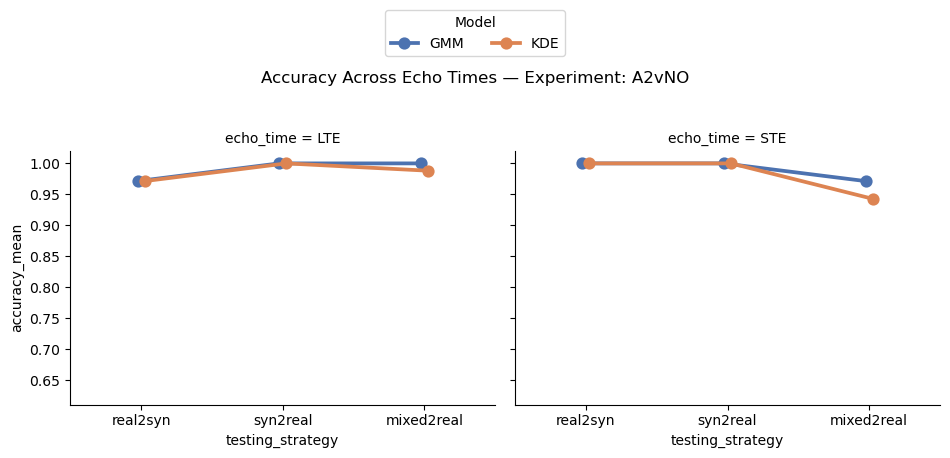


Visualizations for Experiment: MMvME


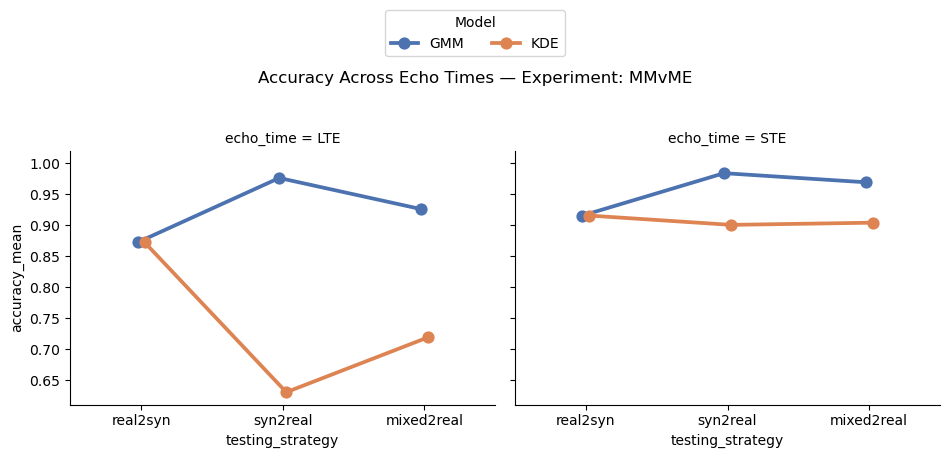


Visualizations for Experiment: MMvMEvA2


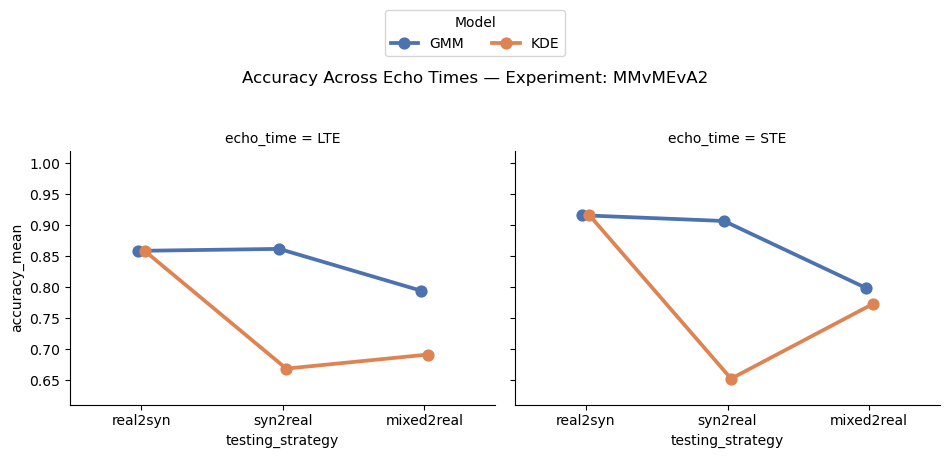


Visualizations for Experiment: MMvMEvNO


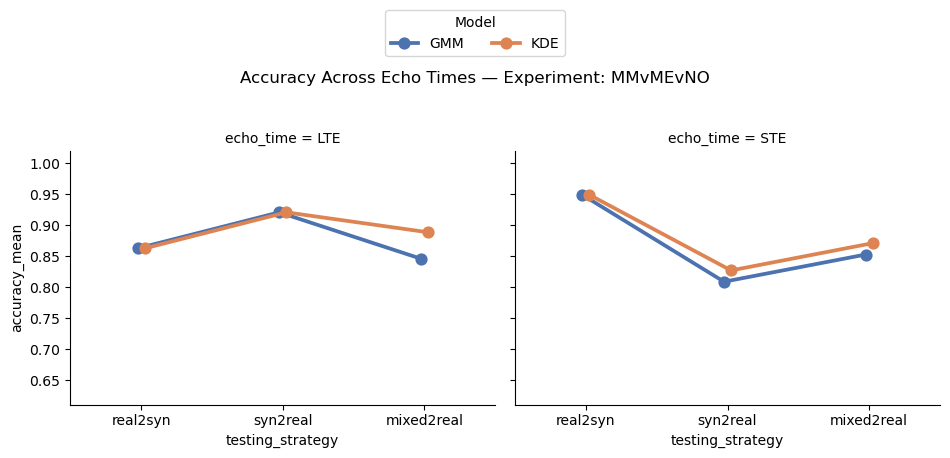


Visualizations for Experiment: MMvGLvA2


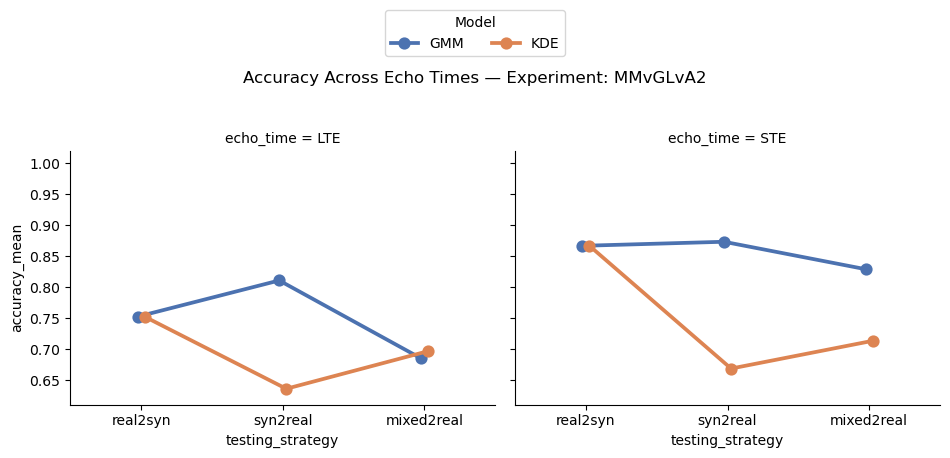


Visualizations for Experiment: MMvGLvNO


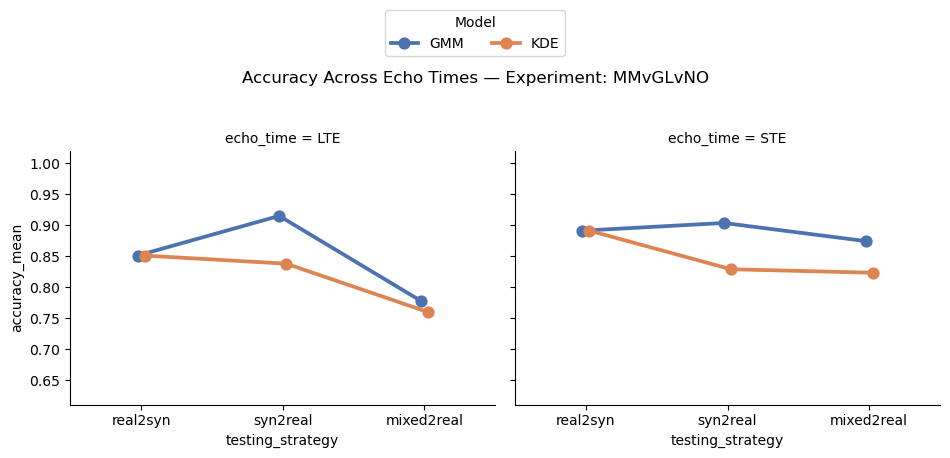

In [167]:
unique_experiments = df['experiment'].unique()

global_min = df['accuracy_mean'].min()
global_max = df['accuracy_mean'].max()
ymin = global_min - 0.02
ymax = global_max + 0.02

for exp in unique_experiments:
    exp_df = df[df['experiment'] == exp]
    echo_values = exp_df['echo_time'].unique()

    print(f"\nVisualizations for Experiment: {exp}")

    if len(echo_values) > 1:
        g = sns.FacetGrid(
            exp_df,
            col="echo_time",
            height=4,
            aspect=1.2,
            sharey=True
        )

        def plot_func(data, **kwargs):
            order = ["real2syn", "syn2real", "mixed2real"]

            # remove seaborn-injected kwargs we don’t control
            for x in ["color", "label", "linestyle"]:
                kwargs.pop(x, None)

            unique_models = data['model_type'].unique()

            if len(unique_models) > 1:
                sns.pointplot(
                    data=data,
                    x="testing_strategy",
                    y="accuracy_mean",
                    hue="model_type",   # <- restore coloring
                    palette="deep",      # <- color scheme
                    dodge=True,
                    capsize=0.15,
                    err_kws={'linewidth': 1},
                    order=order,
                    **kwargs
                )
            else:
                sns.pointplot(
                    data=data,
                    x="testing_strategy",
                    y="accuracy_mean",
                    order=order,
                    color=sns.color_palette("deep")[0],   # consistent per-model color
                    capsize=0.15,
                    err_kws={'linewidth': 1},
                    **kwargs
                )

        g.map_dataframe(plot_func)

        # put legend at figure level instead of per-facet
        handles, labels = g.axes[0][0].get_legend_handles_labels()
        g.fig.legend(handles, labels, title="Model", loc="upper center", bbox_to_anchor=(0.5, 1.15), ncol=2)

        g.set(ylim=(ymin, ymax))

        g.fig.subplots_adjust(top=0.78)
        g.fig.suptitle(f'Accuracy Across Echo Times — Experiment: {exp}')

        #plt.savefig(f'../../data/weights_imgs/classification/{exp}_accuracy.png')
        plt.show()

    else:
        print(f"Skipping facet plot: only echo={echo_values}")


### visualise best results

In [325]:
import numpy as np
import pandas as pd

summary_rows = []

for result_key, metrics in final_results.items():

    parts = result_key.split('_')
    model_type      = parts[0]
    exp_key         = parts[1]
    param_used      = parts[2]
    testing_strategy= parts[3]

    experiment      = exp_key.split('@')[0]
    echo_time       = exp_key.split('@')[1]

    summary_rows.append({
        "model_type": model_type,
        "experiment": experiment,
        "echo_time": echo_time,
        "param": param_used,
        "testing_strategy": testing_strategy,
        "accuracy": metrics["accuracy"],
        "selected_indices": metrics["selected_indices"]
    })

df_summary = pd.DataFrame(summary_rows)


In [326]:
print("\n\n==================== PERFORMANCE SUMMARY ====================\n")

for (model, experiment, echo), group in df_summary.groupby(["model_type", "experiment", "echo_time"]):

    print(f"\nMODEL={model} | EXPERIMENT={experiment} | ECHO={echo}")
    print("--------------------------------------------------------")

    for strategy in ["real2syn", "syn2real", "mixed2real"]:

        sg = group[group["testing_strategy"] == strategy]

        if len(sg) == 0:
            print(f"\n  Strategy={strategy}")
            print("    (no results)")
            continue

        accs = sg["accuracy"].values

        best_idx = np.argmax(accs)
        best_acc = accs[best_idx]
        best_param = sg.iloc[best_idx]["param"]
        best_feats = sg.iloc[best_idx]["selected_indices"]

        print(f"\n  Strategy={strategy}")
        print(f"    Avg accuracy = {accs.mean():.4f}")
        print(f"    Min accuracy = {accs.min():.4f}")
        print(f"    Max accuracy = {accs.max():.4f}")
        print(f"    RANGE        = {accs.max() - accs.min():.4f}")
        print(f"    Best param   = {best_param}")
        print(f"    Best acc     = {best_acc:.4f}")
        print(f"    Best feats   = {best_feats}")
    print("\n" + "="*60)




==================== PERFORMANCE SUMMARY ====================


MODEL=GMM | EXPERIMENT=A2vNO | ECHO=LTE
--------------------------------------------------------

  Strategy=real2syn
    Avg accuracy = 0.4100
    Min accuracy = 0.2500
    Max accuracy = 0.5000
    RANGE        = 0.2500
    Best param   = 4
    Best acc     = 0.5000
    Best feats   = [0 1]

  Strategy=syn2real
    Avg accuracy = 0.3600
    Min accuracy = 0.2000
    Max accuracy = 0.4500
    RANGE        = 0.2500
    Best param   = 10
    Best acc     = 0.4500
    Best feats   = [0 1]

  Strategy=mixed2real
    Avg accuracy = 0.3850
    Min accuracy = 0.1500
    Max accuracy = 0.6500
    RANGE        = 0.5000
    Best param   = 4
    Best acc     = 0.6500
    Best feats   = [0 1]


MODEL=GMM | EXPERIMENT=A2vNO | ECHO=STE
--------------------------------------------------------

  Strategy=real2syn
    Avg accuracy = 0.3100
    Min accuracy = 0.1000
    Max accuracy = 0.4000
    RANGE        = 0.3000
    Best param   = 

In [327]:
for (model, experiment, echo), group in df_summary.groupby(["model_type", "experiment", "echo_time"]):

    print(f"\nMODEL={model} | EXPERIMENT={experiment} | ECHO={echo}")
    print("--------------------------------------------------------")

    strategy_perf = {}

    for strategy in ["real2syn", "syn2real", "mixed2real"]:
        sg = group[group["testing_strategy"] == strategy]
        if len(sg) > 0:
            strategy_perf[strategy] = sg["accuracy"].mean()

    for strategy in sorted(strategy_perf, key=strategy_perf.get, reverse=True):
        print(f"  {strategy}: {strategy_perf[strategy]:.4f}")



MODEL=GMM | EXPERIMENT=A2vNO | ECHO=LTE
--------------------------------------------------------
  real2syn: 0.4100
  mixed2real: 0.3850
  syn2real: 0.3600

MODEL=GMM | EXPERIMENT=A2vNO | ECHO=STE
--------------------------------------------------------
  mixed2real: 0.3850
  real2syn: 0.3100
  syn2real: 0.2950

MODEL=GMM | EXPERIMENT=MMvGLvA2 | ECHO=LTE
--------------------------------------------------------
  real2syn: 0.4350
  mixed2real: 0.3300
  syn2real: 0.3250

MODEL=GMM | EXPERIMENT=MMvGLvA2 | ECHO=STE
--------------------------------------------------------
  real2syn: 0.3900
  mixed2real: 0.3300
  syn2real: 0.3300

MODEL=GMM | EXPERIMENT=MMvGLvNO | ECHO=LTE
--------------------------------------------------------
  syn2real: 0.3750
  real2syn: 0.3600
  mixed2real: 0.3350

MODEL=GMM | EXPERIMENT=MMvGLvNO | ECHO=STE
--------------------------------------------------------
  syn2real: 0.3500
  real2syn: 0.3300
  mixed2real: 0.3150

MODEL=GMM | EXPERIMENT=MMvME | ECHO=LTE
-----

In [332]:
import pandas as pd
import numpy as np

plot_rows = []

for key, metrics in final_results.items():

    parts = key.split("_")
    model      = parts[0]
    exp_key    = parts[1]
    param_used = parts[2]
    strategy   = parts[3]

    experiment = exp_key.split("@")[0]
    echo       = exp_key.split("@")[1]

    plot_rows.append({
        "model": model,
        "experiment": experiment,
        "echo": echo,
        "strategy": strategy,
        "param": param_used,
        "accuracy": metrics["accuracy"]
    })

df_plot = pd.DataFrame(plot_rows)


In [336]:
df_band = df_plot.groupby(["model","experiment","echo","strategy"])["accuracy"].agg(
    mean='mean',
    min='min',
    max='max',
    std='std'
).reset_index()


In [337]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid", font_scale=1.4)

def make_model_echo_plot(df, model, echo):
    df_sub = df[(df["model_type"] == model) & (df["echo_time"] == echo)]

    if len(df_sub) == 0:
        print(f"No data for {model} @ {echo}")
        return

    print(f"Plotting: {model} @ {echo}  (n={len(df_sub)})")

    plt.figure(figsize=(20,7))

    # all individual parameter dots
    sns.stripplot(
        data=df_sub,
        x="experiment",
        y="accuracy",
        hue="testing_strategy",
        dodge=True,
        jitter=0.35,
        size=7,
        alpha=0.28,
        edgecolor="black",
        linewidth=0.3
    )

    # strategy-level means
    sns.pointplot(
        data=df_sub,
        x="experiment",
        y="accuracy",
        hue="testing_strategy",
        dodge=0.55,
        join=True,
        estimator="mean",
        errorbar=None,
        markers="D",
        scale=1.4,
        linestyles="-",
        ci=None
    )

    plt.title(f"Accuracy Distribution for {model} @ {echo}")
    plt.ylim(0, 1.05)
    plt.xlabel("Experiment")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.tight_layout()
    plt.show()


Plotting: GMM @ LTE  (n=179)


C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(
C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(


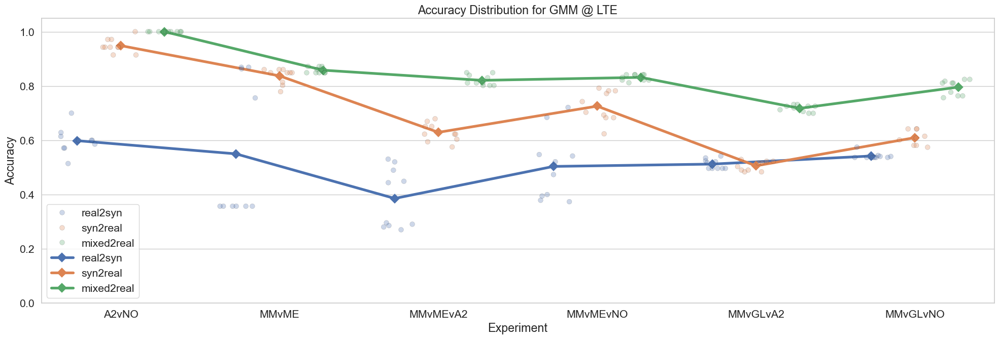

Plotting: GMM @ STE  (n=180)


C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(
C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(


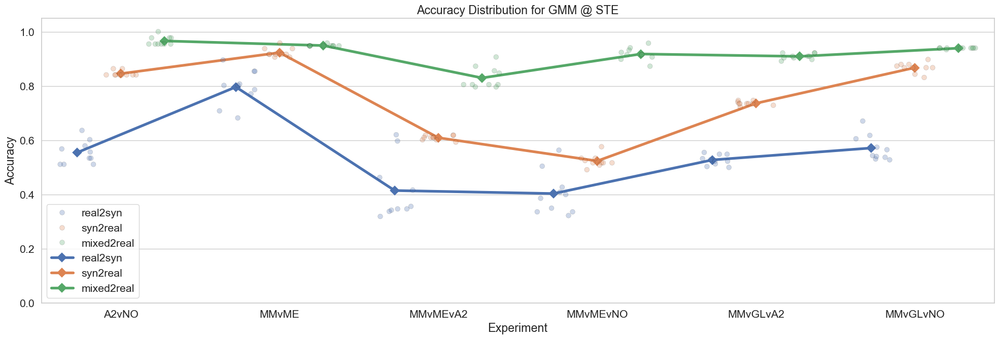

Plotting: KDE @ LTE  (n=540)


C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(
C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(


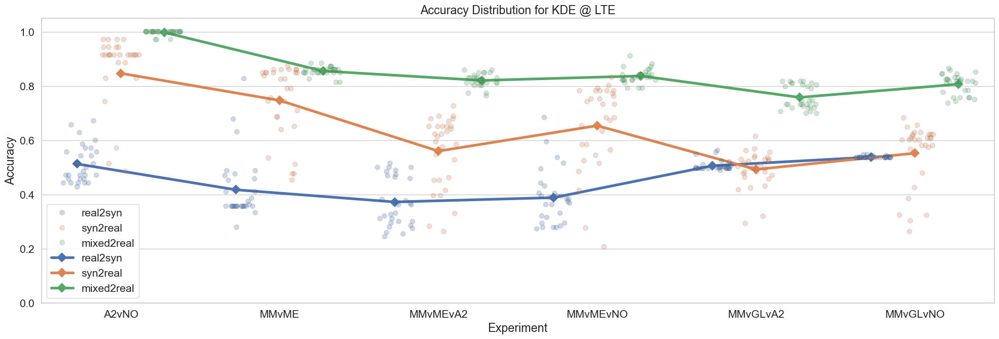

Plotting: KDE @ STE  (n=540)


C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(
C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
C:\Users\matth\AppData\Local\Temp\ipykernel_13956\1633534468.py:32: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(


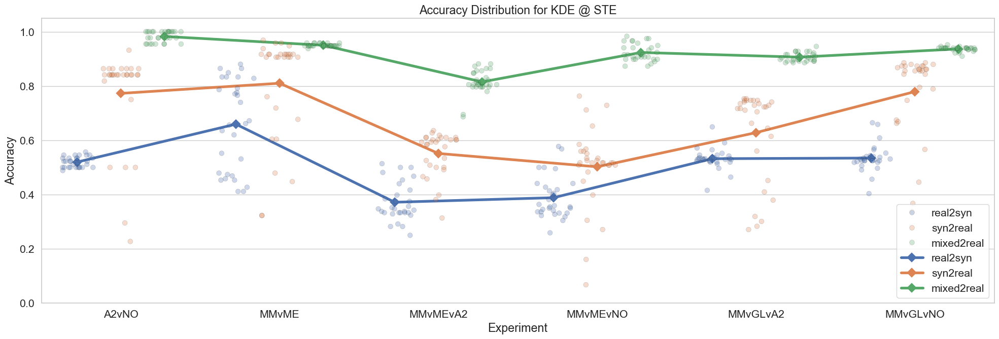

In [338]:
make_model_echo_plot(df, "GMM", "LTE")
make_model_echo_plot(df, "GMM", "STE")
make_model_echo_plot(df, "KDE", "LTE")
make_model_echo_plot(df, "KDE", "STE")
